#Study Population

/tmp/ipython-input-236176722.py:223: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


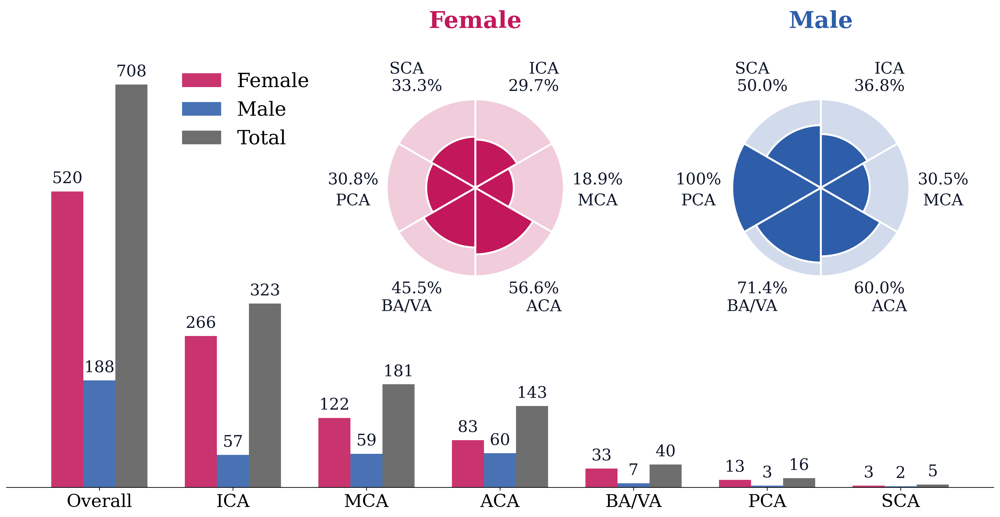

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# ----------------------------
# GLOBAL STYLE (Times New Roman + bigger fonts)
# ----------------------------
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman", "Times", "DejaVu Serif"]
plt.rcParams.update({
    "font.size": 20,
    "axes.titlesize": 20,
    "axes.labelsize": 20,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 22,
})

# ----------------------------
# DATA
# ----------------------------
data = {
    "Overall": {"UF": 351, "UM": 105, "RF": 169, "RM": 83, "F_total": 520, "M_total": 188, "Total": 708},
    "ICA":     {"UF": 187, "UM": 36,  "RF": 79,  "RM": 21, "F_total": 266, "M_total": 57,  "Total": 323},
    "MCA":     {"UF": 99,  "UM": 41,  "RF": 23,  "RM": 18, "F_total": 122, "M_total": 59,  "Total": 181},
    "ACA":     {"UF": 36,  "UM": 24,  "RF": 47,  "RM": 36, "F_total": 83,  "M_total": 60,  "Total": 143},
    "BA/VA":   {"UF": 18,  "UM": 2,   "RF": 15,  "RM": 5,  "F_total": 33,  "M_total": 7,   "Total": 40},
    "PCA":     {"UF": 9,   "UM": 0,   "RF": 4,   "RM": 3,  "F_total": 13,  "M_total": 3,   "Total": 16},
    "SCA":     {"UF": 2,   "UM": 1,   "RF": 1,   "RM": 1,  "F_total": 3,   "M_total": 2,   "Total": 5},
}
bar_locs = ["Overall", "ICA", "MCA", "ACA", "BA/VA", "PCA", "SCA"]
pie_locs = ["ICA", "MCA", "ACA", "BA/VA", "PCA", "SCA"]

# Colors (requested)
COL_F = "#C2185B"   # Female = pink
COL_M = "#2E5EAA"   # Male   = blue
COL_T = "#4A4A4A"   # Total  = green
TXT  = "#0f172a"
pale_alpha = 0.22
def pct(x, denom):
    return 0.0 if denom == 0 else 100.0 * x / denom

# ----------------------------
# Radial pie with radius-proportional ruptured portion
# (using sqrt so solid AREA is proportional to rupture%)
# ----------------------------
def rupture_radial_pie(ax, locs, rup_counts, tot_counts, vivid_color, title):
    ax.set_aspect("equal")
    ax.axis("off")

    n = len(locs)
    start_angle = 90
    slice_angle = 360.0 / n

    R_outer = 1.0
    label_r = 1.32
    name_r  = 1.55
    pale_alpha = 0.22

    ax.text(0, 1.75, title, ha="center", va="bottom",
            fontsize=26,  fontweight="bold", color=vivid_color)

    for i, loc in enumerate(locs):
        rup = float(rup_counts[i])
        tot = float(tot_counts[i])
        rr = 0.0 if tot == 0 else rup / tot

        th1 = start_angle - i * slice_angle
        th2 = th1 - slice_angle

        # Pale full slice
        ax.add_patch(Wedge(
            (0, 0), R_outer, th2, th1,
            width=R_outer,
            facecolor=(plt.matplotlib.colors.to_rgba(vivid_color, pale_alpha)),
            edgecolor="white", linewidth=2.2
        ))

        # Solid ruptured fill (radius)
        if rr > 0:
            r_solid = R_outer * np.sqrt(rr)
            ax.add_patch(Wedge(
                (0, 0), r_solid, th2, th1,
                width=r_solid,
                facecolor=vivid_color,
                edgecolor="white", linewidth=2.2
            ))

        mid = np.deg2rad((th1 + th2) / 2.0)
        # Format percentage (remove decimal if exactly 100)
        rr_pct = rr * 100.0
        if np.isclose(rr_pct, 100.0):
            pct_text = "100%"
        else:
            pct_text = f"{rr_pct:.1f}%"



        # # % label outside
        # ax.text(label_r * np.cos(mid), label_r * np.sin(mid),
        #         f"{rr_pct:.1f}%", ha="center", va="center",
        #         fontsize=18, color=TXT,
        #         bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="none", alpha=0.92))

        # # Location label
        # ax.text(name_r * np.cos(mid), name_r * np.sin(mid),
        #         loc, ha="center", va="center",
        #         fontsize=18, color=TXT)


        # Default positions (for all slices except ICA and PCA)
        x_pct = label_r * np.cos(mid)
        y_pct = label_r * np.sin(mid)

        x_loc = name_r * np.cos(mid)
        y_loc = name_r * np.sin(mid)

        # Special adjustment ONLY for ICA and PCA
        if loc in ["MCA", "PCA"]:
            extra_r = 0.06  # move further away from pie
            x_pct = (label_r + extra_r) * np.cos(mid)
            y_pct = (label_r + extra_r) * np.sin(mid)

            # Stack percentage above, location below
            offset = 0.06
            ax.text(x_pct, y_pct,
                    pct_text, ha="center", va="bottom",
                    fontsize=18, color=TXT,
                    bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="none", alpha=0.92))

            ax.text(x_pct, y_pct - offset,
                    loc, ha="center", va="top",
                    fontsize=18, color=TXT)

        else:
            # Original behavior for other slices
            ax.text(x_pct, y_pct,
                    pct_text, ha="center", va="center",
                    fontsize=18, color=TXT,
                    bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="none", alpha=0.92))

            ax.text(x_loc, y_loc,
                    loc, ha="center", va="center",
                    fontsize=18, color=TXT)

    ax.set_xlim(-1.95, 1.95)
    ax.set_ylim(-1.65, 2.05)

# ----------------------------
# BAR CHART (counts) + labels on bars
# ----------------------------
F_counts = np.array([data[l]["F_total"] for l in bar_locs])
M_counts = np.array([data[l]["M_total"] for l in bar_locs])
T_counts = np.array([data[l]["Total"]   for l in bar_locs])

x = np.arange(len(bar_locs))
w = 0.24

fig, ax = plt.subplots(figsize=(16, 7.6), dpi=300)

barsF = ax.bar(x - w, F_counts, width=w, color=COL_F, alpha=0.88, label="Female")
barsM = ax.bar(x,      M_counts, width=w, color=COL_M, alpha=0.88, label="Male")
barsT = ax.bar(x + w,  T_counts, width=w, color=COL_T, alpha=0.80, label="Total")

# Numbers on bars
pad = max(T_counts) * 0.012
def label_bars(bars):
    for b in bars:
        h = b.get_height()
        ax.text(b.get_x() + b.get_width()/2, h + pad, f"{int(h)}",
                ha="center", va="bottom", fontsize=18, color=TXT)
label_bars(barsF); label_bars(barsM); label_bars(barsT)

# Clean axes (no y axis)
ax.set_yticks([])
ax.set_ylabel("")
ax.spines["left"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.set_xticks(x)
ax.set_xticklabels(bar_locs, fontsize=20)

# Vertical legend
ax.legend(
    ncol=1, frameon=False, loc="upper left",
    bbox_to_anchor=(0.17, 1.0), borderaxespad=0.0
)

# ----------------------------
# BIG pies, moved up, farther apart
# ----------------------------
female_rup = np.array([data[l]["RF"] for l in pie_locs], float)
female_tot = np.array([data[l]["F_total"] for l in pie_locs], float)

male_rup   = np.array([data[l]["RM"] for l in pie_locs], float)
male_tot   = np.array([data[l]["M_total"] for l in pie_locs], float)

# Placement knobs
y0 = 0.35   # higher = move up
h  = 0.8   # taller = bigger
w_in = 0.35 # wider  = bigger
gap = 0.0  # farther apart

x_left  = 0.3
x_right = x_left + w_in + gap

ax_f = inset_axes(
    ax, width="100%", height="100%",
    bbox_to_anchor=(x_left,  y0, w_in, h),
    bbox_transform=ax.transAxes, loc="lower left", borderpad=0
)
ax_m = inset_axes(
    ax, width="100%", height="100%",
    bbox_to_anchor=(x_right, y0, w_in, h),
    bbox_transform=ax.transAxes, loc="lower left", borderpad=0
)

rupture_radial_pie(ax_f, pie_locs, female_rup, female_tot, COL_F, "Female")
rupture_radial_pie(ax_m, pie_locs, male_rup,   male_tot,   COL_M, "Male")

plt.tight_layout()
plt.savefig("bars_pies_times_new_roman.png", dpi=300, bbox_inches="tight")
plt.savefig("bars_pies_times_new_roman.pdf", bbox_inches="tight")
plt.show()

/tmp/ipython-input-550627656.py:208: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


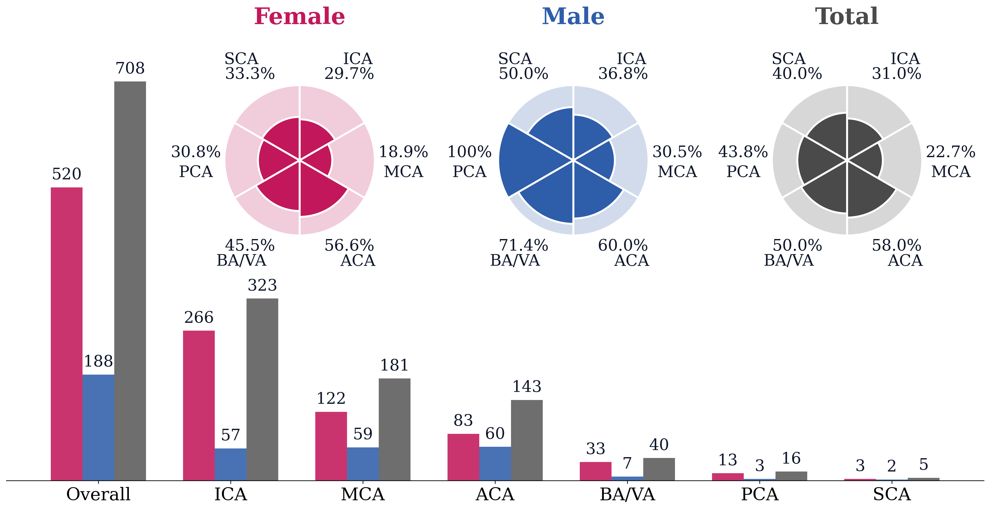

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# ----------------------------
# GLOBAL STYLE (serif fallback for Colab)
# ----------------------------
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman", "Times", "DejaVu Serif"]
plt.rcParams.update({
    "font.size": 20,
    "axes.titlesize": 20,
    "axes.labelsize": 20,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 22,
})

# ----------------------------
# DATA
# ----------------------------
data = {
    "Overall": {"UF": 351, "UM": 105, "RF": 169, "RM": 83, "F_total": 520, "M_total": 188, "Total": 708},
    "ICA":     {"UF": 187, "UM": 36,  "RF": 79,  "RM": 21, "F_total": 266, "M_total": 57,  "Total": 323},
    "MCA":     {"UF": 99,  "UM": 41,  "RF": 23,  "RM": 18, "F_total": 122, "M_total": 59,  "Total": 181},
    "ACA":     {"UF": 36,  "UM": 24,  "RF": 47,  "RM": 36, "F_total": 83,  "M_total": 60,  "Total": 143},
    "BA/VA":   {"UF": 18,  "UM": 2,   "RF": 15,  "RM": 5,  "F_total": 33,  "M_total": 7,   "Total": 40},
    "PCA":     {"UF": 9,   "UM": 0,   "RF": 4,   "RM": 3,  "F_total": 13,  "M_total": 3,   "Total": 16},
    "SCA":     {"UF": 2,   "UM": 1,   "RF": 1,   "RM": 1,  "F_total": 3,   "M_total": 2,   "Total": 5},
}

bar_locs = ["Overall", "ICA", "MCA", "ACA", "BA/VA", "PCA", "SCA"]
pie_locs = ["ICA", "MCA", "ACA", "BA/VA", "PCA", "SCA"]

# Colors (your palette)
COL_F = "#C2185B"   # Female (pink)
COL_M = "#2E5EAA"   # Male (blue)
COL_T = "#4A4A4A"   # Total (charcoal)
TXT  = "#0f172a"
pale_alpha = 0.22

def pct(x, denom):
    return 0.0 if denom == 0 else 100.0 * x / denom

# ----------------------------
# Radial pie with radius-proportional ruptured portion
# ----------------------------
def rupture_radial_pie(ax, locs, rup_counts, tot_counts, vivid_color, title):
    ax.set_aspect("equal")
    ax.axis("off")

    n = len(locs)
    start_angle = 90
    slice_angle = 360.0 / n

    R_outer = 1.0
    label_r = 1.32
    name_r  = 1.55

    ax.text(0, 1.75, title, ha="center", va="bottom",
            fontsize=26, fontweight="bold", color=vivid_color)

    for i, loc in enumerate(locs):
        rup = float(rup_counts[i])
        tot = float(tot_counts[i])
        rr = 0.0 if tot == 0 else rup / tot

        th1 = start_angle - i * slice_angle
        th2 = th1 - slice_angle

        # Pale full slice
        ax.add_patch(Wedge(
            (0, 0), R_outer, th2, th1,
            width=R_outer,
            facecolor=(plt.matplotlib.colors.to_rgba(vivid_color, pale_alpha)),
            edgecolor="white", linewidth=2.2
        ))

        # Solid ruptured fill: sqrt so AREA matches rupture%
        if rr > 0:
            r_solid = R_outer * np.sqrt(rr)
            ax.add_patch(Wedge(
                (0, 0), r_solid, th2, th1,
                width=r_solid,
                facecolor=vivid_color,
                edgecolor="white", linewidth=2.2
            ))

        mid = np.deg2rad((th1 + th2) / 2.0)

        rr_pct = rr * 100.0
        if np.isclose(rr_pct, 100.0):
            pct_text = "100%"
        else:
            pct_text = f"{rr_pct:.1f}%"

        # Default positions
        x_pct = label_r * np.cos(mid)
        y_pct = label_r * np.sin(mid)
        x_loc = name_r  * np.cos(mid)
        y_loc = name_r  * np.sin(mid)

        # Special handling ONLY for MCA and PCA (as you coded)
        if loc in ["MCA", "PCA"]:
            extra_r = 0.06
            x_pct = (label_r + extra_r) * np.cos(mid)
            y_pct = (label_r + extra_r) * np.sin(mid)

            offset = 0.06
            ax.text(x_pct, y_pct,
                    pct_text, ha="center", va="bottom",
                    fontsize=18, color=TXT,
                    bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="none", alpha=0.92))
            ax.text(x_pct, y_pct - offset,
                    loc, ha="center", va="top",
                    fontsize=18, color=TXT)
        else:
            ax.text(x_pct, y_pct,
                    pct_text, ha="center", va="center",
                    fontsize=18, color=TXT,
                    bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="none", alpha=0.92))
            ax.text(x_loc, y_loc,
                    loc, ha="center", va="center",
                    fontsize=18, color=TXT)

    ax.set_xlim(-1.95, 1.95)
    ax.set_ylim(-1.65, 2.05)

# ----------------------------
# BAR CHART (counts) + labels
# ----------------------------
F_counts = np.array([data[l]["F_total"] for l in bar_locs])
M_counts = np.array([data[l]["M_total"] for l in bar_locs])
T_counts = np.array([data[l]["Total"]   for l in bar_locs])

x = np.arange(len(bar_locs))
w = 0.24

fig, ax = plt.subplots(figsize=(16, 7.6), dpi=300)

barsF = ax.bar(x - w, F_counts, width=w, color=COL_F, alpha=0.88)
barsM = ax.bar(x,      M_counts, width=w, color=COL_M, alpha=0.88)
barsT = ax.bar(x + w,  T_counts, width=w, color=COL_T, alpha=0.80)

# numbers on bars
pad = max(T_counts) * 0.012
def label_bars(bars):
    for b in bars:
        h = b.get_height()
        ax.text(b.get_x() + b.get_width()/2, h + pad, f"{int(h)}",
                ha="center", va="bottom", fontsize=18, color=TXT)
label_bars(barsF); label_bars(barsM); label_bars(barsT)

# Clean axes (no y axis)
ax.set_yticks([])
ax.set_ylabel("")
ax.spines["left"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.set_xticks(x)
ax.set_xticklabels(bar_locs, fontsize=20)

# ✅ remove legend entirely
# ax.legend(...)  <-- deleted on purpose

# ----------------------------
# PIES: Female + Male moved left, add Total pie
# ----------------------------
female_rup = np.array([data[l]["RF"] for l in pie_locs], float)
female_tot = np.array([data[l]["F_total"] for l in pie_locs], float)

male_rup   = np.array([data[l]["RM"] for l in pie_locs], float)
male_tot   = np.array([data[l]["M_total"] for l in pie_locs], float)

# Total across sexes, per location
total_rup  = np.array([data[l]["RF"] + data[l]["RM"] for l in pie_locs], float)
total_tot  = np.array([data[l]["Total"] for l in pie_locs], float)

# Placement knobs (3 pies in a row)
y0   = 0.4
h    = 0.80
w_in = 0.3
gap  = -0.02

# Shift row to the LEFT
x1 = 0.15
x2 = x1 + w_in + gap
x3 = x2 + w_in + gap

ax_f = inset_axes(ax, width="100%", height="100%",
                  bbox_to_anchor=(x1, y0, w_in, h),
                  bbox_transform=ax.transAxes, loc="lower left", borderpad=0)

ax_m = inset_axes(ax, width="100%", height="100%",
                  bbox_to_anchor=(x2, y0, w_in, h),
                  bbox_transform=ax.transAxes, loc="lower left", borderpad=0)

ax_t = inset_axes(ax, width="100%", height="100%",
                  bbox_to_anchor=(x3, y0, w_in, h),
                  bbox_transform=ax.transAxes, loc="lower left", borderpad=0)

rupture_radial_pie(ax_f, pie_locs, female_rup, female_tot, COL_F, "Female")
rupture_radial_pie(ax_m, pie_locs, male_rup,   male_tot,   COL_M, "Male")
rupture_radial_pie(ax_t, pie_locs, total_rup,  total_tot,  COL_T, "Total")

plt.tight_layout()
plt.savefig("bars_3pies_times_serif.png", dpi=300, bbox_inches="tight")
plt.savefig("bars_3pies_times_serif.pdf", bbox_inches="tight")
plt.show()

/tmp/ipykernel_1545/707248747.py:21: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace({


Train shape: (632, 56)
Test shape: (76, 56)
Training Overall: {'UF': 329, 'UM': 96, 'RF': 137, 'RM': 70, 'F_total': 466, 'M_total': 166, 'Total': 632}
Testing Overall: {'UF': 22, 'UM': 8, 'RF': 32, 'RM': 14, 'F_total': 54, 'M_total': 22, 'Total': 76}


/tmp/ipykernel_1545/707248747.py:289: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


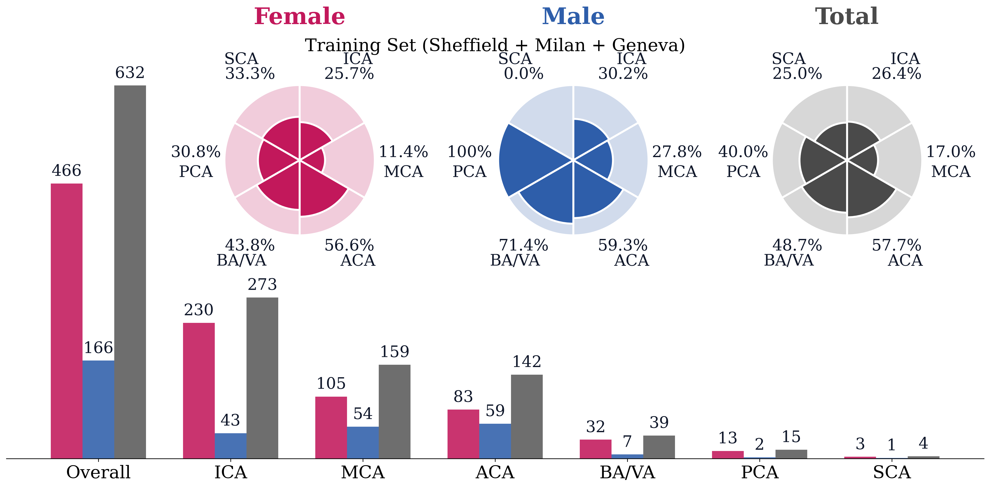

/tmp/ipykernel_1545/707248747.py:289: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


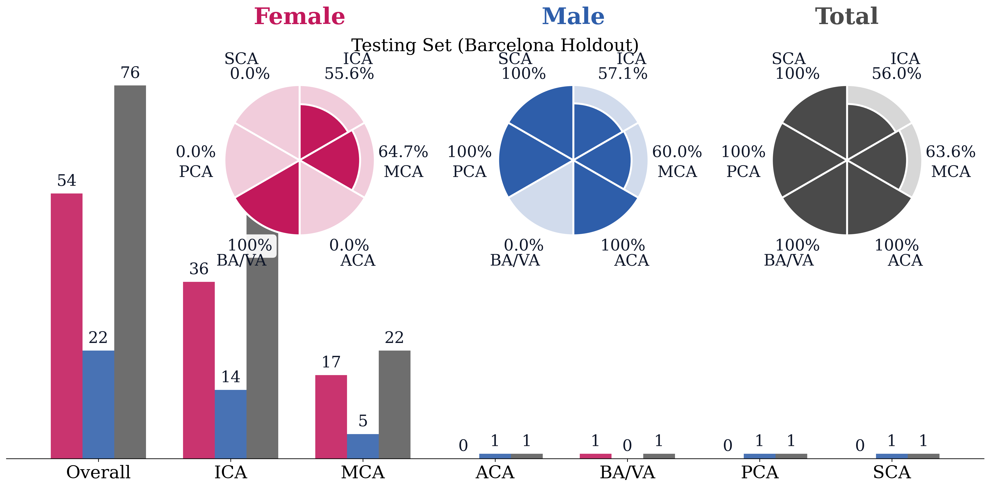

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os

# ============================
# LOAD DATA
# ============================
df = pd.read_excel(os.path.join('..', 'content', 'ClassificationV2.xlsx'))

mapping_Sex = {'Male': 0, 'Female': 1}
mapping_Irregularity = {'R': 0, 'I': 1}
mapping_Kind = {'L': 0, 'B': 1}
mapping_Location = {'MCA': 0, 'ICA': 1, 'ACA': 2, 'PCA': 3, 'VA': 4, 'BA': 4, 'SCA': 5}
mapping_Stability = {'stable': 0, 'unstable': 1}
mapping_Complexity = {'simple': 0, 'complex': 1}
mapping_Status = {'unruptured': 0, 'ruptured': 1}

df = df.replace({
    'Sex': mapping_Sex,
    'I': mapping_Irregularity,
    'LB': mapping_Kind,
    'Location': mapping_Location,
    'FS': mapping_Stability,
    'FC': mapping_Complexity,
    'Status': mapping_Status
})

df = df.drop(labels='Vessel ID', axis=1)

# ============================
# HOLD OUT BARCELONA
# rows 557 to 632 inclusive
# ============================
barcelona_start = 557
barcelona_end = 632

test_idx = np.arange(barcelona_start, barcelona_end + 1)
train_idx = df.index.difference(test_idx)

df_train = df.loc[train_idx].copy()
df_test  = df.loc[test_idx].copy()

print("Train shape:", df_train.shape)
print("Test shape:", df_test.shape)

# ============================
# MAKE A PLOTTING COPY WITH LABELS
# ============================
sex_inverse = {0: 'Male', 1: 'Female'}
status_inverse = {0: 'Unruptured', 1: 'Ruptured'}
location_inverse = {
    0: 'MCA',
    1: 'ICA',
    2: 'ACA',
    3: 'PCA',
    4: 'BA/VA',
    5: 'SCA'
}

def make_plotting_df(df_in):
    d = df_in.copy()
    d['Sex_label'] = d['Sex'].map(sex_inverse)
    d['Status_label'] = d['Status'].map(status_inverse)
    d['Location_label'] = d['Location'].map(location_inverse)
    return d

plot_train = make_plotting_df(df_train)
plot_test = make_plotting_df(df_test)

# ============================
# BUILD DATA DICTIONARY
# ============================
bar_locs = ["Overall", "ICA", "MCA", "ACA", "BA/VA", "PCA", "SCA"]
pie_locs = ["ICA", "MCA", "ACA", "BA/VA", "PCA", "SCA"]
ordered_locs = ["ICA", "MCA", "ACA", "BA/VA", "PCA", "SCA"]

def build_plot_data(df_subset):
    result = {}

    UF = ((df_subset['Status_label'] == "Unruptured") & (df_subset['Sex_label'] == "Female")).sum()
    UM = ((df_subset['Status_label'] == "Unruptured") & (df_subset['Sex_label'] == "Male")).sum()
    RF = ((df_subset['Status_label'] == "Ruptured") & (df_subset['Sex_label'] == "Female")).sum()
    RM = ((df_subset['Status_label'] == "Ruptured") & (df_subset['Sex_label'] == "Male")).sum()

    result["Overall"] = {
        "UF": int(UF),
        "UM": int(UM),
        "RF": int(RF),
        "RM": int(RM),
        "F_total": int((df_subset['Sex_label'] == "Female").sum()),
        "M_total": int((df_subset['Sex_label'] == "Male").sum()),
        "Total": int(len(df_subset)),
    }

    for loc in ordered_locs:
        dloc = df_subset[df_subset['Location_label'] == loc]

        UF = ((dloc['Status_label'] == "Unruptured") & (dloc['Sex_label'] == "Female")).sum()
        UM = ((dloc['Status_label'] == "Unruptured") & (dloc['Sex_label'] == "Male")).sum()
        RF = ((dloc['Status_label'] == "Ruptured") & (dloc['Sex_label'] == "Female")).sum()
        RM = ((dloc['Status_label'] == "Ruptured") & (dloc['Sex_label'] == "Male")).sum()

        result[loc] = {
            "UF": int(UF),
            "UM": int(UM),
            "RF": int(RF),
            "RM": int(RM),
            "F_total": int((dloc['Sex_label'] == "Female").sum()),
            "M_total": int((dloc['Sex_label'] == "Male").sum()),
            "Total": int(len(dloc)),
        }

    return result

train_data = build_plot_data(plot_train)
test_data = build_plot_data(plot_test)

print("Training Overall:", train_data["Overall"])
print("Testing Overall:", test_data["Overall"])

# ============================
# GLOBAL STYLE
# ============================
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman", "Times", "DejaVu Serif"]
plt.rcParams.update({
    "font.size": 20,
    "axes.titlesize": 20,
    "axes.labelsize": 20,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 22,
})

COL_F = "#C2185B"
COL_M = "#2E5EAA"
COL_T = "#4A4A4A"
TXT  = "#0f172a"
pale_alpha = 0.22

def rupture_radial_pie(ax, locs, rup_counts, tot_counts, vivid_color, title):
    ax.set_aspect("equal")
    ax.axis("off")

    n = len(locs)
    start_angle = 90
    slice_angle = 360.0 / n

    R_outer = 1.0
    label_r = 1.32
    name_r  = 1.55

    ax.text(0, 1.75, title, ha="center", va="bottom",
            fontsize=26, fontweight="bold", color=vivid_color)

    for i, loc in enumerate(locs):
        rup = float(rup_counts[i])
        tot = float(tot_counts[i])
        rr = 0.0 if tot == 0 else rup / tot

        th1 = start_angle - i * slice_angle
        th2 = th1 - slice_angle

        ax.add_patch(Wedge(
            (0, 0), R_outer, th2, th1,
            width=R_outer,
            facecolor=(plt.matplotlib.colors.to_rgba(vivid_color, pale_alpha)),
            edgecolor="white", linewidth=2.2
        ))

        if rr > 0:
            r_solid = R_outer * np.sqrt(rr)
            ax.add_patch(Wedge(
                (0, 0), r_solid, th2, th1,
                width=r_solid,
                facecolor=vivid_color,
                edgecolor="white", linewidth=2.2
            ))

        mid = np.deg2rad((th1 + th2) / 2.0)
        rr_pct = rr * 100.0
        pct_text = "100%" if np.isclose(rr_pct, 100.0) else f"{rr_pct:.1f}%"

        x_pct = label_r * np.cos(mid)
        y_pct = label_r * np.sin(mid)
        x_loc = name_r  * np.cos(mid)
        y_loc = name_r  * np.sin(mid)

        if loc in ["MCA", "PCA"]:
            extra_r = 0.06
            x_pct = (label_r + extra_r) * np.cos(mid)
            y_pct = (label_r + extra_r) * np.sin(mid)

            offset = 0.06
            ax.text(x_pct, y_pct, pct_text,
                    ha="center", va="bottom",
                    fontsize=18, color=TXT,
                    bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="none", alpha=0.92))
            ax.text(x_pct, y_pct - offset, loc,
                    ha="center", va="top",
                    fontsize=18, color=TXT)
        else:
            ax.text(x_pct, y_pct, pct_text,
                    ha="center", va="center",
                    fontsize=18, color=TXT,
                    bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="none", alpha=0.92))
            ax.text(x_loc, y_loc, loc,
                    ha="center", va="center",
                    fontsize=18, color=TXT)

    ax.set_xlim(-1.95, 1.95)
    ax.set_ylim(-1.65, 2.05)

def plot_dataset_summary(data_dict, figure_title=None, save_prefix=None):
    F_counts = np.array([data_dict[l]["F_total"] for l in bar_locs])
    M_counts = np.array([data_dict[l]["M_total"] for l in bar_locs])
    T_counts = np.array([data_dict[l]["Total"]   for l in bar_locs])

    x = np.arange(len(bar_locs))
    w = 0.24

    fig, ax = plt.subplots(figsize=(16, 7.6), dpi=300)

    barsF = ax.bar(x - w, F_counts, width=w, color=COL_F, alpha=0.88)
    barsM = ax.bar(x,      M_counts, width=w, color=COL_M, alpha=0.88)
    barsT = ax.bar(x + w,  T_counts, width=w, color=COL_T, alpha=0.80)

    pad = max(T_counts) * 0.012 if max(T_counts) > 0 else 0.2

    def label_bars(bars):
        for b in bars:
            h = b.get_height()
            ax.text(b.get_x() + b.get_width()/2, h + pad, f"{int(h)}",
                    ha="center", va="bottom", fontsize=18, color=TXT)

    label_bars(barsF)
    label_bars(barsM)
    label_bars(barsT)

    ax.set_yticks([])
    ax.set_ylabel("")
    ax.spines["left"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.set_xticks(x)
    ax.set_xticklabels(bar_locs, fontsize=20)

    if figure_title is not None:
        ax.set_title(figure_title, pad=18)

    female_rup = np.array([data_dict[l]["RF"] for l in pie_locs], float)
    female_tot = np.array([data_dict[l]["F_total"] for l in pie_locs], float)

    male_rup   = np.array([data_dict[l]["RM"] for l in pie_locs], float)
    male_tot   = np.array([data_dict[l]["M_total"] for l in pie_locs], float)

    total_rup  = np.array([data_dict[l]["RF"] + data_dict[l]["RM"] for l in pie_locs], float)
    total_tot  = np.array([data_dict[l]["Total"] for l in pie_locs], float)

    y0   = 0.4
    h    = 0.80
    w_in = 0.3
    gap  = -0.02

    x1 = 0.15
    x2 = x1 + w_in + gap
    x3 = x2 + w_in + gap

    ax_f = inset_axes(ax, width="100%", height="100%",
                      bbox_to_anchor=(x1, y0, w_in, h),
                      bbox_transform=ax.transAxes, loc="lower left", borderpad=0)

    ax_m = inset_axes(ax, width="100%", height="100%",
                      bbox_to_anchor=(x2, y0, w_in, h),
                      bbox_transform=ax.transAxes, loc="lower left", borderpad=0)

    ax_t = inset_axes(ax, width="100%", height="100%",
                      bbox_to_anchor=(x3, y0, w_in, h),
                      bbox_transform=ax.transAxes, loc="lower left", borderpad=0)

    rupture_radial_pie(ax_f, pie_locs, female_rup, female_tot, COL_F, "Female")
    rupture_radial_pie(ax_m, pie_locs, male_rup,   male_tot,   COL_M, "Male")
    rupture_radial_pie(ax_t, pie_locs, total_rup,  total_tot,  COL_T, "Total")

    plt.tight_layout()

    if save_prefix is not None:
        plt.savefig(f"{save_prefix}.png", dpi=300, bbox_inches="tight")
        plt.savefig(f"{save_prefix}.pdf", bbox_inches="tight")

    plt.show()

# ============================
# PLOT TRAIN AND TEST
# ============================
plot_dataset_summary(
    train_data,
    figure_title="Training Set (Sheffield + Milan + Geneva)",
    save_prefix="train_set_summary"
)

plot_dataset_summary(
    test_data,
    figure_title="Testing Set (Barcelona Holdout)",
    save_prefix="test_set_summary"
)

#Load Dateset

In [ ]:
import pandas as pd
import numpy as np
import os

df = pd.read_excel(os.path.join('..','content','ClassificationV2.xlsx'))
mapping_Sex = {'Male': 0, 'Female': 1}
mapping_Irregularity = {'R': 0, 'I': 1}
mapping_Kind = {'L': 0, 'B': 1}
mapping_Location = {'MCA': 0, 'ICA': 1, 'ACA': 2, 'PCA': 3, 'VA': 4, 'BA': 4, 'SCA': 5}
mapping_Stability = {'stable': 0, 'unstable': 1}
mapping_Complexity = {'simple': 0, 'complex': 1}
mapping_Status = {'unruptured': 0, 'ruptured': 1}
df = df.replace({'Sex': mapping_Sex, 'I': mapping_Irregularity, 'LB': mapping_Kind, 'Location': mapping_Location, 'FS': mapping_Stability, 'FC': mapping_Complexity, 'Status': mapping_Status})
df = df.drop(labels = 'Vessel ID', axis = 1)
H = np.array(df)
H = np.array(list(H[:,:]), dtype=np.float64)

/tmp/ipykernel_1545/1584575142.py:13: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace({'Sex': mapping_Sex, 'I': mapping_Irregularity, 'LB': mapping_Kind, 'Location': mapping_Location, 'FS': mapping_Stability, 'FC': mapping_Complexity, 'Status': mapping_Status})


## Data Standardization & Split

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

y = H[:,-1]
x = H[:,:-1]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=8)
standardization = StandardScaler().fit(x_train)
x_train = standardization.transform(x_train)
x_test = standardization.transform(x_test)

## Data Scattering

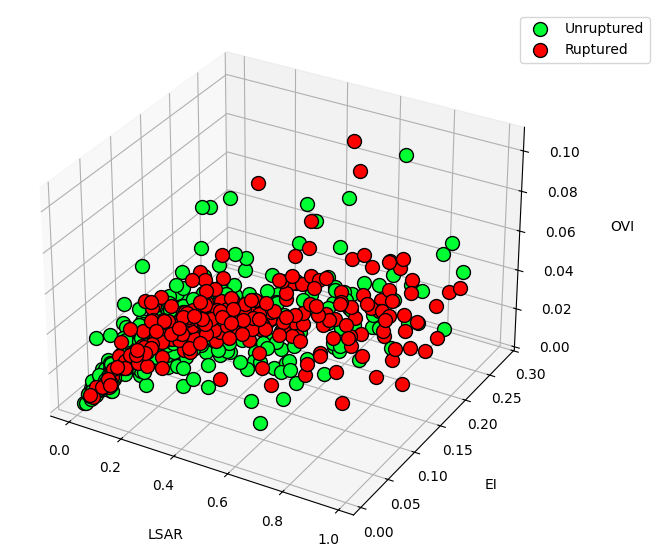

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties


font = {'family' : 'arial',
    'serif' : ['arial'],
    'weight' : 'medium',
    'size'   : 24,
    'style'  : 'normal'}


u, r = list(),list()
for i in range(len(y)):
  if y[i] == 0:
    u.append(i)
  elif y[i] == 1:
    r.append(i)

attributes = df.columns.values


def find_index(name):
  for i in range(len(attributes)):
    if name == attributes[i]:
      return i


def data_scatter3d(u, r, first_axis, second_axis, third_axis):
  first_axis = find_index(first_axis)
  second_axis = find_index(second_axis)
  third_axis = find_index(third_axis)
  fig = plt.figure(figsize=(9,7))
  ax = plt.subplot(111,projection='3d')
  ax.plot(x[u,first_axis],x[u,second_axis],x[u,third_axis],'o',markerfacecolor=(0,1,0.2),markeredgecolor='k',ms=10,label='Unruptured')
  ax.plot(x[r,first_axis],x[r,second_axis],x[r,third_axis],'o',markerfacecolor='red',markeredgecolor='k',ms=10,label='Ruptured')
  ax.set_xlabel(attributes[first_axis], labelpad=15)
  ax.set_ylabel(attributes[second_axis], labelpad=15)
  ax.set_zlabel(attributes[third_axis], labelpad=25)
  ax.tick_params(axis='z', which='major', pad=10)
  # ax.view_init(elev=25, azim=40)
  # fig.tight_layout()
  ax.legend(loc='best', bbox_to_anchor=(1.2, 1))
  ax.dist = 12
  plt.savefig('3D_DataScattering.pdf', transparent=True, dpi=300)
  plt.show()
  return


def data_scatter2d(u, r, first_axis, second_axis):
  first_axis = find_index(first_axis)
  second_axis = find_index(second_axis)
  plt.plot(x[u,first_axis],x[u,second_axis],'o',markerfacecolor=(0,1,0.2),markeredgecolor='k',ms=10,label='Unruptured')
  plt.plot(x[r,first_axis],x[r,second_axis],'o',markerfacecolor='red',markeredgecolor='k',ms=10,label='Ruptured')
  plt.title('2D Data Scattering')
  plt.subplot().set(facecolor='none')
  plt.xlabel(attributes[first_axis])
  plt.ylabel(attributes[second_axis])
  plt.legend(loc=(0.8,0.60))
  plt.savefig('plot.pdf', transparent=True, dpi=300)
  plt.show()
  return

# plt.savefig('plot.png', transparent=True)
data_scatter3d(u, r, 'LSAR', 'EI', 'OVI')
# data_scatter2d(u, r, 'EI', 'DV')

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


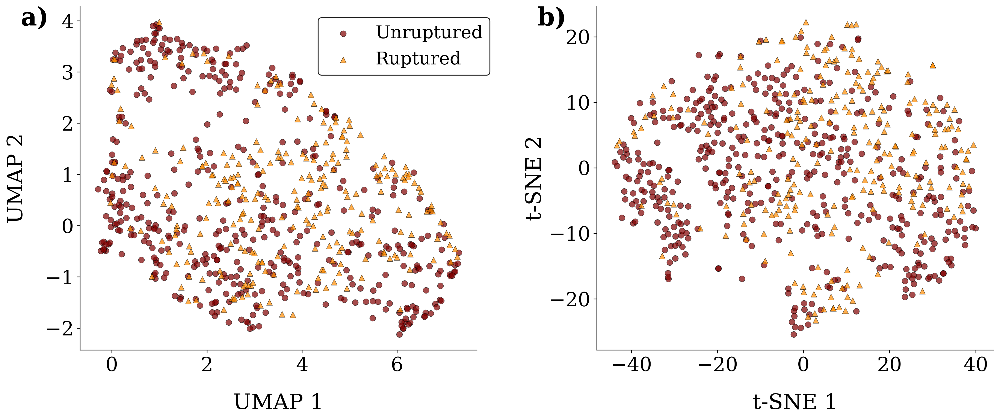

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 22,
    "axes.labelsize": 24,
    "xtick.labelsize": 22,
    "ytick.labelsize": 22,
    "legend.fontsize": 20,
})

COL_U = "#800000"   # Maroon
COL_R = "#FF8C00"   # Orange
EDGE  = (0, 0, 0, 0.18)

def umap_tsne_horizontal(x, y,
                         umap_neighbors=25,
                         umap_min_dist=0.15,
                         tsne_perplexity=30,
                         random_state=42):

    x = np.asarray(x)
    y = np.asarray(y)

    Xs = StandardScaler().fit_transform(x)

    # ---- UMAP (fallback to PCA if umap not installed)
    try:
        import umap
        reducer = umap.UMAP(
            n_neighbors=umap_neighbors,
            min_dist=umap_min_dist,
            random_state=random_state
        )
        Z_umap = reducer.fit_transform(Xs)
    except Exception:
        Z_umap = PCA(n_components=2, random_state=random_state).fit_transform(Xs)

    # ---- t-SNE
    Z_tsne = TSNE(
        n_components=2,
        perplexity=tsne_perplexity,
        learning_rate="auto",
        init="pca",
        random_state=random_state
    ).fit_transform(Xs)

    fig, axes = plt.subplots(1, 2, figsize=(16, 7), dpi=300)

    # ---------- Panel (a): UMAP ----------
    ax = axes[0]
    ax.scatter(Z_umap[y==0, 0], Z_umap[y==0, 1],
               s=45, c=COL_U, alpha=0.7,
               edgecolors=EDGE, linewidths=0.4, label="Unruptured")
    ax.scatter(Z_umap[y==1, 0], Z_umap[y==1, 1],
               s=45, c=COL_R, alpha=0.7,
               edgecolors=EDGE, linewidths=0.4, label="Ruptured", marker='^')

    ax.set_xlabel("UMAP 1", labelpad=20)
    ax.set_ylabel("UMAP 2", labelpad=20)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.text(-0.15, 1.0, "a)", transform=ax.transAxes,
            fontsize=28, fontweight="bold", va="top")

    ax.legend(
      loc=(0.6,0.8),
      ncol=1,
      frameon=True,
      fancybox=True,
      framealpha=0.9,
      edgecolor="black")
    # ---------- Panel (b): t-SNE ----------
    ax = axes[1]
    ax.scatter(Z_tsne[y==0, 0], Z_tsne[y==0, 1],
               s=45, c=COL_U, alpha=0.7,
               edgecolors=EDGE, linewidths=0.4, label="Unruptured")
    ax.scatter(Z_tsne[y==1, 0], Z_tsne[y==1, 1],
               s=45, c=COL_R, alpha=0.7,
               edgecolors=EDGE, linewidths=0.4, label="Ruptured", marker='^')

    ax.set_xlabel("t-SNE 1", labelpad=20)
    ax.set_ylabel("t-SNE 2")

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.text(-0.15, 1.0, "b)", transform=ax.transAxes,
            fontsize=28, fontweight="bold", va="top")

    # Vertical legend in upper-right of right panel


    plt.tight_layout()
    plt.savefig("UMAP_tSNE_horizontal_refined.png", dpi=300, bbox_inches="tight")
    plt.savefig("UMAP_tSNE_horizontal_refined.pdf", bbox_inches="tight")
    plt.show()


umap_tsne_horizontal(x, y)

#Result Representation

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, confusion_matrix, accuracy_score
from sklearn.inspection import permutation_importance
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib import rcParams
from io import StringIO
import pydotplus
import datetime


plt.rcParams['font.size'] = 17
font = {'family' : 'serif',
    'serif' : ['Times New Roman'],
    'weight' : 'medium',
    'size'   : 24,
    'style'  : 'normal'}

class ResultsShow:


  plt.rcParams['font.family'] = 'serif'
  plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
  plt.rcParams.update({'font.size': 15})


  def show(model, x_train, y_train, x_test, y_test):
    print('Training Time:', end-start )
    print('Train Data Accuracy: \n ', accuracy_score(y_train, model.predict(x_train)))
    print('Train Data Confusion Matrix: \n ',  confusion_matrix(y_train, model.predict(x_train)))
    print('Test Data Accuracy: \n ', accuracy_score(y_test, model.predict(x_test)))
    print('Test Data Confusion Matrix: \n', confusion_matrix(y_test, model.predict(x_test)))
    return


  def confusion_matrix(name, model, x_test, y_test):
    fig = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, model.predict(x_test),\
                                labels=model.classes_), display_labels=model.classes_)
    fig.plot()
    fig.figure_.suptitle("Confusion Matrix for " + name + " Classifier", fontweight="bold")
    plt.xlabel('Predicted label', fontweight="bold")
    plt.ylabel('True label', fontweight="bold")
    plt.savefig('ConfusionMatrix.png', transparent=True, bbox_inches='tight')
    plt.show()
    return


  def feature_exraction(model, x_train, df):
    attributes = df.columns.values
    plt.figure(figsize=(16,8))
    imp = model.feature_importances_
    imp_combine = np.zeros(len(x_train[0,:]))
    index, features = list(), list()
    for i in range(len(imp)):
      if imp[i] != 0:
        index.append(i)
        features.append(attributes[i])
    plt.bar(range(len(imp_combine)),imp)
    plt.xticks(index, features, size='small',rotation=90)
    plt.title('Important Parameters Among All Available Features')
    plt.savefig('FeatureExtraction.png', transparent=True)
    plt.show()
    return


  def feature_exraction_nozero(model, x_train, df):
    plt.rcParams.update({'font.size': 16})
    attributes = df.columns.values
    plt.figure(figsize=(16,8))
    imp = model.feature_importances_
    imp_combine = np.zeros(len(x_train[0,:]))
    index, features = list(), list()
    for i in range(len(imp)):
      if imp[i] != 0:
        index.append(i)
        features.append(attributes[i])
    plt.bar(range(len(index)),imp[index])
    plt.xticks(range(len(index)), features, size='small',rotation=0)
    plt.title('Important Parameters Among All Available Features')
    plt.ylabel('Importance of Each Parameter')
    plt.savefig('FeatureExtractionNozero.png', transparent=True, bbox_inches='tight')
    plt.show()
    return


  def feature_permutation(model, x_test, y_test):
    result = permutation_importance(model, x_test, y_test, n_repeats=10, random_state=None)
    sorted_idx = result.importances_mean.argsort()
    plt.figure(figsize=(8,14))
    plt.title('Permutation Importance of Each Feature')
    plt.barh(range(x.shape[1]), result.importances_mean[sorted_idx])
    plt.yticks(range(x.shape[1]), df.columns.values[sorted_idx])
    plt.xlabel('Permutation Importance')
    plt.savefig('FeaturePermutation.png', transparent=True, bbox_inches='tight')
    plt.show()
    return


  def feature_permutation_nozero(model, x_test, y_test):
    plt.rcParams.update({'font.size': 16})
    result = permutation_importance(model, x_test, y_test, n_repeats=10, random_state=None)
    remove_idx = list()
    importance_mean = result.importances_mean
    j = 0
    for i in range(x.shape[1]):
      if abs(result.importances_mean[i]) < 1e-3:
        remove_idx.append(i)
        importance_mean = np.delete(importance_mean, i-j)
        j += 1
    sorted_idx = importance_mean.argsort()
    plt.figure(figsize=(6,10))
    plt.title('Permutation Importance of Each Feature')
    plt.barh(range(len(importance_mean)), importance_mean[sorted_idx])
    plt.yticks(range(len(importance_mean)),
               df.columns.values[sorted_idx])
    plt.xlabel('Permutation Importance')
    plt.savefig('FeaturePermutationNonzero.png', transparent=True, bbox_inches='tight')
    plt.show()
    return


  def tree_depiction(model):
    plt.figure()
    dot_data = StringIO()
    tree.export_graphviz(model, out_file=dot_data,filled=True, rounded=True, special_characters=False, class_names=['U','R'])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    with open('TreeDepiction.png', 'wb') as f:
      f.write(graph.create_png())
    display(Image(graph.create_png()))
    return


  def models_comparison_supervised(names, results):
    plt.figure(figsize=(8,5))
    x = np.arange(len(names))
    plt.bar(x - 0.12, np.array(results)[:,0], width=0.4, color='#1874CD', label='Train', hatch='o')
    plt.bar(x + 0.12, np.array(results)[:,1], width=0.4, color='#FF8000', label='Test', hatch='/')
    plt.grid( linestyle='--', linewidth=1, axis='y', alpha=0.7)
    # plt.title('Accuracy of Different Supervised Calassification Models')
    plt.ylim(0.5,1)
    plt.ylabel('Accuracy')
    plt.xticks(ticks=x ,labels=names, rotation='vertical')
    plt.legend(loc='best', bbox_to_anchor=(0.75, -0.45))
    # plt.tight_layout()
    plt.savefig('supervised_accuracy.pdf', transparent=True, bbox_inches='tight')
    plt.show()
    return


  def models_comparison_unsupervised(models):
    fig = plt.figure(figsize=(8,5))
    plt.bar(models.keys(), models.values(), width=0.5, color='#1874CD')
    plt.grid( linestyle='--', linewidth=1, axis='y', alpha=0.3)
    # plt.title('Accuracy of Different Unsupervised Calassification Models')
    plt.ylabel('Accuracy')
    plt.xticks(rotation=90)
    plt.savefig('Unsupervised.pdf', transparent=True, bbox_inches='tight')
    plt.show()
    return

  def models_comparison_supervised_recall_precision(names, results, precision, recall):
    fig = plt.figure(figsize=(10,5))
    x = np.arange(len(names))
    plt.bar(x - 0.2, np.array(results)[:,1], width=0.3, color='#1874CD', label='Accuracy', hatch='\\')
    plt.bar(x, np.array(precision), width=0.3, color='#FF8000', label='Percision', hatch='o')
    plt.bar(x + 0.2, np.array(recall), width=0.3, color='#308014', label='Recall', hatch='/')
    plt.grid( linestyle='--', linewidth=1, axis='y', alpha=0.3)
    # plt.title('Comparison of Different Supervised Calassification Models for Test Data and Ruptured Class')
    plt.ylim(0.5,1)
    plt.ylabel('Score')
    plt.xticks(ticks=x ,labels=names, rotation='vertical')
    plt.legend(loc='best', bbox_to_anchor=(0.75, -0.45))
    plt.savefig('Supervised_recall_precision.pdf', transparent=True, bbox_inches='tight')
    plt.show()
    return

#Cross Validation

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold, StratifiedShuffleSplit,\
cross_val_score, cross_validate, cross_val_predict, StratifiedKFold
from sklearn.ensemble import VotingClassifier


def cross_validation(model, x_train, y_train):

  #Find the best corss validation function
  '''
  skf = StratifiedKFold(n_splits=5, shuffle=True)
  scores = cross_val_score(model, x_train, y_train, cv=skf, scoring='accuracy', n_jobs=-1)
  print(scores, scores.mean(), scores.std())

  skf = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)
  scores = cross_val_score(model, x_train, y_train, cv=skf, scoring='accuracy', n_jobs=-1)
  print(scores, scores.mean(), scores.std())
  '''

  split_num = 10
  skf = StratifiedShuffleSplit(n_splits=split_num, test_size = 0.1)
  results = cross_validate(model, x_train, y_train, cv=skf, scoring='accuracy', return_estimator=True, n_jobs=-1)
  names_list = []
  for i in range (split_num):
    names_list.append(str(i+1))
  models_list = results["estimator"]
  models_list = list(zip(names_list, models_list))
  voting_model = VotingClassifier(models_list, voting='soft')
  voting_model.fit(x_train, y_train)

  # cross_validate is more comprehensive than cross_val_score and cross_val_predict
  '''
  scores = cross_val_score(model, x_test, y_test, cv=skf, n_jobs=-1)
  pred = cross_val_predict(model, x_test, y_test, cv=2, n_jobs=-1)
  '''
  return voting_model

# Supervised Classification Models

In [ ]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.semi_supervised import SelfTrainingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.semi_supervised import LabelSpreading
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import tree
from sklearn import svm
import xgboost as xgb


class SupervisedModels:


  def xgboost():
    model = xgb.XGBClassifier(booster='gbtree', eta=0.05, gamma=0, max_depth=4, learning_rate=0.05, subsample=0.5, colsample_bytree=0.5, alpha=1, tree_method ='hist')
    return model

  def histogram_gradient_boosting():
    model = HistGradientBoostingClassifier(max_iter=150, learning_rate=0.03, loss='log_loss', max_leaf_nodes=10, min_samples_leaf=20)
    return model


  def gradient_boosting():
    model = GradientBoostingClassifier(n_estimators=60, learning_rate=0.02, max_depth=4, min_samples_split=10)
    return model


  def adaboost():
    model = AdaBoostClassifier(n_estimators=110, learning_rate=0.15)
    return model


  def kneighbor():
    model = KNeighborsClassifier(n_neighbors=17, weights='uniform', p=1, algorithm='auto')
    return model


  def bagging_kneighbor():
    model = BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto'),  n_estimators = 100, bootstrap=True, max_samples=0.9, max_features=0.7)
    return model


  def bagging_svc():
    model = BaggingClassifier(estimator = svm.SVC(C=80, gamma=0.002, probability=True, class_weight=None , kernel='rbf'), n_estimators = 100, bootstrap=True, max_samples=0.9, max_features=54)
    return model


  def decision_tree():
    model = tree.DecisionTreeClassifier(criterion='gini', splitter='random', max_depth=4, max_features=None, min_samples_split=12, random_state=None)
    return model


  def random_forest():
    model = RandomForestClassifier(n_estimators=80, criterion='log_loss', max_depth=5, min_samples_leaf=5, max_features=0.5, min_samples_split=20, bootstrap=True)
    return model


  def naive_bayes():
    model = GaussianNB(var_smoothing=1e-10)
    return model


  def support_vector_machine():
    model = svm.SVC(C=80, gamma=0.002, probability=True, class_weight=None , kernel='rbf')
    return model


  def stochastic_gradient_descent():
    model = SGDClassifier(loss="log_loss", penalty="l1", max_iter=10000, tol=7e-5, alpha=0.0002, eta0=0.01, learning_rate='adaptive', class_weight=None)
    return model


  def gussian_process():
    model = GaussianProcessClassifier(kernel=1*RBF(2), optimizer='fmin_l_bfgs_b', n_restarts_optimizer=0)
    return model


  def gussian_naive_bayes():
    model = GaussianNB(var_smoothing=1e-10)
    return model


  def selftraining():
    model = SelfTrainingClassifier(HistGradientBoostingClassifier(max_iter=150, learning_rate=0.03, loss='log_loss', max_leaf_nodes=10, min_samples_leaf=20), threshold=0.5)
    return model


  def label_spreading():
    model = LabelSpreading(n_neighbors=5, gamma=2, alpha=0.1)
    return model


  def multi_layer_perceptron():
    model = MLPClassifier(hidden_layer_sizes=(55,18,1), tol=1e-6, batch_size=28, max_iter=2500, activation='identity', solver='sgd', alpha=0.2, learning_rate_init=0.00005, learning_rate='adaptive')
    return model


## XGBoost

In [ ]:
from sklearn.model_selection import GridSearchCV

test = xgb.XGBClassifier()
parameter_space = {
    'booster': ['dart'],
    'eta': [0.05],
    'gamma': [0],
    'max_depth': [5],
    'learning_rate': [0.05],
    'n_estimators': [87],
    'subsample': [0.5],
    'colsample_bytree': [0.5],
    'alpha': [1],
    'reg_lambda': [1],
    'reg_alpha': [1]
}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

Best parameters found:
 {'alpha': 1, 'booster': 'dart', 'colsample_bytree': 0.5, 'eta': 0.05, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 87, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 0.5}


In [ ]:
#Feature Selcetion

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import RFE

# selector = RFE(model, n_features_to_select=50)
# selector.fit(x_train,  y_train)
# x_train_new = selector.transform(x_train)
# x_test_new = selector.transform(x_test)

# selector = SelectKBest(score_func=f_regression, k=10)
# x_train_new = selector.fit_transform(x_train, y_train)
# x_test_new = selector.transform(x_test)

In [ ]:
import xgboost as xgb

# model = xgb.XGBClassifier(booster='dart', eta=0.075, gamma=0.2, max_depth=2, learning_rate=0.015, subsample=1, colsample_bytree=1, alpha=0.5, tree_method ='hist')
model = xgb.XGBClassifier(booster='gbtree', eta=0.05, gamma=0, max_depth=4, learning_rate=0.05, subsample=0.5, colsample_bytree=0.5, alpha=1, tree_method ='hist')
start = datetime.datetime.now()
start = datetime.datetime.now()
model.fit(x_train, y_train)
# model.fit(x_train_new, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
# ResultsShow.show(model, x_train_new, y_train, x_test_new, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
# ResultsShow.feature_exraction(model, x_train,df)
# print('-------------------------------------------------------------------------------------')
# ResultsShow.feature_permutation(model, x_test, y_test,)



# attributes = df.columns.values
# plt.figure(figsize=(8,16))
# imp = model.feature_importances_
# imp_combine = np.zeros(len(x_train[0,:]))
# index, features = list(), list()
# for i in range(len(imp)):
#   if imp[i] != 0:
#     index.append(i)
#     features.append(attributes[i])
# plt.barh(range(len(imp_combine)),imp)
# plt.yticks(index, features, size='small',rotation=0)
# plt.xlabel('Importance of Each Parameter')
# plt.title('Important Parameters Among All Available Features')
# plt.savefig('FeatureExtraction.png', transparent=True)
# plt.show()

Training Time: 0:00:00.269392
Train Data Accuracy: 
  0.9363957597173145
Train Data Confusion Matrix: 
  [[354   8]
 [ 28 176]]
Test Data Accuracy: 
  0.7887323943661971
Test Data Confusion Matrix: 
 [[82 11]
 [19 30]]
-------------------------------------------------------
Training Time: 0:00:00.269392
Train Data Accuracy: 
  0.9363957597173145
Train Data Confusion Matrix: 
  [[354   8]
 [ 28 176]]
Test Data Accuracy: 
  0.7887323943661971
Test Data Confusion Matrix: 
 [[82 11]
 [19 30]]


## Support Vector Machine_SVC

In [ ]:
from sklearn.model_selection import GridSearchCV

test = svm.SVC()
# test = svm.NuSVC()
parameter_space = {
    'C': [80, 90, 70],
    'gamma': [0.002],
    'kernel': ['rbf', 'sigmoid']

}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

Best parameters found:
 {'C': 80, 'gamma': 0.002, 'kernel': 'rbf'}


Training Time: 0:00:00.087891
Train Data Accuracy: 
  0.8710247349823321
Train Data Confusion Matrix: 
  [[333  29]
 [ 44 160]]
Test Data Accuracy: 
  0.8450704225352113
Test Data Confusion Matrix: 
 [[84  9]
 [13 36]]
-------------------------------------------------------
Training Time: 0:00:00.087891
Train Data Accuracy: 
  0.8674911660777385
Train Data Confusion Matrix: 
  [[344  18]
 [ 57 147]]
Test Data Accuracy: 
  0.823943661971831
Test Data Confusion Matrix: 
 [[85  8]
 [17 32]]
-------------------------------------------------------------------------------------


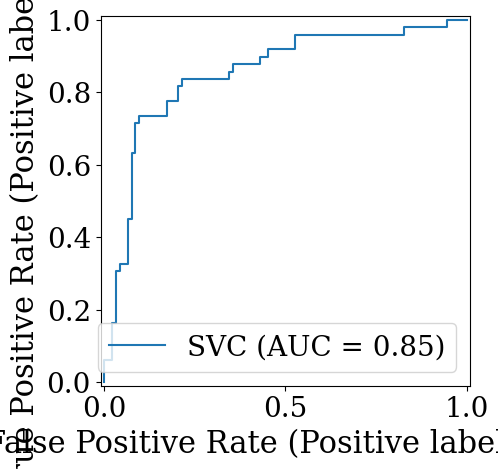

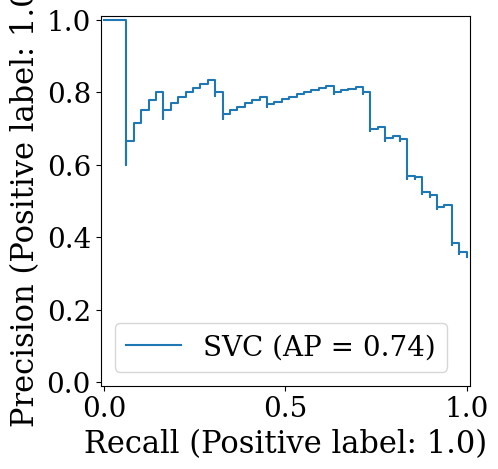

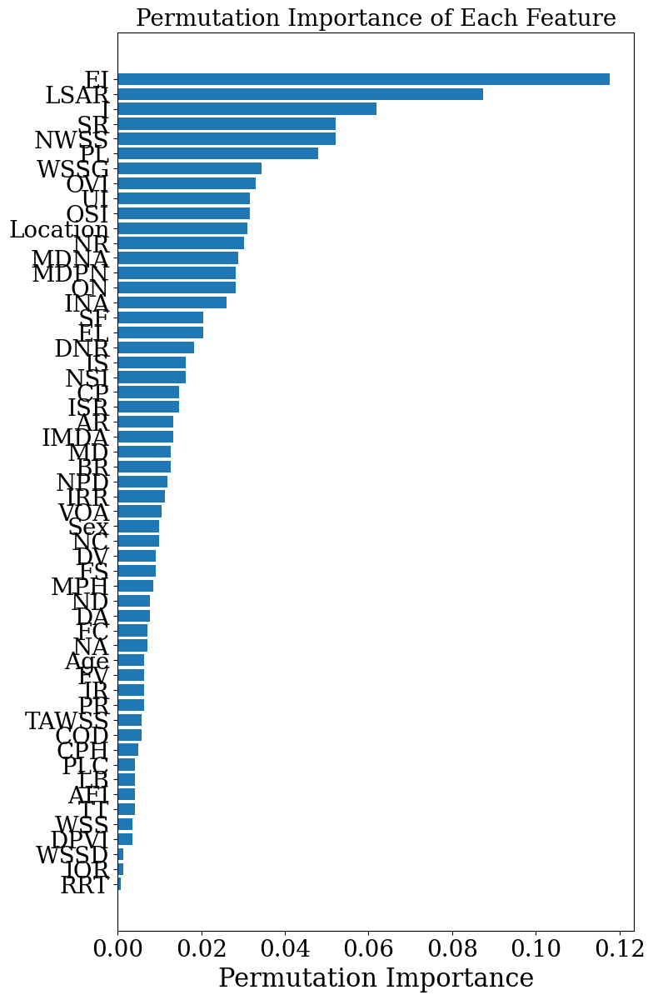

(55,)
['WSSD' 'PLC' 'IOR' 'RRT' 'IRR' 'IR' 'LB' 'NA' 'COD' 'Age' 'AFI' 'TT'
 'CPH' 'DA' 'WSS' 'ND' 'TAWSS' 'NC' 'DPVI' 'Sex' 'VOA' 'FV' 'NPD' 'FS'
 'AR' 'PR' 'FC' 'ISR' 'MPH' 'CP' 'DV' 'IMDA' 'IS' 'DNR' 'BR' 'EL' 'NSI'
 'MD' 'INA' 'SF' 'MDNA' 'MDPN' 'ON' 'NR' 'UI' 'WSSG' 'Location' 'OVI'
 'OSI' 'PL' 'NWSS' 'SR' 'I' 'LSAR' 'EI']
[0.00140845 0.00140845 0.00140845 0.00211268 0.0028169  0.00492958
 0.00492958 0.0056338  0.0056338  0.0056338  0.00633803 0.00633803
 0.00633803 0.00704225 0.00704225 0.0084507  0.0084507  0.0084507
 0.00915493 0.00915493 0.00915493 0.00915493 0.00985915 0.00985915
 0.00985915 0.00985915 0.00985915 0.01056338 0.01056338 0.01126761
 0.01126761 0.01267606 0.01478873 0.01549296 0.01549296 0.01619718
 0.01619718 0.01760563 0.02112676 0.02112676 0.02253521 0.02323944
 0.02464789 0.02746479 0.03098592 0.03380282 0.03450704 0.03873239
 0.04295775 0.04788732 0.05140845 0.06338028 0.06549296 0.09929577
 0.12323944]


In [ ]:
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import RocCurveDisplay
from sklearn import svm

model = svm.SVC(C=80, gamma=0.002, probability=True, class_weight=None , kernel='rbf')
# model = svm.NuSVC(nu=0.5, gamma=0.002, probability=True, class_weight=None, kernel='rbf')
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)

ROC = RocCurveDisplay.from_estimator(model, x_test, y_test)
PrecisionRecallDisplay.from_estimator(model, x_test, y_test)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

result = permutation_importance(model, x_test, y_test, n_repeats=10, random_state=None)
sorted_idx = result.importances_mean.argsort()
v = result.importances_mean[sorted_idx]
n = df.columns.values[sorted_idx]
print(n.shape)
print(n)
print(v)

## Stochastic Gradient Descent

In [ ]:
from sklearn.model_selection import GridSearchCV

test = SGDClassifier()
parameter_space = {
    'loss': ['log_loss'],
    'penalty': ['l1','l2'],
    'learning_rate': ['adaptive'],
    'eta0': [0.01,0.009,0.011],
    'alpha': [0.0002,0.002],
    'class_weight': [None]
}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

Best parameters found:
 {'alpha': 0.002, 'class_weight': None, 'eta0': 0.011, 'learning_rate': 'adaptive', 'loss': 'log_loss', 'penalty': 'l1'}


Training Time: 0:00:00.026330
Train Data Accuracy: 
  0.7703180212014135
Train Data Confusion Matrix: 
  [[280  82]
 [ 48 156]]
Test Data Accuracy: 
  0.8098591549295775
Test Data Confusion Matrix: 
 [[78 15]
 [12 37]]
-------------------------------------------------------
Training Time: 0:00:00.026330
Train Data Accuracy: 
  0.7685512367491166
Train Data Confusion Matrix: 
  [[282  80]
 [ 51 153]]
Test Data Accuracy: 
  0.8028169014084507
Test Data Confusion Matrix: 
 [[77 16]
 [12 37]]
-------------------------------------------------------------------------------------


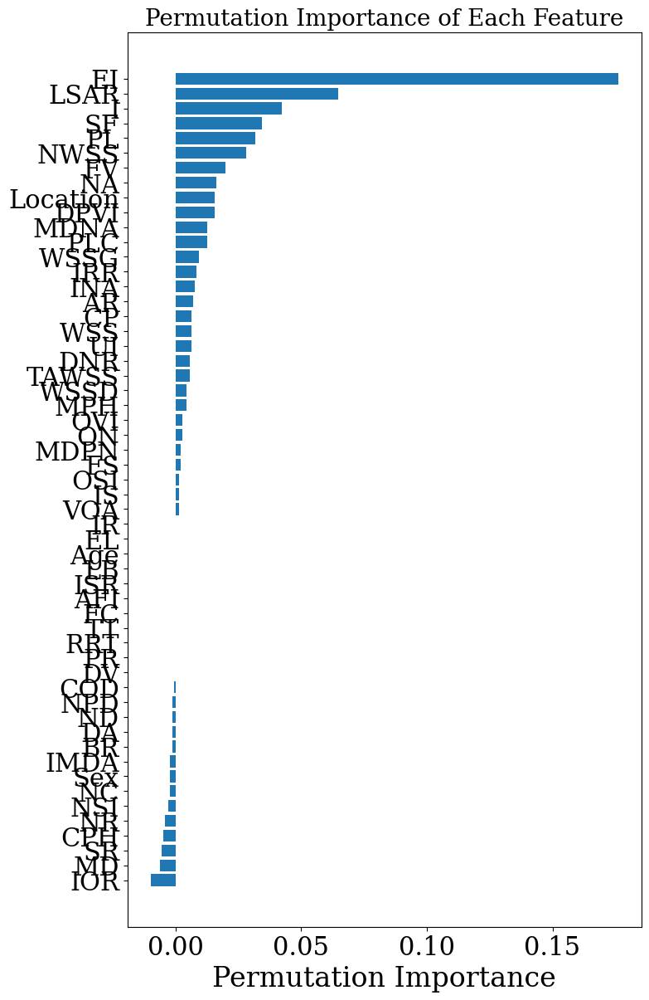

['IMDA' 'IOR' 'ISR' 'UI' 'NR' 'CPH' 'MD' 'BR' 'COD' 'IRR' 'NC' 'WSSD'
 'NPD' 'ND' 'OSI' 'Age' 'RRT' 'AFI' 'IR' 'DV' 'EL' 'LB' 'TT' 'FS' 'PR'
 'FC' 'ON' 'NSI' 'Sex' 'SR' 'WSS' 'DA' 'VOA' 'TAWSS' 'IS' 'WSSG' 'MDNA'
 'MPH' 'OVI' 'CP' 'MDPN' 'DNR' 'AR' 'PLC' 'DPVI' 'Location' 'INA' 'NA'
 'FV' 'PL' 'NWSS' 'SF' 'I' 'LSAR' 'EI']
[-0.01197183 -0.00985915 -0.00633803 -0.00352113 -0.00352113 -0.0028169
 -0.0028169  -0.00211268 -0.00211268 -0.00211268 -0.00211268 -0.00140845
 -0.00140845 -0.00070423 -0.00070423  0.          0.          0.
  0.          0.          0.          0.          0.          0.00070423
  0.00070423  0.00070423  0.00070423  0.00140845  0.00140845  0.0028169
  0.0028169   0.0028169   0.00352113  0.00422535  0.00492958  0.00633803
  0.00633803  0.00704225  0.00704225  0.00704225  0.00774648  0.00985915
  0.01126761  0.01267606  0.01338028  0.01478873  0.01830986  0.02323944
  0.02323944  0.02464789  0.04507042  0.04929577  0.05211268  0.07042254
  0.18591549]


In [ ]:
from sklearn.linear_model import SGDClassifier

model = SGDClassifier(loss="log_loss", penalty="l1", max_iter=10000, tol=7e-5, alpha=0.0002, eta0=0.01, learning_rate='adaptive', class_weight={0: 1, 1: 1.8})
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
# RocCurveDisplay.from_estimator(model, x_test, y_test)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

result = permutation_importance(model, x_test, y_test, n_repeats=10, random_state=None)
sorted_idx = result.importances_mean.argsort()
v = result.importances_mean[sorted_idx]
n = df.columns.values[sorted_idx]
print(n)
print(v)

##KNeighbor

In [ ]:
from sklearn.model_selection import GridSearchCV

test = KNeighborsClassifier()
parameter_space = {
    'n_neighbors': [11,13,15,17,19],
    'weights': ['uniform','distance'],
    'p': [1],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

Best parameters found:
 {'algorithm': 'auto', 'n_neighbors': 17, 'p': 1, 'weights': 'uniform'}


Training Time: 0:00:00.002003
Train Data Accuracy: 
  0.7455830388692579
Train Data Confusion Matrix: 
  [[332  30]
 [114  90]]
Test Data Accuracy: 
  0.7816901408450704
Test Data Confusion Matrix: 
 [[85  8]
 [23 26]]
-------------------------------------------------------
Training Time: 0:00:00.002003
Train Data Accuracy: 
  0.7455830388692579
Train Data Confusion Matrix: 
  [[332  30]
 [114  90]]
Test Data Accuracy: 
  0.7816901408450704
Test Data Confusion Matrix: 
 [[85  8]
 [23 26]]
-------------------------------------------------------------------------------------


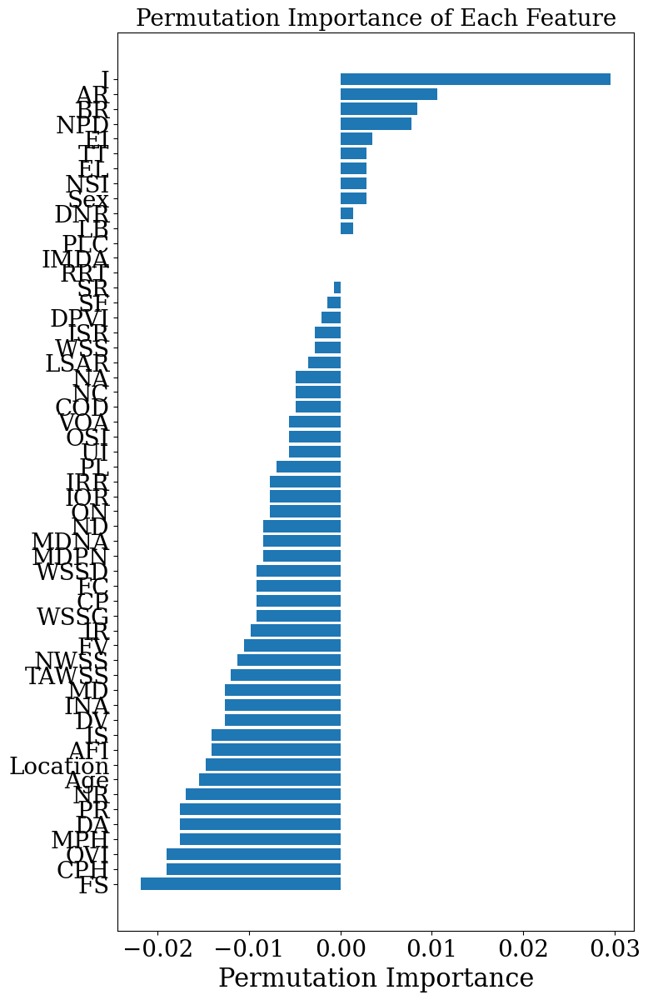

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=17, weights='uniform', p=1, algorithm='auto')
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

## Gaussian Process

In [ ]:
from sklearn.model_selection import GridSearchCV

test = GaussianProcessClassifier()
parameter_space = {
    'kernel': [RBF(2),RBF(5)],
    'optimizer': ['fmin_l_bfgs_b'],
    'n_restarts_optimizer': [0]
}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

Best parameters found:
 {'kernel': RBF(length_scale=2), 'n_restarts_optimizer': 0, 'optimizer': 'fmin_l_bfgs_b'}


Training Time: 0:00:02.928887
Train Data Accuracy: 
  0.842756183745583
Train Data Confusion Matrix: 
  [[331  31]
 [ 58 146]]
Test Data Accuracy: 
  0.8169014084507042
Test Data Confusion Matrix: 
 [[84  9]
 [17 32]]
-------------------------------------------------------
Training Time: 0:00:02.928887
Train Data Accuracy: 
  0.842756183745583
Train Data Confusion Matrix: 
  [[331  31]
 [ 58 146]]
Test Data Accuracy: 
  0.8169014084507042
Test Data Confusion Matrix: 
 [[84  9]
 [17 32]]
-------------------------------------------------------------------------------------


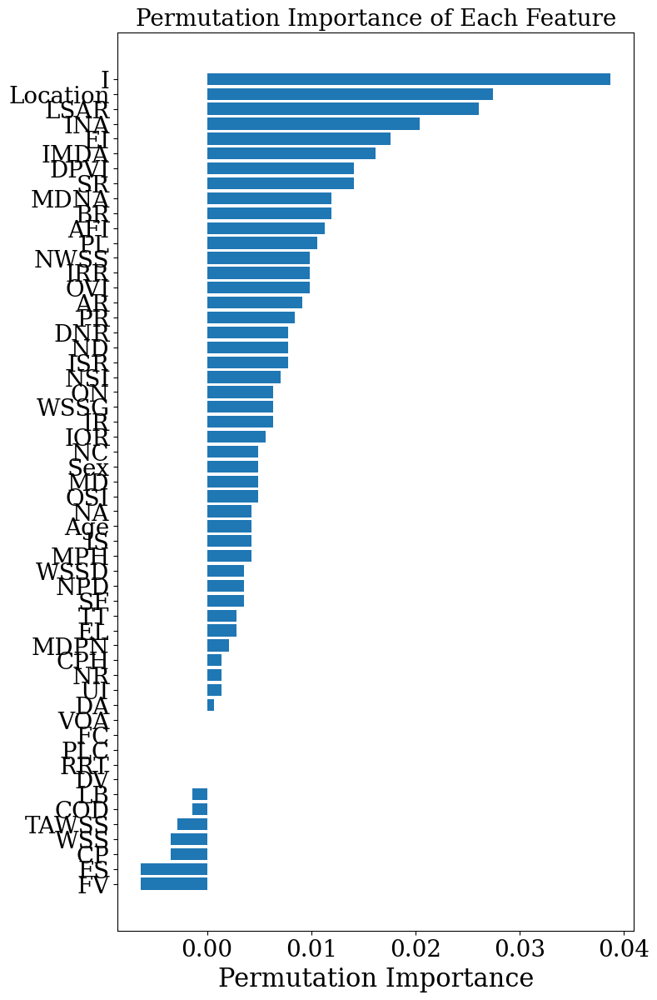

In [ ]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF

model = GaussianProcessClassifier(kernel=1*RBF(2), optimizer='fmin_l_bfgs_b', n_restarts_optimizer=0)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

## Gaussian Naive Bayes

In [ ]:
from sklearn.model_selection import GridSearchCV

test = GaussianNB()
parameter_space = {
    'var_smoothing': [1e-9,1e-10,5e-11]
}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

Best parameters found:
 {'var_smoothing': 5e-11}


Training Time: 0:00:00.005288
Train Data Accuracy: 
  0.7102473498233216
Train Data Confusion Matrix: 
  [[272  90]
 [ 74 130]]
Test Data Accuracy: 
  0.7676056338028169
Test Data Confusion Matrix: 
 [[74 19]
 [14 35]]
-------------------------------------------------------
Training Time: 0:00:00.005288
Train Data Accuracy: 
  0.7102473498233216
Train Data Confusion Matrix: 
  [[272  90]
 [ 74 130]]
Test Data Accuracy: 
  0.7676056338028169
Test Data Confusion Matrix: 
 [[74 19]
 [14 35]]
-------------------------------------------------------------------------------------


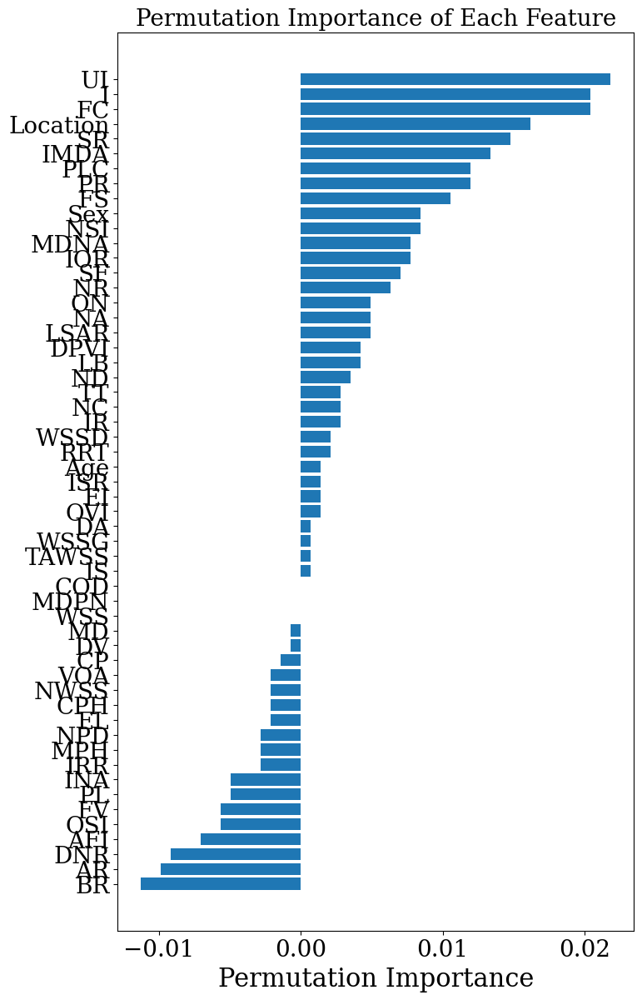

In [ ]:
from sklearn.naive_bayes import GaussianNB

model = GaussianNB(var_smoothing=1e-10)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

##Decision Tree

In [ ]:
from sklearn.model_selection import GridSearchCV

test = tree.DecisionTreeClassifier()
parameter_space = {
    'criterion': ['log_loss','entropy', 'gini'],
    'splitter': ['random', 'best'],
    'max_depth': [3,5,4],
    'max_features': [0.7,0.9,None],
    'min_samples_split': [10,12,15],
    'min_samples_leaf': [5]
}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

Best parameters found:
 {'criterion': 'gini', 'max_depth': 3, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 15, 'splitter': 'random'}


In [ ]:
from sklearn import tree

model = tree.DecisionTreeClassifier(criterion='gini', splitter='random', max_depth=4, max_features=None, min_samples_split=12, random_state=None)

start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
CrossVal = cross_validation(model, x_train, y_train)
ResultsShow.show(CrossVal, x_train, y_train, x_test, y_test)
# print('-------------------------------------------------------')
# ResultsShow.feature_exraction(model, x_train, df)
# print('-------------------------------------------------------')
# ResultsShow.confusion_matrix('Decision Tree', CrossVal, x_test, y_test)
# print('-------------------------------------------------------')
# ResultsShow.tree_depiction(model)
# print('-------------------------------------------------------------------------------------')

Training Time: 0:00:00.004584
Train Data Accuracy: 
  0.7579505300353356
Train Data Confusion Matrix: 
  [[308  54]
 [ 83 121]]
Test Data Accuracy: 
  0.795774647887324
Test Data Confusion Matrix: 
 [[83 10]
 [19 30]]
-------------------------------------------------------
Training Time: 0:00:00.004584
Train Data Accuracy: 
  0.803886925795053
Train Data Confusion Matrix: 
  [[313  49]
 [ 62 142]]
Test Data Accuracy: 
  0.7887323943661971
Test Data Confusion Matrix: 
 [[82 11]
 [19 30]]


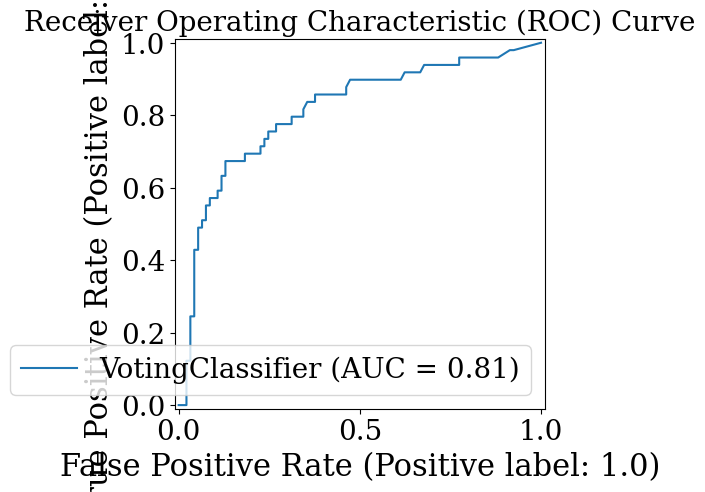

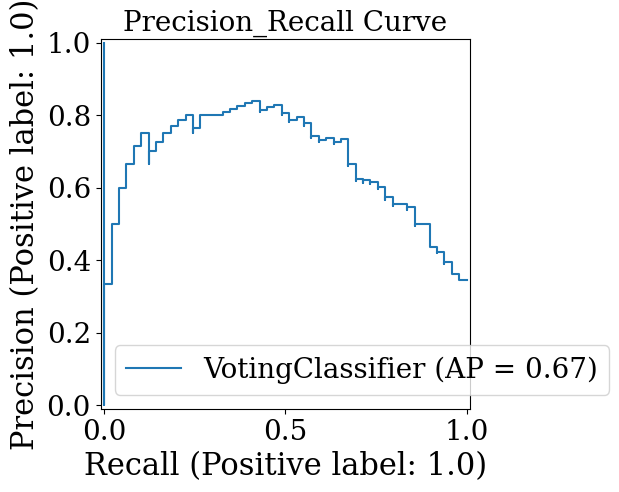

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import RocCurveDisplay
ROC = RocCurveDisplay.from_estimator(CrossVal, x_test, y_test)
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.savefig('ROC Curve.png', transparent=True, bbox_inches='tight')
PrecisionRecallDisplay.from_estimator(CrossVal, x_test, y_test)
plt.title('Precision_Recall Curve')
plt.savefig('Precision_Recall Curve.png', transparent=True, bbox_inches='tight')

## Ensemble Methods

###Bagging_SVC

In [ ]:
from sklearn.model_selection import GridSearchCV

test = BaggingClassifier(estimator = svm.SVC(C=80, gamma=0.002, probability=True, class_weight=None , kernel='rbf'))
parameter_space = {
    'n_estimators': [100],
    'max_samples': [0.9],
    'max_features': [0.9,1],
    'bootstrap': [True]
}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

Best parameters found:
 {'bootstrap': True, 'max_features': 0.9, 'max_samples': 0.9, 'n_estimators': 100}


In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

model = BaggingClassifier(estimator = svm.SVC(C=80, gamma=0.002, probability=True, class_weight=None , kernel='rbf'), n_estimators = 100, bootstrap=True, max_samples=0.9, max_features=54)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

Training Time: 0:00:04.410541
Train Data Accuracy: 
  0.8356890459363958
Train Data Confusion Matrix: 
  [[351  11]
 [ 82 122]]
Test Data Accuracy: 
  0.8028169014084507
Test Data Confusion Matrix: 
 [[86  7]
 [21 28]]
-------------------------------------------------------
Training Time: 0:00:04.410541
Train Data Accuracy: 
  0.8374558303886925
Train Data Confusion Matrix: 
  [[351  11]
 [ 81 123]]
Test Data Accuracy: 
  0.8098591549295775


KeyboardInterrupt: 

###Bagging_Kneighbor

In [ ]:
from sklearn.model_selection import GridSearchCV

test = BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto'))
parameter_space = {
    'n_estimators': [90,100],
    'max_samples': [0.9,0.7],
    'max_features': [0.7],
    'bootstrap': [True],
}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier

model = BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto'),  n_estimators = 100, bootstrap=True, max_samples=0.9, max_features=0.7)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

###Random Forest

In [ ]:
from sklearn.model_selection import GridSearchCV

test = RandomForestClassifier()
parameter_space = {
    'criterion': ['gini', 'log_loss'],
    'n_estimators': [60,70],
    'max_depth': [5,4],
    'max_features': [0.9,0.5],
    'min_samples_split': [20],
    'min_samples_leaf': [3],
    'bootstrap': [True]

}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=80, criterion='log_loss', max_depth=5, min_samples_leaf=5, max_features=0.5, min_samples_split=20, bootstrap=True)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
ResultsShow.feature_exraction(model, x_train, df)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

###Adaboost

In [ ]:
from sklearn.model_selection import GridSearchCV

test = AdaBoostClassifier()
parameter_space = {
    'n_estimators': [110,70,90],
    'learning_rate': [0.1,0.15,0.05]

}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

model = AdaBoostClassifier(n_estimators=110, learning_rate=0.15)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
ResultsShow.feature_exraction(model, x_train,df)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

###Gradient Tree Boosting

In [ ]:
from sklearn.model_selection import GridSearchCV

test = GradientBoostingClassifier()
parameter_space = {
    'n_estimators': [30,60,90],
    'learning_rate': [0.1,0.05,0.15],
    'max_depth': [3,4,2],
    'min_samples_split': [5,10]

}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

model = GradientBoostingClassifier(n_estimators=60, learning_rate=0.02, max_depth=4, min_samples_split=10)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show( model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
ResultsShow.feature_exraction(model, x_train,df)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

### Histogram-Based Gradient Boosting

In [ ]:
from sklearn.model_selection import GridSearchCV

test = HistGradientBoostingClassifier()
parameter_space = {
    'min_samples_leaf': [15,20,25],
    'learning_rate': [0.03,0.05]

}
search = GridSearchCV(test, parameter_space, n_jobs=-1, cv=3).fit(x, y)
print('Best parameters found:\n', search.best_params_)

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier

model = HistGradientBoostingClassifier(max_iter=150, learning_rate=0.03, loss='log_loss', max_leaf_nodes=10, min_samples_leaf=20)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

# Semi_Supervised Classification Models

## Semi-Supervised Self Training

In [ ]:
from sklearn.semi_supervised import SelfTrainingClassifier

b = HistGradientBoostingClassifier(max_iter=150, learning_rate=0.03, loss='log_loss', max_leaf_nodes=10, min_samples_leaf=20)
a = SGDClassifier(loss="log_loss", penalty="l1", max_iter=10000, tol=7e-5, alpha=0.0002, eta0=0.0005, learning_rate='adaptive', class_weight=None)
model = SelfTrainingClassifier(b, threshold=0.5)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')
# ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
# print('-------------------------------------------------------------------------------------')
# ResultsShow.feature_permutation(model, x_test, y_test)

## Semi-Supervised Label Spreading

In [ ]:
from sklearn.semi_supervised import LabelSpreading
import warnings

warnings.filterwarnings("ignore")

model = LabelSpreading(n_neighbors=5, gamma=2, alpha=0.1)
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
# print('-------------------------------------------------------')
# ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
# print('-------------------------------------------------------------------------------------')
# ResultsShow.feature_permutation(model, x_test, y_test)

#Neural Networks

##Multi Layer Perceptron


In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

mlp = MLPClassifier(max_iter=100)
parameter_space = {
    'hidden_layer_sizes': [(54,35,1), (54,35,17,1)],
    'activation': ['tanh'],
    'solver': ['sgd'],
    'alpha': [0.02],
    'learning_rate': ['adaptive'],
    'learning_rate_init':[0.001]
}
clf = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=3)
# clf = RandomizedSearchCV(mlp, parameter_space, n_jobs=-1, cv=3)
clf.fit(x, y)
print('Best parameters found:\n', clf.best_params_)
# means = clf.cv_results_['mean_test_score']
# stds = clf.cv_results_['std_test_score']
# for mean, std, params in zip(means, stds, clf.cv_results_['params']):
#     print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))


In [ ]:
from sklearn.neural_network import MLPClassifier

model = MLPClassifier(hidden_layer_sizes=(54,18,1), tol=1e-6, batch_size=28, max_iter=2500, activation='identity', solver='sgd', alpha=0.2, learning_rate_init=0.00005, learning_rate='adaptive')
start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
# print('-------------------------------------------------------')
# ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)
# print('-------------------------------------------------------------------------------------')
ResultsShow.feature_permutation(model, x_test, y_test)

result = permutation_importance(model, x_test, y_test, n_repeats=10, random_state=None)
sorted_idx = result.importances_mean.argsort()
v = result.importances_mean[sorted_idx]
n = df.columns.values[sorted_idx]
print(n)
print(v)

In [ ]:
from graphviz import Digraph

# Create a new Graphviz object
dot = Digraph(format='png')

# Set the rank direction to left to right
dot.attr(rankdir='LR')

# Set the background color to transparent
dot.attr(bgcolor='transparent')

# Add the first 3 and last 3 nodes to the input layer
dot.node('x1', 'x1', fillcolor='#6495ED', style='filled')
dot.node('x2', 'x2', fillcolor='#6495ED', style='filled')
dot.node('x3', 'x3', fillcolor='#6495ED', style='filled')
dot.node('x4', '...', fillcolor='#FFFFFF')
dot.node('x5', '...', fillcolor='#FFFFFF')
dot.node('x6', 'x54', fillcolor='#6495ED', style='filled')

# Add the first 3 and last 3 nodes to the hidden layer
dot.node('h1', 'h1', fillcolor='#6495ED', style='filled')
dot.node('h2', 'h2', fillcolor='#6495ED', style='filled')
dot.node('h3', 'h3', fillcolor='#6495ED', style='filled')
dot.node('h4', '...', fillcolor='#FFFFFF')
dot.node('h5', '...', fillcolor='#FFFFFF')
dot.node('h6', 'h18', fillcolor='#6495ED', style='filled')

# Add all nodes to the output layer
dot.node('y', 'y', fillcolor='#6495ED', style='filled')

# Add edges from input layer to hidden layer
for i in range(1, 4):
    for j in range(1, 4):
        dot.edge(f'x{i}', f'h{j}')

for i in range(4, 7):
    for j in range(4, 7):
        dot.edge(f'x{i}', f'h{j}')

# Add edges from hidden layer to output layer
for i in range(1, 7):
    dot.edge(f'h{i}', 'y')

# Render the graph to a PNG file
dot.render('mlp_network_subset', view=False)

## Keras

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.6210 - loss: 0.8363 - val_accuracy: 0.6912 - val_loss: 0.6072
Epoch 2/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6793 - loss: 0.5965 - val_accuracy: 0.7059 - val_loss: 0.5919
Epoch 3/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7114 - loss: 0.5827 - val_accuracy: 0.7206 - val_loss: 0.5629
Epoch 4/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7630 - loss: 0.4705 - val_accuracy: 0.7500 - val_loss: 0.5732
Epoch 5/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.7535 - loss: 0.4893 - val_accuracy: 0.7500 - val_loss: 0.5474
Epoch 6/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8105 - loss: 0.4373 - val_accuracy: 0.7941 - val_loss: 0.5365
Epoch 7/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7420 - loss: 0.5052 - val_accuracy: 0.7353 - val_loss: 0.5663
Epoch 8/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7970 - loss: 0.4664 - val_accuracy: 0.8088 

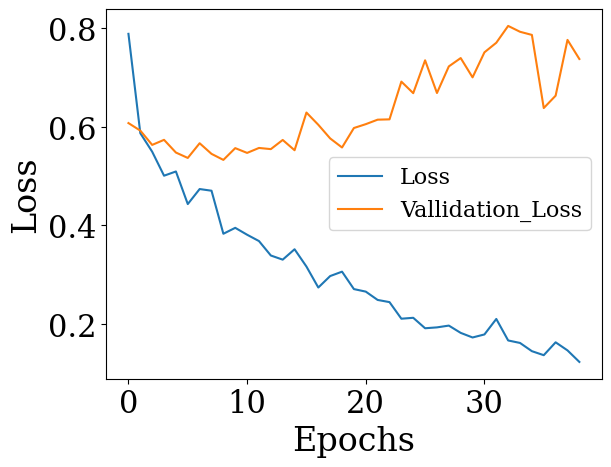

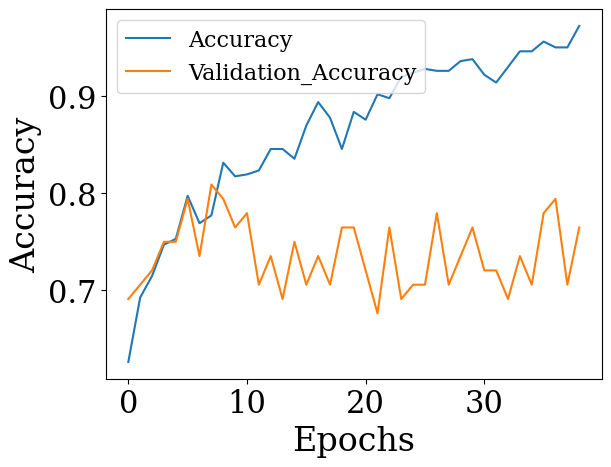

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7486 - loss: 0.5890
0.6822907328605652
0.7394366264343262


In [ ]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization
from keras.utils import plot_model
from keras.callbacks import EarlyStopping
from keras import regularizers
from keras import optimizers


model = Sequential()
model.add(Conv1D(32, 3, activation='relu', input_shape=(54, 1)))
model.add(MaxPooling1D(2))
model.add(Conv1D(64, 3, activation='relu'))
model.add(MaxPooling1D(2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
# model.add(Dense(32, activation='relu'))
# model.add(BatchNormalization())
# model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

X_train, X_val, Y_train, Y_val = train_test_split(x_train, y_train, test_size=0.12, random_state=8)

early_stopping = EarlyStopping(monitor='val_loss', patience=30)
model.compile(optimizer=optimizers.Adamax(learning_rate=0.003), loss='binary_crossentropy', metrics=['accuracy'])
# model.compile(optimizer=optimizers.SGD(learning_rate=0.005), loss='binary_crossentropy', metrics=['accuracy']) # too slow
# model.compile(optimizer=optimizers.Nadam(learning_rate=0.005), loss='mae', metrics=['accuracy']) # Fast
hist = model.fit(X_train, Y_train, validation_data=(X_val,Y_val), epochs=200, callbacks=[early_stopping], batch_size=16)
# YPredict = np.argmax(model.predict(x_test),axis=1)


# accuracy = np.sum(YPredict == y_test)/len(y_test)
# print('--------------------------------')
# print('Accuracy = {}'.format(accuracy)) # cannot be used with sigmoid
# print('--------------------------------')

history = hist.history
loss = history['loss']
val_loss = history['val_loss']
acc = history['accuracy']
val_acc = history['val_accuracy']
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.plot(loss)
plt.plot(val_loss)
plt.legend(['Loss','Vallidation_Loss'])
plt.savefig('Loss.png', transparent=True, bbox_inches='tight')
plt.figure()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.plot(acc)
plt.plot(val_acc)
plt.legend(['Accuracy','Validation_Accuracy'])
plt.savefig('Accuracy.png', transparent=True, bbox_inches='tight')
plt.show()

# import tensorflow as tf
# confusion = tf.math.confusion_matrix(
#               labels = np.argmax(y_test),
#               predictions = np.argmax(YPredict),
#               num_classes=2)
# print(confusion)

test_loss, test_accuracy = model.evaluate(x_test,y_test)
print(test_loss)
print(test_accuracy)

In [ ]:
model.predict(standardization.transform(x[382].reshape(1,-1))) * 100
# model.predict(x_test[9].reshape(1,-1))
# x[382]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


array([[14.064995]], dtype=float32)

In [ ]:
# Create a new Graphviz object
dot = Digraph(format='png')

# Set the rank direction to left to right
dot.attr(rankdir='LR')

# Set the background color to white
dot.attr(bgcolor='white')

# Set the font color and size of the node labels
dot.attr('node', fontcolor='#333333', fontsize='12')

# Add nodes for each layer
for i, layer in enumerate(model.layers):
    name = layer.name
    label = f'{name}\n{layer.output_shape}'
    dot.node(name, label)

    if i > 0:
        prev_layer = model.layers[i-1]
        for node in prev_layer.output_shape[1:]:
            dot.edge(f'{prev_layer.name}-{node}', f'{name}-0')

# Render the graph to a PNG file
dot.render('sequential_model', view=False)

# Unsupervised Classification Models

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift
from sklearn.cluster import OPTICS
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.cluster import Birch
import warnings


class UnsupervisedModels:


  def nearest_neighbors():
    model = NearestNeighbors(n_neighbors=9, radius=0.1, algorithm='auto')
    return model


  def k_means():
    model = KMeans(n_clusters=2)
    return model


  def agglomerative_clustering():
    model = AgglomerativeClustering(n_clusters=2)
    return model


  def birch():
    model = Birch(threshold=100000, n_clusters=2)
    return model


  def mean_shift():
    model = MeanShift()
    return model


  def affinity_propagation():
    model = AffinityPropagation(damping=0.9999)
    return model


  def optics():
    model = OPTICS(eps=1, min_samples=50)
    return model


  def spectral_clustering():
    model = SpectralClustering(n_clusters=2)
    return model


  def gaussian_mixture():
    model = GaussianMixture(n_components=2)
    return model


  def dbscan():
    model = DBSCAN(eps=500000, min_samples=3)
    return model

## Unsupervised Nearest Neighbors

In [ ]:
from sklearn.neighbors import NearestNeighbors

model = NearestNeighbors(n_neighbors=9, radius=0.1, algorithm='auto')
start = datetime.datetime.now()
model.fit(x_train)
end = datetime.datetime.now()

distances1, indices1 = model.kneighbors(x_train)
y_pred1 = []
for i in range(len(y_train)):
  y_pred1.append(y_train[indices1[i,1]])

print(accuracy_score(y_train, y_pred1))

## Unsupervised K Means

In [ ]:
from sklearn.cluster import KMeans

model = KMeans(n_clusters=2)
model.fit(x_train)
y_pred = model.labels_

print(accuracy_score(y_train, y_pred))

## Unsupervised Hierarchical Clustering

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

Z = linkage(x_train, 'ward') # other possible options: single, complete, average, ward
dendrogram(Z)
model = AgglomerativeClustering(n_clusters=2)
model.fit(x_train)
y_pred = model.labels_
print(accuracy_score(y_train, y_pred))


## Unsupervised Mean Shift

In [ ]:
from sklearn.cluster import MeanShift

model = MeanShift()
model.fit(x_train)
y_pred = model.fit_predict(x_train)
print(accuracy_score(y_train, y_pred))


## Unsupervised Affinity Propagation

In [ ]:
from sklearn.cluster import AffinityPropagation

model = AffinityPropagation(damping=0.99999)
model.fit(x_train)
y_pred = model.predict(x_train)
print(accuracy_score(y_train, y_pred))

## Unsupervised Birch

In [ ]:
from sklearn.cluster import Birch

model = Birch(threshold=100000, n_clusters=2)
model.fit(x_train)
y_pred = model.predict(x_train)
print(accuracy_score(y_train, y_pred))

## Unsupevised Optics

In [ ]:
from sklearn.cluster import OPTICS

model = OPTICS(eps=1, min_samples=50)
model.fit(x_train)
y_pred = model.fit_predict(x_train)
print(accuracy_score(y_train, y_pred))

## Unsupervised Spectral

In [ ]:
from sklearn.cluster import SpectralClustering
c

model = SpectralClustering(n_clusters=2)
model.fit(x_train)
y_pred = model.fit_predict(x_train)
print(accuracy_score(y_train, y_pred))

## Unsupervised Gaussian Mixture

In [ ]:
from sklearn.mixture import GaussianMixture

model = GaussianMixture(n_components=2)
model.fit(x_train)
y_pred = model.predict(x_train)
print(accuracy_score(y_train, y_pred))

## Unsupervised DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN

model = DBSCAN(eps=500000, min_samples=3)
model.fit(x)
y_pred = model.labels_
print(accuracy_score(y, y_pred))

# Models Comparison

## Unsupervised Models Comparison

In [ ]:
warnings.filterwarnings("ignore")
models = dict()
distances1, indices1 = UnsupervisedModels.nearest_neighbors().fit(x).kneighbors(x)
y_pred = []
for i in range(len(y)):
  y_pred.append(y[indices1[i,1]])
models['Agglomerative Clustering'] = accuracy_score(y, UnsupervisedModels.agglomerative_clustering().fit(x).labels_)
models['Affinity Propagation'] = accuracy_score(y, UnsupervisedModels.affinity_propagation().fit(x).predict(x))
models['Spectral Clustering'] = accuracy_score(y, UnsupervisedModels.spectral_clustering().fit(x).fit_predict(x))
models['Nearest Neighbors'] = accuracy_score(y, y_pred)
models['Gaussian Mixture'] = accuracy_score(y, UnsupervisedModels.gaussian_mixture().fit(x).predict(x))
models['Mean Shift'] = accuracy_score(y, UnsupervisedModels.mean_shift().fit(x).fit_predict(x))
models['KMeans'] = accuracy_score(y, UnsupervisedModels.k_means().fit(x).labels_)
models['OPTICS'] = accuracy_score(y, UnsupervisedModels.optics().fit(x).fit_predict(x))
models['DBSCAN'] = accuracy_score(y, UnsupervisedModels.dbscan().fit(x).labels_)
models['Birch'] = accuracy_score(y, UnsupervisedModels.birch().fit(x).predict(x))
# ResultsShow.models_comparison_unsupervised(models)
ResultsShow.models_comparison_unsupervised(models)

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# -----------------------------
# Best-mapped clustering accuracy
# -----------------------------
def best_map_accuracy(y_true, y_cluster):
    y_true = np.asarray(y_true)
    y_cluster = np.asarray(y_cluster)

    true_labels = np.unique(y_true)
    cluster_labels = np.unique(y_cluster)

    # Build confusion matrix manually (handles arbitrary labels)
    C = np.zeros((len(true_labels), len(cluster_labels)), dtype=int)
    true_to_i = {lab:i for i, lab in enumerate(true_labels)}
    clus_to_j = {lab:j for j, lab in enumerate(cluster_labels)}

    for t, c in zip(y_true, y_cluster):
        C[true_to_i[t], clus_to_j[c]] += 1

    try:
        from scipy.optimize import linear_sum_assignment
        row_ind, col_ind = linear_sum_assignment(-C)
        matched = C[row_ind, col_ind].sum()
        return matched / len(y_true)
    except Exception:
        # binary fallback
        if len(true_labels) == 2 and len(cluster_labels) == 2:
            acc1 = np.mean(y_true == y_cluster)
            flipped = 1 - y_cluster
            acc2 = np.mean(y_true == flipped)
            return max(acc1, acc2)
        return np.mean(y_true == y_cluster)


# -----------------------------
# Run all unsupervised models
# -----------------------------
def run_unsupervised_models(x, y):

    models = {}
    algorithms = {
        "Agglomerative": UnsupervisedModels.agglomerative_clustering(),
        "Affinity Propagation": UnsupervisedModels.affinity_propagation(),
        "Spectral": UnsupervisedModels.spectral_clustering(),
        "Gaussian Mixture": UnsupervisedModels.gaussian_mixture(),
        "Mean Shift": UnsupervisedModels.mean_shift(),
        "KMeans": UnsupervisedModels.k_means(),
        "OPTICS": UnsupervisedModels.optics(),
        "DBSCAN": UnsupervisedModels.dbscan(),
        "Birch": UnsupervisedModels.birch()
    }

    for name, model in algorithms.items():

        try:
            # Fit model
            fitted = model.fit(x)

            # Extract labels properly
            if hasattr(fitted, "labels_"):
                labels = fitted.labels_
            elif hasattr(fitted, "predict"):
                labels = fitted.predict(x)
            elif hasattr(fitted, "fit_predict"):
                labels = fitted.fit_predict(x)
            else:
                continue

            acc = best_map_accuracy(y, labels)
            models[name] = acc

        except Exception as e:
            print(f"{name} failed:", e)

    return models


# -----------------------------
# Pretty plot
# -----------------------------
def plot_unsupervised_results(models):

    names = list(models.keys())
    scores = np.array(list(models.values()))

    order = np.argsort(-scores)
    names = [names[i] for i in order]
    scores = scores[order]

    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
        "font.size": 18
    })

    fig, ax = plt.subplots(figsize=(9, 6), dpi=300)

    y_pos = np.arange(len(names))
    bars = ax.barh(y_pos, scores, color="#4A4A4A", alpha=0.9)

    ax.set_yticks(y_pos)
    ax.set_yticklabels(names)
    ax.invert_yaxis()
    ax.set_xlabel("Best-mapped Accuracy")
    ax.set_xlim(0, 1)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # annotate values
    for i, v in enumerate(scores):
        ax.text(v + 0.01, i, f"{v:.3f}",
                va="center", fontsize=16)

    plt.tight_layout()
    plt.savefig("Unsupervised_Comparison_Pretty.png", dpi=300, bbox_inches="tight")
    plt.savefig("Unsupervised_Comparison_Pretty.pdf", bbox_inches="tight")
    plt.show()


# -----------------------------
# RUN
# -----------------------------
models = run_unsupervised_models(x, y)
plot_unsupervised_results(models)

## Supervised Models Comparison

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import RocCurveDisplay

models = dict()
models['Stochastic Gradient Descent'] = cross_validation(SupervisedModels.stochastic_gradient_descent(), x_train, y_train)
models['Support Vector Machine'] = cross_validation(SupervisedModels.support_vector_machine(), x_train, y_train)
models['Multi Layer Perceptron'] = cross_validation(SupervisedModels.multi_layer_perceptron(), x_train, y_train)
models['Histogradient Boosting'] = cross_validation(SupervisedModels.histogram_gradient_boosting(), x_train, y_train)
models['Gradient Tree Boosting'] = cross_validation(SupervisedModels.gradient_boosting(), x_train, y_train)
models['Gaussian Naive Bayes'] = cross_validation(SupervisedModels.gussian_naive_bayes(), x_train, y_train)
models['Bagging Kneighbor'] = cross_validation(SupervisedModels.bagging_kneighbor(), x_train, y_train)
models['Gaussian Process'] = cross_validation(SupervisedModels.gussian_process(), x_train, y_train)
models['Label Spreading'] = cross_validation(SupervisedModels.label_spreading(), x_train, y_train)
models['Random Forest'] = cross_validation(SupervisedModels.random_forest(), x_train, y_train)
models['Decision Tree'] = cross_validation(SupervisedModels.decision_tree(), x_train, y_train)
models['Bagging SVC'] = cross_validation(SupervisedModels.bagging_svc(), x_train, y_train)
models['Self Training'] = cross_validation(SupervisedModels.selftraining(), x_train, y_train)
models['Kneighbor'] = cross_validation(SupervisedModels.kneighbor(), x_train, y_train)
models['Adaboost'] = cross_validation(SupervisedModels.adaboost(), x_train, y_train)
models['XGBoost'] = cross_validation(SupervisedModels.xgboost(), x_train, y_train)

precision, recall, report, results, names = list(), list(), list(), list(), list(models.keys())
for name, model in models.items():
	report.append(classification_report(y_test, model.predict(x_test), target_names=['Unruptured','Ruptured'], output_dict=True ))
	scores = accuracy_score(y_train, model.predict(x_train)), accuracy_score(y_test, model.predict(x_test))
	results.append(scores)
	print('>%s %.3f (%.3f)' % (name, scores[0], scores[1]))
for i in range(len(names)):
	precision.append(report[i]['Unruptured']['precision'])
	recall.append(report[i]['Unruptured']['recall'])

# ResultsShow.models_comparison_supervised(names, results)
ResultsShow.models_comparison_supervised_pretty(names, results)
print('-----------------------------------------------------------------------------------')
# ResultsShow.models_comparison_supervised_recall_precision(names, results, precision, recall)
ResultsShow.models_comparison_supervised_recall_precision_pretty(names, results)
print('-----------------------------------------------------------------------------------')

fig, ax = plt.subplots(figsize=(10,10))
# plt.title('Receiver Operating Characteristic (ROC) Curve for Different Models')
for name, model in models.items():
	if name == 'Label Spreading':
		continue
	RocCurveDisplay.from_estimator(models[name], x_test, y_test, ax=ax, name=name)
plt.savefig('ROC.pdf', transparent=True, bbox_inches='tight')

fig, ax = plt.subplots(figsize=(10,10))
plt.title('Precision-Recall Curve for Different Models')
for name, model in models.items():
	if name == 'Label Spreading':
		continue
	PrecisionRecallDisplay.from_estimator(models[name], x_test, y_test, ax=ax, name=name)
plt.savefig('Precision_Recall Curve.png', transparent=True, bbox_inches='tight')

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_curve, roc_auc_score, precision_recall_curve,
    confusion_matrix, ConfusionMatrixDisplay
)
from sklearn.calibration import calibration_curve
from sklearn.model_selection import cross_val_score

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 16
})

# ======================================================
# MAIN FUNCTION
# ======================================================
def evaluate_supervised_models(models, X_train, y_train, X_test, y_test, cv=5):

    results = []

    for name, model in models.items():

        model.fit(X_train, y_train)

        # Predictions
        y_pred_train = model.predict(X_train)
        y_pred_test  = model.predict(X_test)

        # Probabilities (if available)
        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test)[:, 1]
        elif hasattr(model, "decision_function"):
            y_prob = model.decision_function(X_test)
        else:
            y_prob = None

        # Metrics
        acc_train = accuracy_score(y_train, y_pred_train)
        acc_test  = accuracy_score(y_test, y_pred_test)
        precision = precision_score(y_test, y_pred_test)
        recall    = recall_score(y_test, y_pred_test)
        f1        = f1_score(y_test, y_pred_test)

        # Specificity
        cm = confusion_matrix(y_test, y_pred_test)
        tn, fp, fn, tp = cm.ravel()
        specificity = tn / (tn + fp)

        # AUC
        auc = roc_auc_score(y_test, y_prob) if y_prob is not None else np.nan

        # Cross-validated AUC
        cv_auc = cross_val_score(model, X_train, y_train,
                                 cv=cv, scoring="roc_auc")
        cv_mean = cv_auc.mean()
        cv_std  = cv_auc.std()

        results.append([
            name, acc_train, acc_test,
            precision, recall, f1,
            specificity, auc, cv_mean, cv_std
        ])

    results_df = pd.DataFrame(results, columns=[
        "Model", "Train Accuracy", "Test Accuracy",
        "Precision", "Recall", "F1",
        "Specificity", "AUC",
        "CV AUC Mean", "CV AUC Std"
    ])

    results_df = results_df.sort_values("AUC", ascending=False)
    print("\n===== SUMMARY METRICS =====\n")
    print(results_df.round(3))

    # ======================================================
    # 1️⃣ Train vs Test Accuracy
    # ======================================================
    fig, ax = plt.subplots(figsize=(10,5))
    x = np.arange(len(results_df))
    w = 0.35

    ax.bar(x-w/2, results_df["Train Accuracy"], w, label="Train")
    ax.bar(x+w/2, results_df["Test Accuracy"], w, label="Test")

    ax.set_xticks(x)
    ax.set_xticklabels(results_df["Model"], rotation=30)
    ax.set_ylabel("Accuracy")
    ax.legend()
    plt.tight_layout()
    plt.show()

    # ======================================================
    # 2️⃣ Test Metrics Comparison
    # ======================================================
    fig, ax = plt.subplots(figsize=(11,6))
    metrics = ["Test Accuracy","Precision","Recall","F1","Specificity"]
    x = np.arange(len(results_df))
    w = 0.15

    for i, m in enumerate(metrics):
        ax.bar(x + i*w - w*2, results_df[m], w, label=m)

    ax.set_xticks(x)
    ax.set_xticklabels(results_df["Model"], rotation=30)
    ax.set_ylim(0,1)
    ax.set_ylabel("Score")
    ax.legend()
    plt.tight_layout()
    plt.show()

    # ======================================================
    # 3️⃣ ROC Curves
    # ======================================================
    plt.figure(figsize=(7,6))
    for name, model in models.items():
        model.fit(X_train, y_train)

        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test)[:,1]
        elif hasattr(model, "decision_function"):
            y_prob = model.decision_function(X_test)
        else:
            continue

        fpr, tpr, _ = roc_curve(y_test, y_prob)
        auc = roc_auc_score(y_test, y_prob)
        plt.plot(fpr, tpr, label=f"{name} (AUC={auc:.2f})")

    plt.plot([0,1],[0,1],'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ======================================================
    # 4️⃣ Precision-Recall Curves
    # ======================================================
    plt.figure(figsize=(7,6))
    for name, model in models.items():
        model.fit(X_train, y_train)

        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test)[:,1]
        elif hasattr(model, "decision_function"):
            y_prob = model.decision_function(X_test)
        else:
            continue

        precision, recall, _ = precision_recall_curve(y_test, y_prob)
        plt.plot(recall, precision, label=name)

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ======================================================
    # 5️⃣ Confusion Matrix (Best AUC Model)
    # ======================================================
    best_model_name = results_df.iloc[0]["Model"]
    best_model = models[best_model_name]
    best_model.fit(X_train, y_train)

    y_pred = best_model.predict(X_test)

    fig, ax = plt.subplots(figsize=(5,5))
    ConfusionMatrixDisplay.from_predictions(
        y_test, y_pred,
        display_labels=["Unruptured","Ruptured"],
        cmap="Greys", ax=ax
    )
    plt.title(f"Confusion Matrix ({best_model_name})")
    plt.tight_layout()
    plt.show()

    # ======================================================
    # 6️⃣ Calibration Curve (Best Model)
    # ======================================================
    if hasattr(best_model, "predict_proba"):
        y_prob = best_model.predict_proba(X_test)[:,1]
        prob_true, prob_pred = calibration_curve(y_test, y_prob, n_bins=10)

        plt.figure(figsize=(6,6))
        plt.plot(prob_pred, prob_true, marker='o')
        plt.plot([0,1],[0,1],'k--')
        plt.xlabel("Mean Predicted Probability")
        plt.ylabel("Fraction of Positives")
        plt.title("Calibration Curve")
        plt.tight_layout()
        plt.show()

    return results_df

In [ ]:
results = evaluate_supervised_models(models, x_train, y_train, x_test, y_test)

# Combining Different Models

In [ ]:
from sklearn.ensemble import VotingClassifier

# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=None)
# standardization = StandardScaler().fit(x_train)
# x_train = standardization.transform(x_train)
# x_test = standardization.transform(x_test)

names_list = []
for i in range (2):
  names_list.append(str(i+1))
models_list = [
              cross_validation(SupervisedModels.stochastic_gradient_descent(), x_train, y_train),
              cross_validation(SupervisedModels.support_vector_machine(), x_train, y_train),
              cross_validation(SupervisedModels.multi_layer_perceptron(), x_train, y_train)
               ]
models_list = list(zip(names_list, models_list))
model = VotingClassifier(models_list, voting='soft')

start = datetime.datetime.now()
model.fit(x_train, y_train)
end = datetime.datetime.now()

ResultsShow.show(model, x_train, y_train, x_test, y_test)
print('-------------------------------------------------------')

# Cross Validation Approach
# ResultsShow.show(cross_validation(model, x_train, y_train), x_train, y_train, x_test, y_test)

#Grid Search

In [ ]:
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.ensemble import HistGradientBoostingClassifier

# ----------------------------
# CONFIG
# ----------------------------
RANDOM_STATE = 42
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
inner_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=RANDOM_STATE)

X = x  # your features
y = y  # labels (0/1)

# ----------------------------
# 1) SGD (fast) - GridSearch
# ----------------------------
sgd_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SGDClassifier(loss="log_loss", max_iter=20000, tol=1e-4, random_state=RANDOM_STATE))
])

sgd_grid = {
    "clf__penalty": ["l2", "l1", "elasticnet"],
    "clf__alpha": [1e-5, 5e-5, 1e-4, 2e-4, 5e-4, 1e-3],
    "clf__l1_ratio": [0.15, 0.5, 0.85],   # only used if elasticnet; safe to include
    "clf__class_weight": [None, "balanced"],
}

sgd_search = GridSearchCV(
    sgd_pipe, sgd_grid, scoring="roc_auc", cv=inner_cv, n_jobs=-1, refit=True
)

# ----------------------------
# 2) SVM (RBF) - RandomizedSearch (faster than full grid)
# ----------------------------
svm_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SVC(kernel="rbf", probability=True, random_state=RANDOM_STATE))
])

svm_dist = {
    "clf__C": np.logspace(-1, 2.5, 18),        # 0.1 .. ~316
    "clf__gamma": np.logspace(-4, 0, 18),      # 1e-4 .. 1
    "clf__class_weight": [None, "balanced"],
}

svm_search = RandomizedSearchCV(
    svm_pipe,
    svm_dist,
    n_iter=45,                     # adjust upward if you want more thorough
    scoring="roc_auc",
    cv=inner_cv,
    n_jobs=-1,
    random_state=RANDOM_STATE,
    refit=True
)

# ----------------------------
# 3) HistGradientBoosting (fast) - RandomizedSearch
# ----------------------------
hgb = HistGradientBoostingClassifier(loss="log_loss", random_state=RANDOM_STATE)

hgb_dist = {
    "learning_rate": [0.01, 0.02, 0.03, 0.05, 0.08],
    "max_iter": [100, 150, 200, 300],
    "max_leaf_nodes": [7, 10, 15, 20, 31],
    "min_samples_leaf": [10, 15, 20, 30, 40],
    "l2_regularization": [0.0, 0.1, 0.5, 1.0],
}

hgb_search = RandomizedSearchCV(
    hgb,
    hgb_dist,
    n_iter=50,
    scoring="roc_auc",
    cv=inner_cv,
    n_jobs=-1,
    random_state=RANDOM_STATE,
    refit=True
)

# ----------------------------
# NESTED CV EVALUATION
# ----------------------------
def nested_auc(searcher, X, y, outer_cv):
    aucs = []
    best_params_each_fold = []

    for train_idx, test_idx in outer_cv.split(X, y):
        Xtr, Xte = X[train_idx], X[test_idx]
        ytr, yte = y[train_idx], y[test_idx]

        searcher.fit(Xtr, ytr)
        best_model = searcher.best_estimator_
        best_params_each_fold.append(searcher.best_params_)

        # Probabilities for AUC
        if hasattr(best_model, "predict_proba"):
            prob = best_model.predict_proba(Xte)[:, 1]
        else:
            # fallback for decision_function
            prob = best_model.decision_function(Xte)

        aucs.append(roc_auc_score(yte, prob))

    return np.array(aucs), best_params_each_fold

models_to_tune = {
    "SGD (tuned)": sgd_search,
    "SVM-RBF (tuned)": svm_search,
    "HistGradientBoosting (tuned)": hgb_search,
}

summary_rows = []
best_params_store = {}

for name, searcher in models_to_tune.items():
    print(f"Running nested CV for: {name}")
    aucs, params = nested_auc(searcher, X, y, outer_cv)

    summary_rows.append({
        "Model": name,
        "AUC_mean": aucs.mean(),
        "AUC_std": aucs.std(),
        "AUC_min": aucs.min(),
        "AUC_max": aucs.max()
    })
    best_params_store[name] = params

results_df = pd.DataFrame(summary_rows).sort_values("AUC_mean", ascending=False)
print("\n=== Nested-CV AUC summary (tuning + unbiased estimation) ===")
print(results_df.round(4))

# Optional: show the most frequent best params for each model
from collections import Counter
print("\n=== Most common best parameters across outer folds ===")
for name, params_list in best_params_store.items():
    # Convert dict params to tuples for counting
    as_tuples = [tuple(sorted(d.items())) for d in params_list]
    most_common = Counter(as_tuples).most_common(1)[0]
    print(f"\n{name}:")
    print(dict(most_common[0]))
    print(f"Selected in {most_common[1]} / {len(params_list)} outer folds")

In [ ]:
import os, random
import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, confusion_matrix

# ----------------------------
# Reproducibility
# ----------------------------
SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ----------------------------
# Helpers
# ----------------------------
def build_cnn_arch(input_len, hp):
    """hp is a dict defining architecture + training hyperparameters."""
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization
    from tensorflow.keras import optimizers

    model = Sequential()

    # Conv block 1
    model.add(Conv1D(hp["filters1"], hp["kernel1"], activation="relu", input_shape=(input_len, 1)))
    if hp["pool1"]:
        model.add(MaxPooling1D(hp["pool1"]))

    # Optional conv block 2
    if hp["use_block2"]:
        model.add(Conv1D(hp["filters2"], hp["kernel2"], activation="relu"))
        if hp["pool2"]:
            model.add(MaxPooling1D(hp["pool2"]))

    model.add(Flatten())

    # Dense block
    model.add(Dense(hp["dense1"], activation="relu"))
    if hp["batchnorm"]:
        model.add(BatchNormalization())
    model.add(Dropout(hp["dropout1"]))

    if hp["use_dense2"]:
        model.add(Dense(hp["dense2"], activation="relu"))
        if hp["batchnorm"]:
            model.add(BatchNormalization())
        model.add(Dropout(hp["dropout2"]))

    model.add(Dense(1, activation="sigmoid"))

    opt_name = hp["optimizer"]
    lr = hp["lr"]
    if opt_name == "adam":
        opt = optimizers.Adam(learning_rate=lr)
    elif opt_name == "adamax":
        opt = optimizers.Adamax(learning_rate=lr)
    else:
        opt = optimizers.RMSprop(learning_rate=lr)

    model.compile(optimizer=opt, loss="binary_crossentropy")
    return model

def sample_hp(rng):
    """Randomly sample a small but meaningful CNN architecture space."""
    hp = {
        "filters1": int(rng.choice([16, 32, 48, 64])),
        "kernel1":  int(rng.choice([2, 3, 5])),
        "pool1":    int(rng.choice([0, 2])),  # 0 means no pooling
        "use_block2": bool(rng.choice([0, 1])),
        "filters2": int(rng.choice([32, 64, 96])),
        "kernel2":  int(rng.choice([2, 3, 5])),
        "pool2":    int(rng.choice([0, 2])),
        "dense1":   int(rng.choice([64, 128, 192, 256])),
        "use_dense2": bool(rng.choice([0, 1])),
        "dense2":   int(rng.choice([32, 64, 128])),
        "dropout1": float(rng.choice([0.1, 0.2, 0.3, 0.4])),
        "dropout2": float(rng.choice([0.1, 0.2, 0.3, 0.4])),
        "batchnorm": bool(rng.choice([0, 1])),
        "optimizer": str(rng.choice(["adamax", "adam", "rmsprop"])),
        "lr": float(rng.choice([5e-4, 1e-3, 2e-3, 3e-3])),
        "batch_size": int(rng.choice([16, 32])),
        "epochs": 200
    }
    # enforce coherence
    if not hp["use_dense2"]:
        hp["dropout2"] = 0.0
    return hp

def fit_eval_auc(Xtr, ytr, Xva, yva, input_len, hp, seed=SEED):
    tf.keras.backend.clear_session()
    tf.random.set_seed(seed)

    # reshape for CNN
    Xtr_c = Xtr.reshape(-1, input_len, 1)
    Xva_c = Xva.reshape(-1, input_len, 1)

    model = build_cnn_arch(input_len, hp)
    early = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=25, restore_best_weights=True)

    model.fit(
        Xtr_c, ytr,
        validation_data=(Xva_c, yva),
        epochs=hp["epochs"],
        batch_size=hp["batch_size"],
        verbose=0,
        callbacks=[early],
    )

    prob = model.predict(Xva_c, verbose=0).ravel()
    return roc_auc_score(yva, prob)

# ----------------------------
# NESTED CV RANDOM SEARCH
# ----------------------------
def nested_cv_cnn_random_search(X, y, n_outer=5, n_inner_trials=10, seed=SEED):
    X = np.asarray(X)
    y = np.asarray(y).astype(int)
    input_len = X.shape[1]

    outer = StratifiedKFold(n_splits=n_outer, shuffle=True, random_state=seed)
    rng_global = np.random.default_rng(seed)

    outer_rows = []
    best_hps = []

    for fold, (tr_idx, te_idx) in enumerate(outer.split(X, y), start=1):
        # outer split
        Xtr0, Xte0 = X[tr_idx], X[te_idx]
        ytr0, yte0 = y[tr_idx], y[te_idx]

        # scale inside fold (no leakage)
        scaler = StandardScaler()
        Xtr0s = scaler.fit_transform(Xtr0)
        Xte0s = scaler.transform(Xte0)

        # inner split (single validation split repeated by random search)
        inner_split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=seed + fold)
        (itr, iva) = next(inner_split.split(Xtr0s, ytr0))
        Xtr, Xva = Xtr0s[itr], Xtr0s[iva]
        ytr, yva = ytr0[itr], ytr0[iva]

        # random search on inner validation AUC
        best_auc = -np.inf
        best_hp = None

        for t in range(n_inner_trials):
            hp = sample_hp(rng_global)
            auc = fit_eval_auc(Xtr, ytr, Xva, yva, input_len, hp, seed=seed + 1000*fold + t)
            if auc > best_auc:
                best_auc = auc
                best_hp = hp

        # fit best architecture on full outer-train and evaluate on outer-test
        tf.keras.backend.clear_session()
        tf.random.set_seed(seed + 999*fold)

        best_model = build_cnn_arch(input_len, best_hp)
        early = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=25, restore_best_weights=True)

        Xtr_full = Xtr0s.reshape(-1, input_len, 1)
        Xte_full = Xte0s.reshape(-1, input_len, 1)

        # use validation_split within outer-train to early-stop
        best_model.fit(
            Xtr_full, ytr0,
            validation_split=0.12,
            epochs=best_hp["epochs"],
            batch_size=best_hp["batch_size"],
            verbose=0,
            callbacks=[early]
        )

        prob_te = best_model.predict(Xte_full, verbose=0).ravel()
        auc_te = roc_auc_score(yte0, prob_te)

        outer_rows.append({"fold": fold, "AUC_outer": auc_te, "AUC_inner_best": best_auc})
        best_hps.append(best_hp)

        print(f"Fold {fold}: inner-best AUC={best_auc:.3f} | outer AUC={auc_te:.3f}")

    df = pd.DataFrame(outer_rows)
    summary = {
        "Model": "1D-CNN (tuned)",
        "AUC_mean": df["AUC_outer"].mean(),
        "AUC_std": df["AUC_outer"].std(),
        "AUC_min": df["AUC_outer"].min(),
        "AUC_max": df["AUC_outer"].max()
    }
    return df, pd.DataFrame([summary]), best_hps

# ---- RUN ----
cnn_fold_df, cnn_summary_df, cnn_best_hps = nested_cv_cnn_random_search(x, y, n_outer=5, n_inner_trials=10, seed=42)

print("\nPer-fold CNN AUC:")
print(cnn_fold_df.round(3))

print("\nCNN tuned summary:")
print(cnn_summary_df.round(4))

print("\nExample best HP (fold 1):")
print(cnn_best_hps[0])

#Models Comparison

In [ ]:
# ============================================================
# SINGLE MERGED BLOCK (ALL MODELS + CV + TEST10) INCLUDING 1D-CNN
# - final_models dict kept the same name (classical models)
# - 90/10 stratified holdout
# - 5-fold CV on TRAIN90 only
# - single TEST10 evaluation (unseen)
# - sample_weight for BaggingSVM + AdaBoost
# - BaggingKNN/KNN: optional undersampling (KNN ignores sample_weight)
# - 1D-CNN: handled separately (not in final_models)
# ============================================================

import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.base import clone

from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.ensemble import (
    HistGradientBoostingClassifier, GradientBoostingClassifier,
    RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
)
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import tree

# TensorFlow for CNN
import tensorflow as tf

# Optional: XGBoost
xgb_available = True
try:
    import xgboost as xgb
except Exception:
    xgb_available = False

# ----------------------------
# CONFIG
# ----------------------------
RANDOM_STATE_SPLIT = 8
CV_FOLDS = 5
THR = 0.5

USE_UNDERSAMPLE_FOR_KNN_BAGGING = True  # recommended for KNN-like models (sample_weight won't help)

CNN_HP = {
    "filters1": 64, "kernel1": 3, "pool1": 0,
    "use_block2": True, "filters2": 64, "kernel2": 5, "pool2": 0,
    "dense1": 128, "use_dense2": True, "dense2": 128,
    "dropout1": 0.2, "dropout2": 0.4,
    "batchnorm": True,
    "optimizer": "adam",
    "lr": 0.003,
    "batch_size": 16,
    "epochs": 200,
    "patience": 25,
    "val_split": 0.12
}

# ----------------------------
# DATA
# ----------------------------
X = np.asarray(x)
y_arr = np.asarray(y).astype(int).ravel()  # IMPORTANT: 1D

# Global class weights (informational)
unique_classes = np.unique(y_arr)
print("Unique labels in y:", unique_classes)

cw = compute_class_weight(
    class_weight="balanced",
    classes=unique_classes,
    y=y_arr
)

CLASS_WEIGHT_DICT = dict(zip(unique_classes, cw))
print("Computed class weights:", CLASS_WEIGHT_DICT)
# CLASS_WEIGHT_DICT = {0: float(cw[0]), 1: float(cw[1])}
print("Global class weights:", CLASS_WEIGHT_DICT)

# 90/10 split (stratified)
X_train90, X_test10, y_train90, y_test10 = train_test_split(
    X, y_arr, test_size=0.10, random_state=RANDOM_STATE_SPLIT, stratify=y_arr
)
print("Train (90%) shape:", X_train90.shape, "Test (10%) shape:", X_test10.shape)
print("Train class counts:", np.bincount(y_train90))
print("Test  class counts:", np.bincount(y_test10))

# ----------------------------
# HELPERS
# ----------------------------
def specificity(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    return tn / (tn + fp) if (tn + fp) else 0.0

def metrics_from_prob(y_true, prob, thr=0.5):
    pred = (prob >= thr).astype(int)
    return {
        "AUC": roc_auc_score(y_true, prob),
        "ACC": accuracy_score(y_true, pred),
        "Precision": precision_score(y_true, pred, zero_division=0),
        "Recall": recall_score(y_true, pred, zero_division=0),
        "F1": f1_score(y_true, pred, zero_division=0),
        "Specificity": specificity(y_true, pred),
    }

def get_probabilities(estimator, X_eval):
    if hasattr(estimator, "predict_proba"):
        return estimator.predict_proba(X_eval)[:, 1]
    if hasattr(estimator, "decision_function"):
        s = estimator.decision_function(X_eval)
        return (s - s.min()) / (s.max() - s.min() + 1e-12)
    return estimator.predict(X_eval).astype(float)

def make_sample_weight_balanced(y):
    y = np.asarray(y).astype(int).ravel()
    n = len(y)
    n0 = np.sum(y == 0)
    n1 = np.sum(y == 1)
    w0 = n / (2 * n0) if n0 else 1.0
    w1 = n / (2 * n1) if n1 else 1.0
    return np.where(y == 0, w0, w1).astype(float)

def undersample_to_balance(X, y, seed=42):
    rng = np.random.default_rng(seed)
    y = np.asarray(y).astype(int).ravel()
    idx0 = np.where(y == 0)[0]
    idx1 = np.where(y == 1)[0]
    n = min(len(idx0), len(idx1))
    if n == 0:
        return X, y
    idx0_s = rng.choice(idx0, size=n, replace=False)
    idx1_s = rng.choice(idx1, size=n, replace=False)
    sel = np.concatenate([idx0_s, idx1_s])
    rng.shuffle(sel)
    return X[sel], y[sel]

# ----------------------------
# CNN BUILD / FIT
# ----------------------------
def build_cnn_arch(input_len, hp):
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization
    from tensorflow.keras import optimizers

    model = Sequential()
    model.add(tf.keras.layers.Input(shape=(input_len, 1)))

    model.add(Conv1D(hp["filters1"], hp["kernel1"], activation="relu"))
    if hp["pool1"] and hp["pool1"] > 0:
        model.add(MaxPooling1D(hp["pool1"]))

    if hp["use_block2"]:
        model.add(Conv1D(hp["filters2"], hp["kernel2"], activation="relu"))
        if hp["pool2"] and hp["pool2"] > 0:
            model.add(MaxPooling1D(hp["pool2"]))

    model.add(Flatten())

    model.add(Dense(hp["dense1"], activation="relu"))
    if hp["batchnorm"]:
        model.add(BatchNormalization())
    model.add(Dropout(hp["dropout1"]))

    if hp["use_dense2"]:
        model.add(Dense(hp["dense2"], activation="relu"))
        if hp["batchnorm"]:
            model.add(BatchNormalization())
        model.add(Dropout(hp["dropout2"]))

    model.add(Dense(1, activation="sigmoid"))

    lr = hp["lr"]
    if hp["optimizer"] == "adam":
        opt = optimizers.Adam(learning_rate=lr)
    elif hp["optimizer"] == "adamax":
        opt = optimizers.Adamax(learning_rate=lr)
    else:
        opt = optimizers.RMSprop(learning_rate=lr)

    model.compile(optimizer=opt, loss="binary_crossentropy")
    return model

def fit_cnn_and_predict_proba(Xtr, ytr, Xeval, hp, class_weight_dict, seed=42):
    """
    Fit CNN on Xtr/ytr with internal val_split, return probabilities on Xeval.
    Scaling is handled outside; inputs must be already standardized.
    """
    tf.keras.backend.clear_session()
    tf.random.set_seed(seed)

    cnn = build_cnn_arch(Xtr.shape[1], hp)
    early = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=hp["patience"],
        restore_best_weights=True
    )

    Xtr_c = Xtr.reshape(-1, Xtr.shape[1], 1)
    Xev_c = Xeval.reshape(-1, Xtr.shape[1], 1)

    cnn.fit(
        Xtr_c, ytr,
        validation_split=hp["val_split"],
        epochs=hp["epochs"],
        batch_size=hp["batch_size"],
        verbose=0,
        callbacks=[early],
        class_weight=class_weight_dict
    )

    prob = cnn.predict(Xev_c, verbose=0).ravel()
    return prob

# ----------------------------
# DEFINE CLASSICAL MODELS (final_models dict name kept)
# ----------------------------
final_models = {}

final_models["BaggingKNN"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", BaggingClassifier(
        estimator=KNeighborsClassifier(n_neighbors=5, weights="uniform", algorithm="auto"),
        n_estimators=100, bootstrap=True, max_samples=0.9, max_features=0.7,
        random_state=42
    ))
])

final_models["BaggingSVM"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", BaggingClassifier(
        estimator=SVC(C=80, gamma=0.002, probability=True, kernel="rbf"),
        n_estimators=100, bootstrap=True, max_samples=0.9, max_features=54,
        random_state=42
    ))
])

final_models["DecisionTree"] = tree.DecisionTreeClassifier(
    criterion="gini", splitter="random",
    max_depth=4, max_features=None, min_samples_split=12,
    random_state=42
)

final_models["SGD"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SGDClassifier(
        loss="log_loss",
        penalty="elasticnet",
        alpha=0.001,
        l1_ratio=0.5,
        max_iter=20000,
        tol=1e-4,
        class_weight="balanced",
        random_state=42
    ))
])

final_models["SVM"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SVC(
        kernel="rbf", probability=True,
        C=2.761699813343848,
        gamma=0.004436687330978612,
        class_weight="balanced",
        random_state=42
    ))
])

final_models["HistGradientBoosting"] = HistGradientBoostingClassifier(
    loss="log_loss", learning_rate=0.08,
    max_iter=150, max_leaf_nodes=7,
    min_samples_leaf=20, l2_regularization=1.0,
    random_state=42
)

final_models["MLP"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", MLPClassifier(
        hidden_layer_sizes=(55, 18, 1),
        tol=1e-6, batch_size=28, max_iter=2500,
        activation="identity", solver="sgd", alpha=0.2,
        learning_rate_init=0.00005, learning_rate="adaptive",
        random_state=42
    ))
])

final_models["GaussianProcess"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", GaussianProcessClassifier(kernel=1 * RBF(2), random_state=42))
])

final_models["RandomForest"] = RandomForestClassifier(
    n_estimators=80, criterion="log_loss", max_depth=5, min_samples_leaf=5,
    max_features=0.5, min_samples_split=20, bootstrap=True,
    class_weight="balanced",
    random_state=42
)

final_models["GradientBoosting"] = GradientBoostingClassifier(
    n_estimators=60, learning_rate=0.02, max_depth=4,
    min_samples_split=10, random_state=42
)

final_models["AdaBoost"] = AdaBoostClassifier(
    n_estimators=110, learning_rate=0.15, random_state=42
)

final_models["KNN"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", KNeighborsClassifier(n_neighbors=17, weights="uniform", p=1))
])

final_models["GaussianNB"] = GaussianNB(var_smoothing=1e-10)

if xgb_available:
    pos = float(np.sum(y_train90 == 1))
    neg = float(np.sum(y_train90 == 0))
    scale_pos_weight = (neg / pos) if pos > 0 else 1.0

    final_models["XGBoost"] = xgb.XGBClassifier(
        booster="gbtree",
        eta=0.05, gamma=0,
        max_depth=4, learning_rate=0.05,
        subsample=0.5, colsample_bytree=0.5,
        alpha=1,
        tree_method="hist",
        random_state=42,
        eval_metric="logloss",
        scale_pos_weight=scale_pos_weight
    )

print("\nModels in final_models:", list(final_models.keys()))
print("Also evaluating: 1D-CNN")

# ============================================================
# 1) 5-fold CV on TRAIN90 only
# ============================================================
skf = StratifiedKFold(n_splits=CV_FOLDS, shuffle=True, random_state=42)
results_cv = {}

for fold, (tr_idx, va_idx) in enumerate(skf.split(X_train90, y_train90), start=1):
    Xtr, Xva = X_train90[tr_idx], X_train90[va_idx]
    ytr, yva = y_train90[tr_idx], y_train90[va_idx]

    sw_tr = make_sample_weight_balanced(ytr)

    # ---- Classical models ----
    for name, mdl in final_models.items():
        est = clone(mdl)

        if USE_UNDERSAMPLE_FOR_KNN_BAGGING and name in ["BaggingKNN", "KNN"]:
            Xfit, yfit = undersample_to_balance(Xtr, ytr, seed=1000 + fold)
            est.fit(Xfit, yfit)

        elif name == "BaggingSVM":
            est.fit(Xtr, ytr, clf__sample_weight=sw_tr)

        elif name == "AdaBoost":
            est.fit(Xtr, ytr, sample_weight=sw_tr)

        else:
            est.fit(Xtr, ytr)

        prob = get_probabilities(est, Xva)
        results_cv.setdefault(name, []).append(metrics_from_prob(yva, prob, thr=THR))

    # ---- 1D-CNN (per-fold scaling + per-fold class weights) ----
    scaler = StandardScaler()
    Xtr_s = scaler.fit_transform(Xtr)
    Xva_s = scaler.transform(Xva)

    cw_fold = compute_class_weight(class_weight="balanced", classes=np.array([0, 1]), y=ytr)
    cw_dict = {0: float(cw_fold[0]), 1: float(cw_fold[1])}

    prob_cnn = fit_cnn_and_predict_proba(
        Xtr_s, ytr, Xva_s,
        hp=CNN_HP,
        class_weight_dict=cw_dict,
        seed=42 + fold
    )

    results_cv.setdefault("1D-CNN", []).append(metrics_from_prob(yva, prob_cnn, thr=THR))

# Build CV table (mean ± SD in one cell)
rows = []
for name, fold_list in results_cv.items():
    dfm = pd.DataFrame(fold_list)
    rows.append({
        "Model": name,
        "ROC_AUC": f"{dfm['AUC'].mean():.3f} ± {dfm['AUC'].std(ddof=0):.3f}",
        "Accuracy": f"{dfm['ACC'].mean():.3f} ± {dfm['ACC'].std(ddof=0):.3f}",
        "Precision": f"{dfm['Precision'].mean():.3f} ± {dfm['Precision'].std(ddof=0):.3f}",
        "Recall": f"{dfm['Recall'].mean():.3f} ± {dfm['Recall'].std(ddof=0):.3f}",
        "F1": f"{dfm['F1'].mean():.3f} ± {dfm['F1'].std(ddof=0):.3f}",
        "Specificity": f"{dfm['Specificity'].mean():.3f} ± {dfm['Specificity'].std(ddof=0):.3f}",
    })

cv_table_train90 = pd.DataFrame(rows)
cv_table_train90["_auc_mean"] = cv_table_train90["ROC_AUC"].str.split(" ± ").str[0].astype(float)
cv_table_train90 = cv_table_train90.sort_values("_auc_mean", ascending=False).drop(columns="_auc_mean").reset_index(drop=True)

print("\n=== 5-fold CV on TRAIN90 (mean ± SD) ===")
display(cv_table_train90)

# ============================================================
# 2) Final fit on TRAIN90, evaluate ONCE on TEST10 (unseen)
# ============================================================
test_rows = []
sw_train90 = make_sample_weight_balanced(y_train90)

# ---- Classical models ----
for name, mdl in final_models.items():
    est = clone(mdl)

    if USE_UNDERSAMPLE_FOR_KNN_BAGGING and name in ["BaggingKNN", "KNN"]:
        Xfit, yfit = undersample_to_balance(X_train90, y_train90, seed=999)
        est.fit(Xfit, yfit)

    elif name == "BaggingSVM":
        est.fit(X_train90, y_train90, clf__sample_weight=sw_train90)

    elif name == "AdaBoost":
        est.fit(X_train90, y_train90, sample_weight=sw_train90)

    else:
        est.fit(X_train90, y_train90)

    prob = get_probabilities(est, X_test10)
    m = metrics_from_prob(y_test10, prob, thr=THR)
    m["Model"] = name
    test_rows.append(m)

# ---- 1D-CNN (final fit on TRAIN90) ----
scaler = StandardScaler()
Xtr_s = scaler.fit_transform(X_train90)
Xte_s = scaler.transform(X_test10)

cw_train = compute_class_weight(class_weight="balanced", classes=np.array([0, 1]), y=y_train90)
cw_dict = {0: float(cw_train[0]), 1: float(cw_train[1])}

prob_cnn = fit_cnn_and_predict_proba(
    Xtr_s, y_train90, Xte_s,
    hp=CNN_HP,
    class_weight_dict=cw_dict,
    seed=42
)

m = metrics_from_prob(y_test10, prob_cnn, thr=THR)
m["Model"] = "1D-CNN"
test_rows.append(m)

test_table = pd.DataFrame(test_rows).sort_values("AUC", ascending=False).reset_index(drop=True)

print("\n=== Held-out TEST10 (single evaluation) ===")
display(test_table.round(3))

Unique labels in y: [0 1]
Computed class weights: {np.int64(0): np.float64(0.778021978021978), np.int64(1): np.float64(1.3992094861660078)}
Global class weights: {np.int64(0): np.float64(0.778021978021978), np.int64(1): np.float64(1.3992094861660078)}
Train (90%) shape: (637, 55) Test (10%) shape: (71, 55)
Train class counts: [409 228]
Test  class counts: [46 25]

Models in final_models: ['BaggingKNN', 'BaggingSVM', 'DecisionTree', 'SGD', 'SVM', 'HistGradientBoosting', 'MLP', 'GaussianProcess', 'RandomForest', 'GradientBoosting', 'AdaBoost', 'KNN', 'GaussianNB', 'XGBoost']
Also evaluating: 1D-CNN


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perce


=== 5-fold CV on TRAIN90 (mean ± SD) ===


,Model,ROC_AUC,Accuracy,Precision,Recall,F1,Specificity
0,SVM,0.817 ± 0.041,0.744 ± 0.033,0.673 ± 0.062,0.566 ± 0.072,0.612 ± 0.053,0.844 ± 0.044
1,GaussianProcess,0.814 ± 0.041,0.750 ± 0.033,0.671 ± 0.045,0.597 ± 0.111,0.627 ± 0.069,0.836 ± 0.041
2,BaggingSVM,0.813 ± 0.041,0.757 ± 0.030,0.747 ± 0.051,0.487 ± 0.103,0.584 ± 0.072,0.907 ± 0.027
3,MLP,0.808 ± 0.043,0.765 ± 0.039,0.695 ± 0.052,0.605 ± 0.091,0.645 ± 0.071,0.853 ± 0.024
4,1D-CNN,0.799 ± 0.021,0.743 ± 0.026,0.662 ± 0.068,0.596 ± 0.089,0.621 ± 0.048,0.824 ± 0.055
5,SGD,0.790 ± 0.066,0.725 ± 0.038,0.592 ± 0.036,0.728 ± 0.100,0.652 ± 0.062,0.724 ± 0.009
6,XGBoost,0.790 ± 0.041,0.728 ± 0.032,0.613 ± 0.037,0.645 ± 0.077,0.628 ± 0.055,0.775 ± 0.014
7,RandomForest,0.784 ± 0.033,0.732 ± 0.032,0.610 ± 0.039,0.693 ± 0.059,0.648 ± 0.046,0.753 ± 0.027
8,KNN,0.781 ± 0.037,0.725 ± 0.041,0.603 ± 0.060,0.697 ± 0.051,0.645 ± 0.049,0.741 ± 0.051
9,HistGradientBoosting,0.781 ± 0.049,0.725 ± 0.042,0.636 ± 0.065,0.535 ± 0.088,0.580 ± 0.078,0.831 ± 0.024


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(



=== Held-out TEST10 (single evaluation) ===


,AUC,ACC,Precision,Recall,F1,Specificity,Model
0,0.783,0.718,0.619,0.52,0.565,0.826,BaggingSVM
1,0.752,0.704,0.591,0.52,0.553,0.804,SVM
2,0.748,0.690,0.560,0.56,0.560,0.761,GaussianProcess
3,0.738,0.690,0.552,0.64,0.593,0.717,KNN
4,0.730,0.648,0.500,0.52,0.510,0.717,MLP
5,0.722,0.676,0.538,0.56,0.549,0.739,1D-CNN
6,0.714,0.634,0.476,0.40,0.435,0.761,GradientBoosting
7,0.711,0.662,0.526,0.40,0.455,0.804,HistGradientBoosting
8,0.711,0.634,0.485,0.64,0.552,0.630,GaussianNB
9,0.706,0.634,0.488,0.80,0.606,0.543,AdaBoost


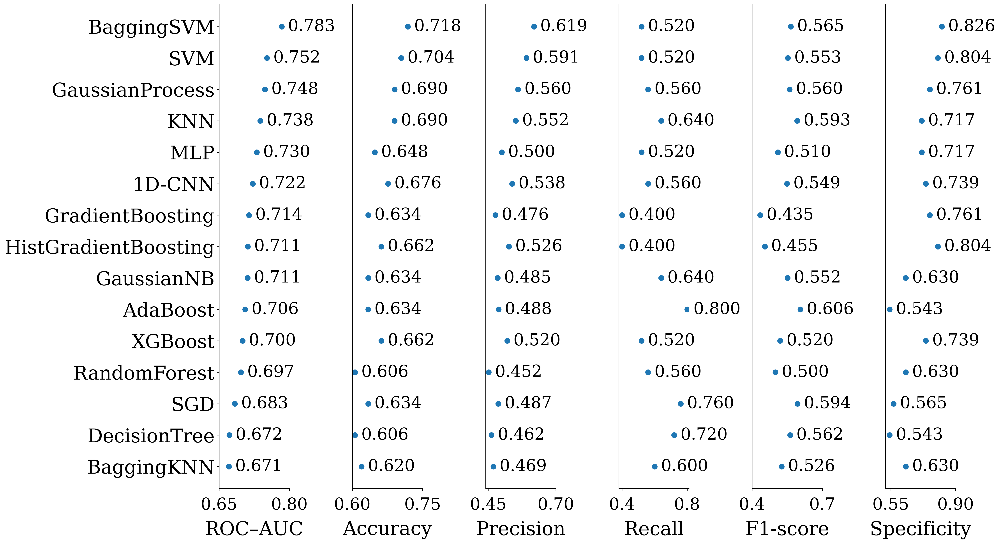

In [ ]:
# ============================================================
# FIGURE ONLY: Held-out TEST set — all metrics
# Fixes:
#  (1) value labels use a constant pixel/point offset (independent of xlim)
#  (2) extra spacing between x ticks and x-axis label
# Requires: test_table with columns:
#   Model, AUC, ACC, Precision, Recall, Specificity, F1
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import transforms
from matplotlib.ticker import MaxNLocator

# ---- Sort models (by AUC descending) ----
df = test_table.sort_values("AUC", ascending=False).reset_index(drop=True)
models = df["Model"].values
ypos = np.arange(len(models))

metric_defs = [
    ("ROC–AUC",      "AUC"),
    ("Accuracy",     "ACC"),
    ("Precision",    "Precision"),
    ("Recall",       "Recall"),
    ("F1-score",     "F1"),
    ("Specificity",  "Specificity"),
]

# ============================================================
# >>> EDIT THESE LIMITS AS YOU LIKE <<<
# ============================================================
x_limits = {
    "AUC": (0.65, 0.80),
    "ACC": (0.60, 0.75),
    "Precision": (0.44, 0.7),
    "Recall": (0.38, 0.812),
    "Specificity": (0.52, 0.90),
    "F1": (0.40, 0.70),
}

# ============================================================
# >>> MANUAL TICK CONTROL <<<
# ============================================================
x_ticks = {
    "AUC": [0.65, 0.80],
    "ACC": [0.60, 0.75],
    "Precision": [0.45, 0.70],
    "Recall": [0.40, 0.80],
    "Specificity": [0.55, 0.90],
    "F1": [0.40, 0.70],
}

# ============================================================

# -----------------------------
# USER CONTROLS (NEW)
# -----------------------------
LABEL_OFFSET_PTS = {
    # constant offset in *points* to the right of dot (independent of x-lims)
    "AUC": 10,
    "ACC": 10,
    "Precision": 10,
    "Recall": 10,        # give Recall a bit more room if you want
    "Specificity": 10,
    "F1": 10,
}
VALUE_FONTSIZE = {
    "AUC": 26,
    "ACC": 26,
    "Precision": 26,
    "Recall": 26,
    "Specificity": 26,
    "F1": 26,
}

DOT_SIZE = 8

# spacing controls
XTICK_PAD = 10        # distance between x ticks and axis spine
XLABEL_PAD = 12       # distance between x-axis label and ticks
SUBPLOT_WSPACE = -1 # reduce/adjust spacing between panels (smaller = tighter)

# ---- Style ----
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 26,
    "axes.labelsize": 30,
    "xtick.labelsize": 26,
    "ytick.labelsize": 30,
})

fig, axes = plt.subplots(
    1, len(metric_defs),
    figsize=(22, 12.5),
    dpi=300,
    sharey=True
)

for ax, (title, col) in zip(axes, metric_defs):
    vals = df[col].values

    # dots
    ax.plot(vals, ypos, "o", markersize=DOT_SIZE)

    # ---- value labels: constant offset in points (NOT data units) ----
    # This keeps spacing consistent even if xlim differs across panels.
    dx = LABEL_OFFSET_PTS.get(col, 10) / 72.0  # points -> inches
    text_trans = ax.transData + transforms.ScaledTranslation(dx, 0, fig.dpi_scale_trans)

    for v, y in zip(vals, ypos):
        ax.text(
            v, y, f"{v:.3f}",
            transform=text_trans,
            va="center", ha="left",
            fontsize=VALUE_FONTSIZE.get(col, 16)
        )

    # custom limits
    if col in x_limits:
        ax.set_xlim(x_limits[col])

    if col in x_ticks:
      ax.set_xticks(x_ticks[col])
    # labels & spacing
    ax.set_xlabel(title, labelpad=XLABEL_PAD)
    ax.tick_params(axis="x", pad=XTICK_PAD)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.grid(False)

# Y-axis labels only on first subplot
axes[0].set_yticks(ypos)
axes[0].set_yticklabels(models)
axes[0].invert_yaxis()

for ax in axes[1:]:
    ax.tick_params(axis="y", left=False, labelleft=False)

# control spacing between subplots
fig.subplots_adjust(wspace=SUBPLOT_WSPACE)

plt.tight_layout()
plt.savefig("TEST10_all_metrics.png", dpi=300, bbox_inches="tight")
plt.savefig("TEST10_all_metrics.pdf", bbox_inches="tight")
plt.show()

#Recall

=== Best threshold by Youden's J (recall + spec − 1) ===
thr        0.270000
acc        0.701977
prec       0.554688
recall     0.841897
spec       0.624176
f1         0.668760
youdenJ    0.466073

=== Best threshold achieving recall ≥ 0.90 (max specificity) ===
thr        0.214000
acc        0.669492
prec       0.521739
recall     0.901186
spec       0.540659
f1         0.660870
youdenJ    0.441845


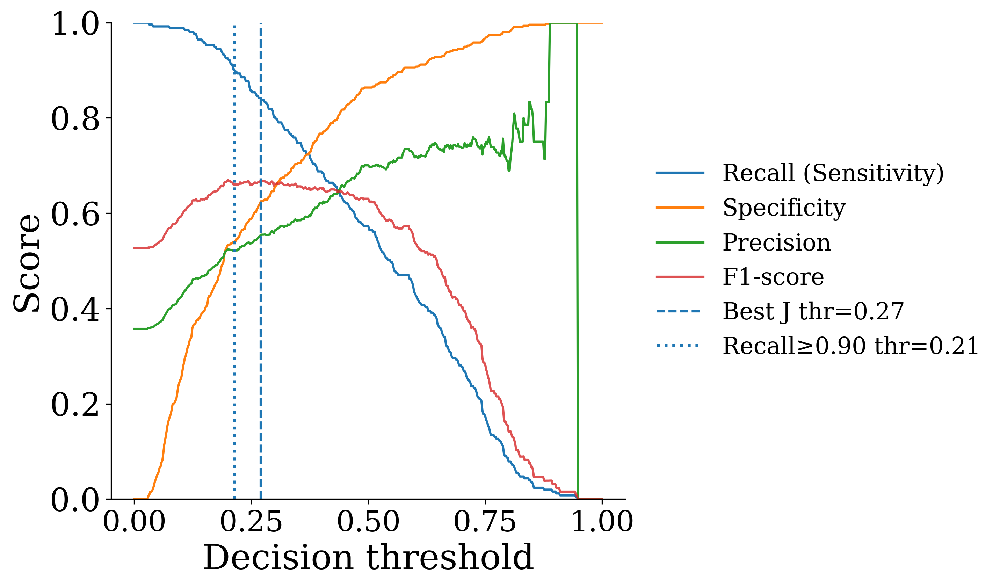

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

def metrics_at_threshold(y_true, prob, thr):
    y_pred = (prob >= thr).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0,1]).ravel()

    acc  = (tp + tn) / (tp + tn + fp + fn)
    rec  = tp / (tp + fn) if (tp + fn) else 0.0                 # sensitivity / recall
    spec = tn / (tn + fp) if (tn + fp) else 0.0                 # specificity
    prec = tp / (tp + fp) if (tp + fp) else 0.0                 # precision
    f1   = 2*prec*rec/(prec+rec) if (prec+rec) else 0.0
    return acc, prec, rec, spec, f1

def threshold_sweep(y_true, prob, target_recall=0.80, n_grid=501, make_plot=True):
    y_true = np.asarray(y_true).astype(int)
    prob   = np.asarray(prob).astype(float)

    thrs = np.linspace(0, 1, n_grid)
    rows = []
    for t in thrs:
        acc, prec, rec, spec, f1 = metrics_at_threshold(y_true, prob, t)
        J = rec + spec - 1
        rows.append([t, acc, prec, rec, spec, f1, J])

    df = pd.DataFrame(rows, columns=["thr","acc","prec","recall","spec","f1","youdenJ"])

    # 1) Best Youden's J
    best_J = df.iloc[df["youdenJ"].values.argmax()]

    # 2) Best specificity subject to recall >= target
    feasible = df[df["recall"] >= target_recall].copy()
    if len(feasible) > 0:
        best_target = feasible.iloc[feasible["spec"].values.argmax()]
    else:
        best_target = None

    print("=== Best threshold by Youden's J (recall + spec − 1) ===")
    print(best_J[["thr","acc","prec","recall","spec","f1","youdenJ"]].to_string())

    if best_target is not None:
        print(f"\n=== Best threshold achieving recall ≥ {target_recall:.2f} (max specificity) ===")
        print(best_target[["thr","acc","prec","recall","spec","f1","youdenJ"]].to_string())
    else:
        print(f"\nNo threshold reached recall ≥ {target_recall:.2f}. "
              f"Max recall achieved = {df['recall'].max():.3f} at thr={df.loc[df['recall'].idxmax(),'thr']:.3f}")

    if make_plot:
        fig, ax = plt.subplots(figsize=(10,6), dpi=300)
        ax.plot(df["thr"], df["recall"], label="Recall (Sensitivity)")
        ax.plot(df["thr"], df["spec"], label="Specificity")
        ax.plot(df["thr"], df["prec"], label="Precision")
        ax.plot(df["thr"], df["f1"], label="F1-score", alpha=0.8)

        ax.axvline(best_J["thr"], linestyle="--", linewidth=1.5, label=f"Best J thr={best_J['thr']:.2f}")

        if best_target is not None:
            ax.axvline(best_target["thr"], linestyle=":", linewidth=2.0,
                       label=f"Recall≥{target_recall:.2f} thr={best_target['thr']:.2f}")

        ax.set_xlabel("Decision threshold")
        ax.set_ylabel("Score")
        ax.set_ylim(0, 1)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.legend(frameon=False, ncol=1, loc="center left", bbox_to_anchor=(1.02, 0.5))
        plt.tight_layout()
        plt.show()

    return df, best_J, best_target

# -------------------------
# USE IT (choose your model)
# -------------------------
model_name = "SVM"  # try "SGD (log-loss)", "MLP", etc.

prob = oof_probs.get(model_name, None)
if prob is None:
    raise ValueError(f"No OOF probabilities found for {model_name}. "
                     f"Make sure it supports predict_proba and was run in CV.")

df_thr, best_J, best_target = threshold_sweep(y, prob, target_recall=0.90, n_grid=501, make_plot=True)

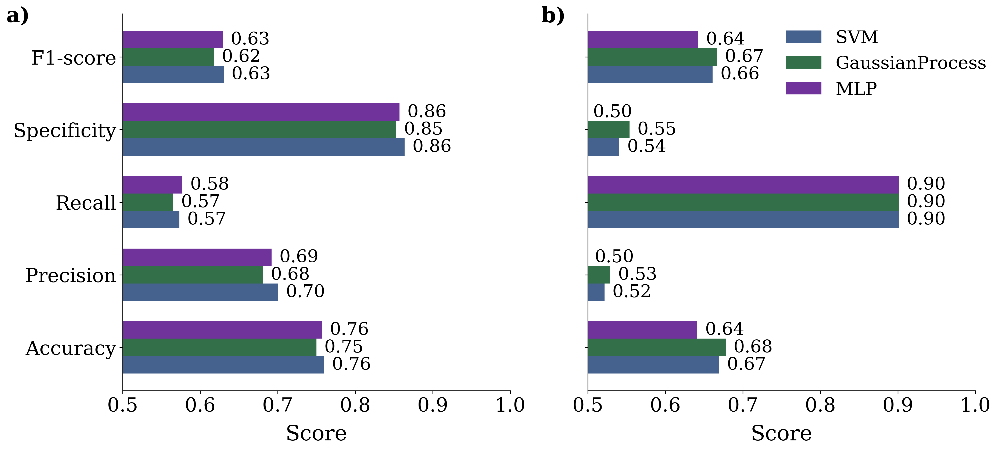

In [ ]:
# ============================================================
# Top-3 models: Annotated horizontal bar comparison
# BEFORE vs AFTER threshold tuning
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def lighten_color(color, amount=0.35):
    """
    Blend color toward white.
    amount=0   -> original color
    amount=1   -> fully white
    0.2–0.5    -> good softening range
    """
    c = np.array(mcolors.to_rgb(color))
    white = np.array([1, 1, 1])
    return tuple(c + (white - c) * amount)

BASE_COLORS = {
    "SVM": "#173A72",
    "GaussianProcess": "#004C1C",
    "MLP": "#4B0082"
}

# ---- Top 3 models ----
top3 = ["SVM", "GaussianProcess", "MLP"]
# --- model colors (from your donut first-slice codes) ---
MODEL_COLORS = {
    model: lighten_color(color, amount=0.2)   # <-- adjust this
    for model, color in BASE_COLORS.items()
}
# Full metric names
metrics = ["Accuracy", "Precision", "Recall", "Specificity", "F1-score"]
metric_keys = ["ACC", "Precision", "Recall", "Spec", "F1"]

before_vals = before_df.loc[top3, metric_keys]
after_vals  = after_df.loc[top3, metric_keys]

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 20,
    "axes.labelsize": 24,
    "xtick.labelsize": 22,
    "ytick.labelsize": 22,
})

fig, axes = plt.subplots(1, 2, figsize=(16, 7.5), dpi=300, sharey=True)

bar_h = 0.24
y_base = np.arange(len(metrics))

# ------------------------------------------------
# (a) BEFORE
# ------------------------------------------------
for i, model in enumerate(top3):
    bars = axes[0].barh(
        y_base + (i - 1)*bar_h,
        before_vals.loc[model],
        height=bar_h,
        label=model,
        color=MODEL_COLORS[model]
    )
    # annotate values
    for bar in bars:
        width = bar.get_width()
        axes[0].text(width + 0.01, bar.get_y() + bar.get_height()/2,
                     f"{width:.2f}", va="center", fontsize=20)

axes[0].set_xlim(0.5, 1.0)
axes[0].set_yticks(y_base)
axes[0].set_yticklabels(metrics)
axes[0].set_xlabel("Score",  labelpad=10)
axes[0].spines["top"].set_visible(False)
axes[0].spines["right"].set_visible(False)
axes[0].grid(False)

axes[0].text(-0.30, 1.02, "a)", transform=axes[0].transAxes,
             fontsize=24, fontweight="bold", va="top")

# ------------------------------------------------
# (b) AFTER
# ------------------------------------------------
for i, model in enumerate(top3):
    bars = axes[1].barh(
        y_base + (i - 1)*bar_h,
        after_vals.loc[model],
        height=bar_h,
        label=model,
        color=MODEL_COLORS[model]
    )
    # annotate values
    for bar in bars:
        width = bar.get_width()
        axes[1].text(width + 0.01, bar.get_y() + bar.get_height()/2,
                     f"{width:.2f}", va="center", fontsize=20)

axes[1].set_xlim(0.5, 1.0)
axes[1].set_xlabel("Score",  labelpad=10)

axes[1].spines["top"].set_visible(False)
axes[1].spines["right"].set_visible(False)
axes[1].grid(False)

axes[1].text(-0.12, 1.02, "b)", transform=axes[1].transAxes,
             fontsize=24, fontweight="bold", va="top")

# Legend top right
axes[1].legend(frameon=False, loc="upper right", ncol=1, fontsize=20,  bbox_to_anchor=(1.07, 1))

plt.tight_layout()
plt.savefig("Top3_metrics.png", dpi=300, bbox_inches="tight")
plt.savefig("Top3_metrics.pdf", bbox_inches="tight")
plt.show()

In [ ]:
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.base import clone

from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.ensemble import (
    HistGradientBoostingClassifier, GradientBoostingClassifier,
    RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
)
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import tree

# TensorFlow for CNN
import tensorflow as tf

# Optional: XGBoost
xgb_available = True
try:
    import xgboost as xgb
except Exception:
    xgb_available = False

# ----------------------------
# CONFIG
# ----------------------------
RANDOM_STATE_SPLIT = 8
CV_FOLDS = 5
THR = 0.5

USE_UNDERSAMPLE_FOR_KNN_BAGGING = True  # recommended for KNN-like models (sample_weight won't help)

CNN_HP = {
    "filters1": 64, "kernel1": 3, "pool1": 0,
    "use_block2": True, "filters2": 64, "kernel2": 5, "pool2": 0,
    "dense1": 128, "use_dense2": True, "dense2": 128,
    "dropout1": 0.2, "dropout2": 0.4,
    "batchnorm": True,
    "optimizer": "adam",
    "lr": 0.003,
    "batch_size": 16,
    "epochs": 200,
    "patience": 25,
    "val_split": 0.12
}

# ----------------------------
# DATA
# ----------------------------
X = np.asarray(x)
y_arr = np.asarray(y).astype(int).ravel()  # IMPORTANT: 1D

# Global class weights (informational)
unique_classes = np.unique(y_arr)
print("Unique labels in y:", unique_classes)

cw = compute_class_weight(
    class_weight="balanced",
    classes=unique_classes,
    y=y_arr
)

CLASS_WEIGHT_DICT = dict(zip(unique_classes, cw))
print("Computed class weights:", CLASS_WEIGHT_DICT)
# CLASS_WEIGHT_DICT = {0: float(cw[0]), 1: float(cw[1])}
print("Global class weights:", CLASS_WEIGHT_DICT)

# 90/10 split (stratified)
X_train90, X_test10, y_train90, y_test10 = train_test_split(
    X, y_arr, test_size=0.10, random_state=RANDOM_STATE_SPLIT, stratify=y_arr
)
print("Train (90%) shape:", X_train90.shape, "Test (10%) shape:", X_test10.shape)
print("Train class counts:", np.bincount(y_train90))
print("Test  class counts:", np.bincount(y_test10))

# ----------------------------
# HELPERS
# ----------------------------
def specificity(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    return tn / (tn + fp) if (tn + fp) else 0.0

def metrics_from_prob(y_true, prob, thr=0.5):
    pred = (prob >= thr).astype(int)
    return {
        "AUC": roc_auc_score(y_true, prob),
        "ACC": accuracy_score(y_true, pred),
        "Precision": precision_score(y_true, pred, zero_division=0),
        "Recall": recall_score(y_true, pred, zero_division=0),
        "F1": f1_score(y_true, pred, zero_division=0),
        "Specificity": specificity(y_true, pred),
    }

def get_probabilities(estimator, X_eval):
    if hasattr(estimator, "predict_proba"):
        return estimator.predict_proba(X_eval)[:, 1]
    if hasattr(estimator, "decision_function"):
        s = estimator.decision_function(X_eval)
        return (s - s.min()) / (s.max() - s.min() + 1e-12)
    return estimator.predict(X_eval).astype(float)

def make_sample_weight_balanced(y):
    y = np.asarray(y).astype(int).ravel()
    n = len(y)
    n0 = np.sum(y == 0)
    n1 = np.sum(y == 1)
    w0 = n / (2 * n0) if n0 else 1.0
    w1 = n / (2 * n1) if n1 else 1.0
    return np.where(y == 0, w0, w1).astype(float)

def undersample_to_balance(X, y, seed=42):
    rng = np.random.default_rng(seed)
    y = np.asarray(y).astype(int).ravel()
    idx0 = np.where(y == 0)[0]
    idx1 = np.where(y == 1)[0]
    n = min(len(idx0), len(idx1))
    if n == 0:
        return X, y
    idx0_s = rng.choice(idx0, size=n, replace=False)
    idx1_s = rng.choice(idx1, size=n, replace=False)
    sel = np.concatenate([idx0_s, idx1_s])
    rng.shuffle(sel)
    return X[sel], y[sel]

# ----------------------------
# CNN BUILD / FIT
# ----------------------------
def build_cnn_arch(input_len, hp):
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization
    from tensorflow.keras import optimizers

    model = Sequential()
    model.add(tf.keras.layers.Input(shape=(input_len, 1)))

    model.add(Conv1D(hp["filters1"], hp["kernel1"], activation="relu"))
    if hp["pool1"] and hp["pool1"] > 0:
        model.add(MaxPooling1D(hp["pool1"]))

    if hp["use_block2"]:
        model.add(Conv1D(hp["filters2"], hp["kernel2"], activation="relu"))
        if hp["pool2"] and hp["pool2"] > 0:
            model.add(MaxPooling1D(hp["pool2"]))

    model.add(Flatten())

    model.add(Dense(hp["dense1"], activation="relu"))
    if hp["batchnorm"]:
        model.add(BatchNormalization())
    model.add(Dropout(hp["dropout1"]))

    if hp["use_dense2"]:
        model.add(Dense(hp["dense2"], activation="relu"))
        if hp["batchnorm"]:
            model.add(BatchNormalization())
        model.add(Dropout(hp["dropout2"]))

    model.add(Dense(1, activation="sigmoid"))

    lr = hp["lr"]
    if hp["optimizer"] == "adam":
        opt = optimizers.Adam(learning_rate=lr)
    elif hp["optimizer"] == "adamax":
        opt = optimizers.Adamax(learning_rate=lr)
    else:
        opt = optimizers.RMSprop(learning_rate=lr)

    model.compile(optimizer=opt, loss="binary_crossentropy")
    return model

def fit_cnn_and_predict_proba(Xtr, ytr, Xeval, hp, class_weight_dict, seed=42):
    """
    Fit CNN on Xtr/ytr with internal val_split, return probabilities on Xeval.
    Scaling is handled outside; inputs must be already standardized.
    """
    tf.keras.backend.clear_session()
    tf.random.set_seed(seed)

    cnn = build_cnn_arch(Xtr.shape[1], hp)
    early = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=hp["patience"],
        restore_best_weights=True
    )

    Xtr_c = Xtr.reshape(-1, Xtr.shape[1], 1)
    Xev_c = Xeval.reshape(-1, Xtr.shape[1], 1)

    cnn.fit(
        Xtr_c, ytr,
        validation_split=hp["val_split"],
        epochs=hp["epochs"],
        batch_size=hp["batch_size"],
        verbose=0,
        callbacks=[early],
        class_weight=class_weight_dict
    )

    prob = cnn.predict(Xev_c, verbose=0).ravel()
    return prob

# ----------------------------
# DEFINE CLASSICAL MODELS (final_models dict name kept)
# ----------------------------
final_models = {}

final_models["BaggingKNN"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", BaggingClassifier(
        estimator=KNeighborsClassifier(n_neighbors=5, weights="uniform", algorithm="auto"),
        n_estimators=100, bootstrap=True, max_samples=0.9, max_features=0.7,
        random_state=42
    ))
])

final_models["BaggingSVM"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", BaggingClassifier(
        estimator=SVC(C=80, gamma=0.002, probability=True, kernel="rbf"),
        n_estimators=100, bootstrap=True, max_samples=0.9, max_features=54,
        random_state=42
    ))
])

final_models["DecisionTree"] = tree.DecisionTreeClassifier(
    criterion="gini", splitter="random",
    max_depth=4, max_features=None, min_samples_split=12,
    random_state=42
)

final_models["SGD"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SGDClassifier(
        loss="log_loss",
        penalty="elasticnet",
        alpha=0.001,
        l1_ratio=0.5,
        max_iter=20000,
        tol=1e-4,
        class_weight="balanced",
        random_state=42
    ))
])

final_models["SVM"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SVC(
        kernel="rbf", probability=True,
        C=2.761699813343848,
        gamma=0.004436687330978612,
        class_weight="balanced",
        random_state=42
    ))
])

final_models["HistGradientBoosting"] = HistGradientBoostingClassifier(
    loss="log_loss", learning_rate=0.08,
    max_iter=150, max_leaf_nodes=7,
    min_samples_leaf=20, l2_regularization=1.0,
    random_state=42
)

final_models["MLP"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", MLPClassifier(
        hidden_layer_sizes=(55, 18, 1),
        tol=1e-6, batch_size=28, max_iter=2500,
        activation="identity", solver="sgd", alpha=0.2,
        learning_rate_init=0.00005, learning_rate="adaptive",
        random_state=42
    ))
])

final_models["GaussianProcess"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", GaussianProcessClassifier(kernel=1 * RBF(2), random_state=42))
])

final_models["RandomForest"] = RandomForestClassifier(
    n_estimators=80, criterion="log_loss", max_depth=5, min_samples_leaf=5,
    max_features=0.5, min_samples_split=20, bootstrap=True,
    class_weight="balanced",
    random_state=42
)

final_models["GradientBoosting"] = GradientBoostingClassifier(
    n_estimators=60, learning_rate=0.02, max_depth=4,
    min_samples_split=10, random_state=42
)

final_models["AdaBoost"] = AdaBoostClassifier(
    n_estimators=110, learning_rate=0.15, random_state=42
)

final_models["KNN"] = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", KNeighborsClassifier(n_neighbors=17, weights="uniform", p=1))
])

final_models["GaussianNB"] = GaussianNB(var_smoothing=1e-10)

if xgb_available:
    pos = float(np.sum(y_train90 == 1))
    neg = float(np.sum(y_train90 == 0))
    scale_pos_weight = (neg / pos) if pos > 0 else 1.0

    final_models["XGBoost"] = xgb.XGBClassifier(
        booster="gbtree",
        eta=0.05, gamma=0,
        max_depth=4, learning_rate=0.05,
        subsample=0.5, colsample_bytree=0.5,
        alpha=1,
        tree_method="hist",
        random_state=42,
        eval_metric="logloss",
        scale_pos_weight=scale_pos_weight
    )

print("\nModels in final_models:", list(final_models.keys()))
print("Also evaluating: 1D-CNN")

Unique labels in y: [0 1]
Computed class weights: {np.int64(0): np.float64(0.778021978021978), np.int64(1): np.float64(1.3992094861660078)}
Global class weights: {np.int64(0): np.float64(0.778021978021978), np.int64(1): np.float64(1.3992094861660078)}
Train (90%) shape: (637, 55) Test (10%) shape: (71, 55)
Train class counts: [409 228]
Test  class counts: [46 25]

Models in final_models: ['BaggingKNN', 'BaggingSVM', 'DecisionTree', 'SGD', 'SVM', 'HistGradientBoosting', 'MLP', 'GaussianProcess', 'RandomForest', 'GradientBoosting', 'AdaBoost', 'KNN', 'GaussianNB', 'XGBoost']
Also evaluating: 1D-CNN


X shape: (708, 55)
y shape: (708,)
Unique labels: [0 1]
Train (90%) shape: (637, 55) Test (10%) shape: (71, 55)
Train class counts: [409 228]
Test  class counts: [46 25]


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perce

Tuned thresholds (from TRAIN90 OOF only):
  BaggingSVM: 0.270
  SVM: 0.230
  GaussianProcess: 0.235


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(



Models plotted: ['BaggingSVM', 'SVM', 'GaussianProcess']


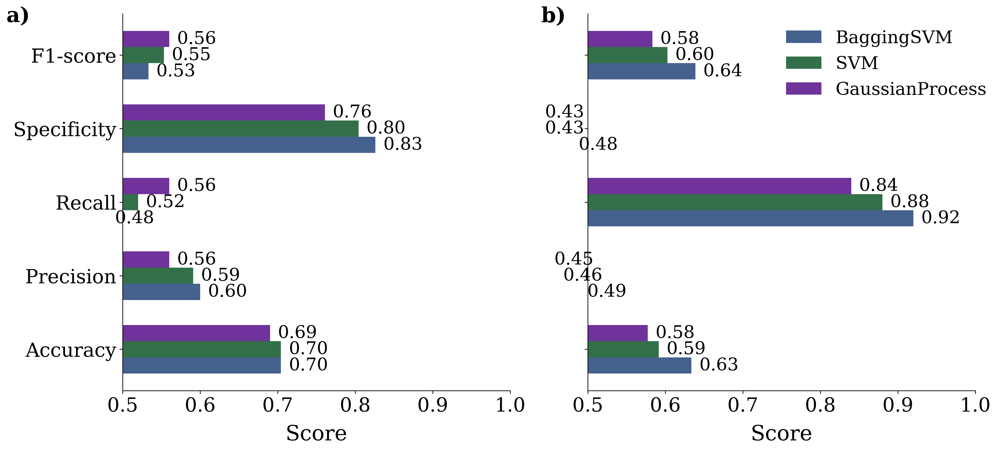

,thr_used,ACC,Precision,Recall,Spec,F1
Model,,,,,,
BaggingSVM,0.270,0.634,0.489,0.92,0.478,0.639
SVM,0.230,0.592,0.458,0.88,0.435,0.603
GaussianProcess,0.235,0.577,0.447,0.84,0.435,0.583


In [ ]:
# ============================================================
# CORRECT THRESHOLD TUNING (NO TEST LEAKAGE)
# - 90/10 stratified split
# - Tune thresholds ONLY using out-of-fold (OOF) predictions on TRAIN90 via 5-fold CV
# - Fit final model on TRAIN90, then evaluate ONCE on TEST10:
#     (a) BEFORE: threshold=0.50
#     (b) AFTER : threshold=tuned_from_OOF
# - Produces: before_df, after_df  (indexed by model name)
# - Then plots BEFORE vs AFTER bars for chosen models
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.base import clone

# -------------------------
# 0) DATA split
# -------------------------

X = np.asarray(x)
y_arr = np.asarray(y).astype(int).ravel()

# ---- FIX y SHAPE + LENGTH CHECK (put this right before train_test_split) ----
X = np.asarray(x)

y_arr = np.asarray(y)

# common cases:
# 1) y is (1, n) or (n, 1) -> squeeze to (n,)
# 2) y is a pandas Series/DataFrame -> convert cleanly
y_arr = np.squeeze(y_arr)

# if it still becomes a scalar, it means y is truly one value (wrong variable)
if y_arr.ndim == 0:
    raise ValueError(
        f"y became a scalar ({y_arr}). Your `y` variable is not the label vector. "
        "Print `type(y)`, `np.asarray(y).shape`, and show how you created y."
    )

y_arr = y_arr.astype(int).ravel()

print("X shape:", X.shape)
print("y shape:", y_arr.shape)
print("Unique labels:", np.unique(y_arr))

if X.shape[0] != len(y_arr):
    raise ValueError(
        f"Inconsistent samples: X has {X.shape[0]} rows but y has {len(y_arr)} labels. "
        "Your y is not aligned with X."
    )

# now safe:
X_train90, X_test10, y_train90, y_test10 = train_test_split(
    X, y_arr, test_size=0.10, random_state=8, stratify=y_arr
)

X_train90, X_test10, y_train90, y_test10 = train_test_split(
    X, y_arr, test_size=0.10, random_state=8, stratify=y_arr
)

print("Train (90%) shape:", X_train90.shape, "Test (10%) shape:", X_test10.shape)
print("Train class counts:", np.bincount(y_train90))
print("Test  class counts:", np.bincount(y_test10))

# -------------------------
# 1) USER SETTINGS
# -------------------------
# Pick 3 or 4 models; comment out any later
models_to_plot = [
    "BaggingSVM",
    "SVM",
    # "KNN",
    "GaussianProcess",
]

TARGET_RECALL = 0.90           # set your target
MIN_PRECISION = None           # e.g., 0.50 if you want a hard constraint; or None to ignore
THRESH_GRID = np.linspace(0.05, 0.95, 181)

# If you want to tune to "closest to target recall" (recommended)
TUNE_MODE = "closest"          # "closest" or "max_f1_under_constraint"

# -------------------------
# 2) helpers
# -------------------------
def specificity(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    return tn / (tn + fp) if (tn + fp) else 0.0

def metrics_from_prob(y_true, prob, thr=0.5):
    pred = (prob >= thr).astype(int)
    return {
        "AUC": roc_auc_score(y_true, prob),
        "ACC": accuracy_score(y_true, pred),
        "Precision": precision_score(y_true, pred, zero_division=0),
        "Recall": recall_score(y_true, pred, zero_division=0),
        "F1": f1_score(y_true, pred, zero_division=0),
        "Spec": specificity(y_true, pred),
    }

def get_probabilities(estimator, X_eval):
    """Return P(y=1). Works for predict_proba or decision_function."""
    if hasattr(estimator, "predict_proba"):
        return estimator.predict_proba(X_eval)[:, 1]
    if hasattr(estimator, "decision_function"):
        s = estimator.decision_function(X_eval)
        return (s - s.min()) / (s.max() - s.min() + 1e-12)
    # fallback (rare)
    return estimator.predict(X_eval).astype(float)

def tune_threshold_from_oof(y_true_oof, prob_oof,
                            target_recall=0.70,
                            min_precision=None,
                            grid=np.linspace(0.05,0.95,181),
                            mode="closest"):
    rows = []
    for thr in grid:
        m = metrics_from_prob(y_true_oof, prob_oof, thr=thr)
        rows.append({"thr": thr, **m})
    df = pd.DataFrame(rows)

    # Feasible set by constraints
    feasible = df[df["Recall"] >= target_recall].copy()
    if min_precision is not None:
        feasible = feasible[feasible["Precision"] >= float(min_precision)].copy()

    if len(feasible) == 0:
        # fallback: maximize F1 (and then Recall) on OOF
        best = df.sort_values(["F1", "Recall"], ascending=[False, False]).iloc[0]
        return float(best["thr"]), df

    if mode == "closest":
        # smallest overshoot above target recall, then prefer higher precision, then higher threshold (more conservative)
        feasible["overshoot"] = feasible["Recall"] - target_recall
        best = feasible.sort_values(["overshoot", "Precision", "thr"], ascending=[True, False, False]).iloc[0]
        return float(best["thr"]), df

    # alternative: maximize F1 among feasible thresholds
    best = feasible.sort_values(["F1", "Precision"], ascending=[False, False]).iloc[0]
    return float(best["thr"]), df

# sanity
assert "final_models" in globals(), "final_models dict not found. Run your model-definition block first."

# -------------------------
# 3) OOF predictions on TRAIN90 (5-fold) for each model
# -------------------------
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

oof_prob = {name: np.full(len(y_train90), np.nan, dtype=float) for name in final_models.keys()}
# note: CNN is handled separately elsewhere; this block is for sklearn models in final_models

for fold, (tr_idx, va_idx) in enumerate(skf.split(X_train90, y_train90), start=1):
    Xtr, Xva = X_train90[tr_idx], X_train90[va_idx]
    ytr, yva = y_train90[tr_idx], y_train90[va_idx]

    for name, mdl in final_models.items():
        est = clone(mdl)
        est.fit(Xtr, ytr)
        prob = get_probabilities(est, Xva)
        oof_prob[name][va_idx] = prob

# confirm no NaNs
for name, arr in oof_prob.items():
    if np.isnan(arr).any():
        raise RuntimeError(f"OOF probs contain NaN for model {name}. Something failed in CV.")

# -------------------------
# 4) Tune thresholds using OOF only
# -------------------------
tuned_thresholds = {}
tuning_curves = {}  # optional, keep if you want to inspect later

for name in final_models.keys():
    thr_star, curve = tune_threshold_from_oof(
        y_true_oof=y_train90,
        prob_oof=oof_prob[name],
        target_recall=TARGET_RECALL,
        min_precision=MIN_PRECISION,
        grid=THRESH_GRID,
        mode=TUNE_MODE
    )
    tuned_thresholds[name] = thr_star
    tuning_curves[name] = curve

print("Tuned thresholds (from TRAIN90 OOF only):")
for k in models_to_plot:
    if k in tuned_thresholds:
        print(f"  {k}: {tuned_thresholds[k]:.3f}")

# -------------------------
# 5) Final fit on TRAIN90, evaluate once on TEST10 (before vs after)
# -------------------------
before_rows = []
after_rows  = []

for name, mdl in final_models.items():
    est = clone(mdl)
    est.fit(X_train90, y_train90)

    prob_test = get_probabilities(est, X_test10)

    # BEFORE: thr=0.5
    m_before = metrics_from_prob(y_test10, prob_test, thr=0.50)
    m_before["Model"] = name
    before_rows.append(m_before)

    # AFTER: thr=tuned on OOF train
    thr = tuned_thresholds[name]
    m_after = metrics_from_prob(y_test10, prob_test, thr=thr)
    m_after["Model"] = name
    m_after["thr_used"] = thr
    after_rows.append(m_after)

before_df = pd.DataFrame(before_rows).set_index("Model")
after_df  = pd.DataFrame(after_rows).set_index("Model")

# keep only plot models (and keep order)
models_to_plot = [m for m in models_to_plot if m in before_df.index]
print("\nModels plotted:", models_to_plot)

# -------------------------
# 6) PLOT: BEFORE vs AFTER (same structure as your figure)
# -------------------------
def lighten_color(color, amount=0.35):
    c = np.array(mcolors.to_rgb(color))
    white = np.array([1, 1, 1])
    return tuple(c + (white - c) * amount)

# set any colors you want here (optional)
BASE_COLORS = {
    "BaggingSVM": "#173A72",
    "SVM": "#004C1C",
    "KNN": "#6B2E2E",
    "GaussianProcess": "#4B0082",
}

MODEL_COLORS = {
    model: lighten_color(BASE_COLORS.get(model, "#333333"), amount=0.2)
    for model in models_to_plot
}

metrics = ["Accuracy", "Precision", "Recall", "Specificity", "F1-score"]
metric_keys = ["ACC", "Precision", "Recall", "Spec", "F1"]

before_vals = before_df.loc[models_to_plot, metric_keys]
after_vals  = after_df.loc[models_to_plot,  metric_keys]

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 20,
    "axes.labelsize": 24,
    "xtick.labelsize": 22,
    "ytick.labelsize": 22,
})

fig, axes = plt.subplots(1, 2, figsize=(16, 7.5), dpi=300, sharey=True)

bar_h = 0.22 if len(models_to_plot) <= 3 else 0.17
y_base = np.arange(len(metrics))
center = (len(models_to_plot) - 1) / 2.0

# (a) BEFORE
for i, model in enumerate(models_to_plot):
    bars = axes[0].barh(
        y_base + (i - center) * bar_h,
        before_vals.loc[model],
        height=bar_h,
        label=model,
        color=MODEL_COLORS[model]
    )
    for bar in bars:
        w = bar.get_width()
        axes[0].text(w + 0.01, bar.get_y() + bar.get_height()/2,
                     f"{w:.2f}", va="center", fontsize=20)

axes[0].set_xlim(0.5, 1.0)
axes[0].set_yticks(y_base)
axes[0].set_yticklabels(metrics)
axes[0].set_xlabel("Score", labelpad=10)
axes[0].spines["top"].set_visible(False)
axes[0].spines["right"].set_visible(False)
axes[0].grid(False)
axes[0].text(-0.30, 1.02, "a)", transform=axes[0].transAxes,
             fontsize=24, fontweight="bold", va="top")

# (b) AFTER
for i, model in enumerate(models_to_plot):
    bars = axes[1].barh(
        y_base + (i - center) * bar_h,
        after_vals.loc[model],
        height=bar_h,
        label=model,
        color=MODEL_COLORS[model]
    )
    for bar in bars:
        w = bar.get_width()
        axes[1].text(w + 0.01, bar.get_y() + bar.get_height()/2,
                     f"{w:.2f}", va="center", fontsize=20)

axes[1].set_xlim(0.5, 1.0)
axes[1].set_xlabel("Score", labelpad=10)
axes[1].spines["top"].set_visible(False)
axes[1].spines["right"].set_visible(False)
axes[1].grid(False)
axes[1].text(-0.12, 1.02, "b)", transform=axes[1].transAxes,
             fontsize=24, fontweight="bold", va="top")

axes[1].legend(frameon=False, loc="upper right", ncol=1, fontsize=20, bbox_to_anchor=(1.07, 1))

plt.tight_layout()
plt.savefig("Top_models_threshold_tuning_correct.png", dpi=300, bbox_inches="tight")
plt.savefig("Top_models_threshold_tuning_correct.pdf", bbox_inches="tight")
plt.show()

# Optional: show tuned thresholds used
display(after_df.loc[models_to_plot, ["thr_used"] + metric_keys].round(3))

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perce

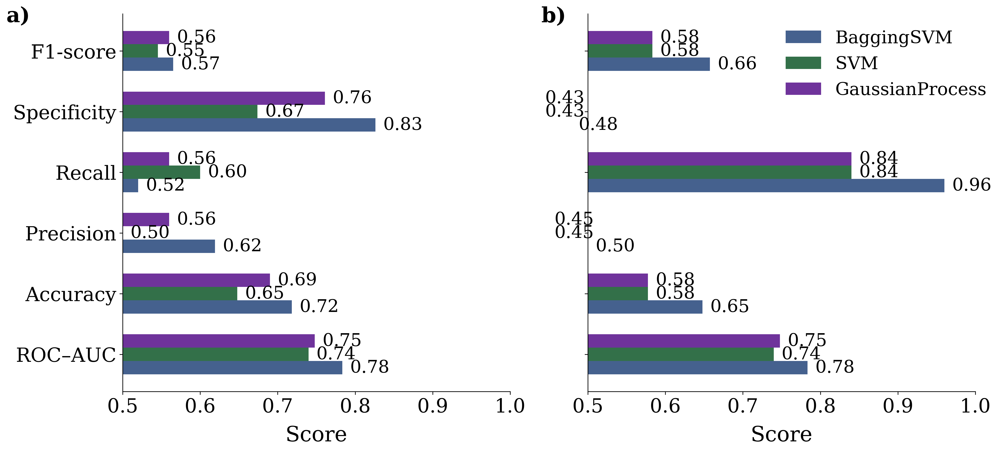

,thr_used,AUC,ACC,Precision,Recall,Spec,F1
Model,,,,,,,
BaggingSVM,0.270,0.783,0.648,0.500,0.96,0.478,0.658
SVM,0.230,0.740,0.577,0.447,0.84,0.435,0.583
GaussianProcess,0.235,0.748,0.577,0.447,0.84,0.435,0.583


In [ ]:
# -------------------------
# choose ONLY top-3 models
# -------------------------
models_to_plot = ["BaggingSVM", "SVM", "GaussianProcess"]

# colors in the SAME order: blue, green, purple
BASE_COLORS = {
    "BaggingSVM": "#173A72",      # blue
    "SVM": "#004C1C",             # green
    "GaussianProcess": "#4B0082"  # purple
}

# -------------------------
# sample_weight helper (balanced)
# -------------------------

import inspect

def fit_with_optional_sample_weight(est, Xtr, ytr):
    """
    Try to fit with balanced sample_weight when supported.
    If the estimator (or Bagging base estimator) doesn't support sample_weight,
    fall back to normal fit.
    """
    sw = make_sample_weight_balanced(ytr)

    try:
        # Pipeline case: pass weight to the final step
        if hasattr(est, "named_steps") and "clf" in est.named_steps:
            est.fit(Xtr, ytr, clf__sample_weight=sw)
        else:
            est.fit(Xtr, ytr, sample_weight=sw)
        return est

    except (TypeError, ValueError) as e:
        # Common BaggingKNN failure: base estimator doesn't accept sample_weight
        msg = str(e).lower()
        if ("doesn't support sample weight" in msg) or ("sample_weight" in msg):
            est.fit(Xtr, ytr)
            return est
        # If it's another ValueError, re-raise (so you don't hide real bugs)
        raise

def make_sample_weight_balanced(y):
    y = np.asarray(y).astype(int).ravel()
    n = len(y)
    n0 = np.sum(y == 0)
    n1 = np.sum(y == 1)
    w0 = n / (2 * n0) if n0 else 1.0
    w1 = n / (2 * n1) if n1 else 1.0
    return np.where(y == 0, w0, w1).astype(float)


# -------------------------
# 3) OOF predictions on TRAIN90 (5-fold) for each model
# -------------------------
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

oof_prob = {name: np.full(len(y_train90), np.nan, dtype=float) for name in final_models.keys()}

for fold, (tr_idx, va_idx) in enumerate(skf.split(X_train90, y_train90), start=1):
    Xtr, Xva = X_train90[tr_idx], X_train90[va_idx]
    ytr, yva = y_train90[tr_idx], y_train90[va_idx]

    for name, mdl in final_models.items():
        est = clone(mdl)

        # IMPORTANT: apply sample_weight consistently (especially for BaggingSVM)
        est = fit_with_optional_sample_weight(est, Xtr, ytr)

        prob = get_probabilities(est, Xva)
        oof_prob[name][va_idx] = prob

# -------------------------
# 5) Final fit on TRAIN90, evaluate once on TEST10 (before vs after)
# -------------------------
before_rows = []
after_rows  = []

for name, mdl in final_models.items():
    est = clone(mdl)

    # IMPORTANT: same weighting rule in final fit
    est = fit_with_optional_sample_weight(est, X_train90, y_train90)

    prob_test = get_probabilities(est, X_test10)

    # BEFORE: thr=0.5
    m_before = metrics_from_prob(y_test10, prob_test, thr=0.50)
    m_before["Model"] = name
    before_rows.append(m_before)

    # AFTER: thr=tuned on OOF train
    thr = tuned_thresholds[name]
    m_after = metrics_from_prob(y_test10, prob_test, thr=thr)
    m_after["Model"] = name
    m_after["thr_used"] = thr
    after_rows.append(m_after)

before_df = pd.DataFrame(before_rows).set_index("Model")
after_df  = pd.DataFrame(after_rows).set_index("Model")

# keep only the top-3 and keep the requested order
models_to_plot = [m for m in models_to_plot if m in before_df.index]

# -------------------------
# 6) PLOT: BEFORE vs AFTER (NOW includes ROC–AUC)
# -------------------------
def lighten_color(color, amount=0.35):
    c = np.array(mcolors.to_rgb(color))
    white = np.array([1, 1, 1])
    return tuple(c + (white - c) * amount)

MODEL_COLORS = {
    model: lighten_color(BASE_COLORS[model], amount=0.2)
    for model in models_to_plot
}

# include ROC–AUC first
metrics = ["ROC–AUC", "Accuracy", "Precision", "Recall", "Specificity", "F1-score"]
metric_keys = ["AUC",     "ACC",      "Precision", "Recall", "Spec",        "F1"]

before_vals = before_df.loc[models_to_plot, metric_keys]
after_vals  = after_df.loc[models_to_plot,  metric_keys]

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 20,
    "axes.labelsize": 24,
    "xtick.labelsize": 22,
    "ytick.labelsize": 22,
})

fig, axes = plt.subplots(1, 2, figsize=(16, 7.5), dpi=300, sharey=True)

bar_h = 0.22
y_base = np.arange(len(metrics))
center = (len(models_to_plot) - 1) / 2.0

# (a) BEFORE
for i, model in enumerate(models_to_plot):
    bars = axes[0].barh(
        y_base + (i - center) * bar_h,
        before_vals.loc[model],
        height=bar_h,
        label=model,
        color=MODEL_COLORS[model]
    )
    for bar in bars:
        w = bar.get_width()
        axes[0].text(w + 0.01, bar.get_y() + bar.get_height()/2,
                     f"{w:.2f}", va="center", fontsize=20)

axes[0].set_xlim(0.5, 1.0)
axes[0].set_yticks(y_base)
axes[0].set_yticklabels(metrics)
axes[0].set_xlabel("Score", labelpad=10)
axes[0].spines["top"].set_visible(False)
axes[0].spines["right"].set_visible(False)
axes[0].grid(False)
axes[0].text(-0.30, 1.02, "a)", transform=axes[0].transAxes,
             fontsize=24, fontweight="bold", va="top")

# (b) AFTER
for i, model in enumerate(models_to_plot):
    bars = axes[1].barh(
        y_base + (i - center) * bar_h,
        after_vals.loc[model],
        height=bar_h,
        label=model,
        color=MODEL_COLORS[model]
    )
    for bar in bars:
        w = bar.get_width()
        axes[1].text(w + 0.01, bar.get_y() + bar.get_height()/2,
                     f"{w:.2f}", va="center", fontsize=20)

axes[1].set_xlim(0.5, 1.0)
axes[1].set_xlabel("Score", labelpad=10)
axes[1].spines["top"].set_visible(False)
axes[1].spines["right"].set_visible(False)
axes[1].grid(False)
axes[1].text(-0.12, 1.02, "b)", transform=axes[1].transAxes,
             fontsize=24, fontweight="bold", va="top")

axes[1].legend(frameon=False, loc="upper right", ncol=1, fontsize=20, bbox_to_anchor=(1.07, 1))

plt.tight_layout()
plt.savefig("Top3_threshold_tuning_correct.png", dpi=300, bbox_inches="tight")
plt.savefig("Top3_threshold_tuning_correct.pdf", bbox_inches="tight")
plt.show()

display(after_df.loc[models_to_plot, ["thr_used"] + metric_keys].round(3))

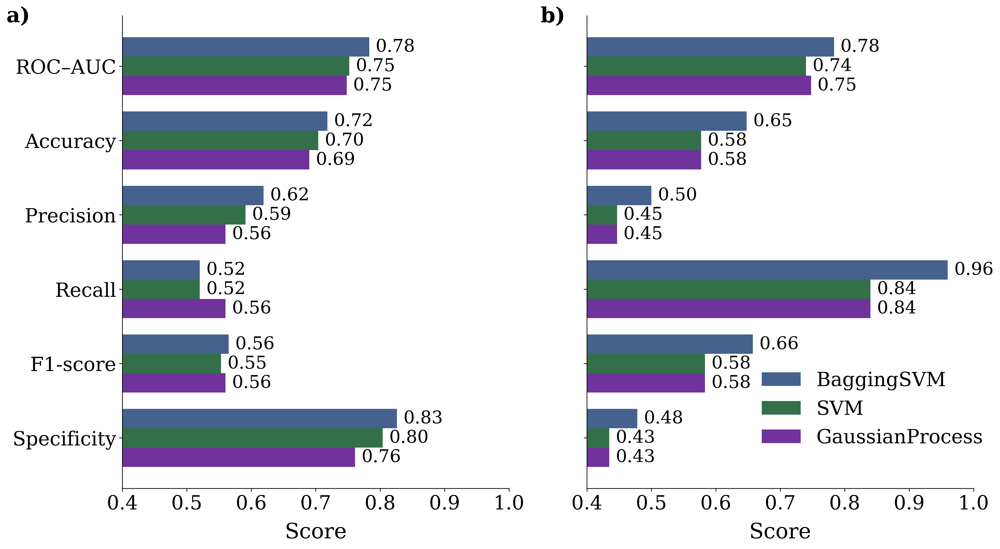

,thr_used,Spec,F1,Recall,Precision,ACC,AUC
Model,,,,,,,
BaggingSVM,0.270,0.478,0.658,0.96,0.500,0.648,0.783
SVM,0.230,0.435,0.583,0.84,0.447,0.577,0.740
GaussianProcess,0.235,0.435,0.583,0.84,0.447,0.577,0.748


In [ ]:
# -------------------------
# FORCE "BEFORE" values to match your Fig. 5 (fixed numbers)
# -------------------------
models_to_plot = ["BaggingSVM", "SVM", "GaussianProcess"]

before_override = pd.DataFrame.from_dict(
    {
        "BaggingSVM":      {"AUC": 0.783, "ACC": 0.718, "Precision": 0.619, "Recall": 0.520, "F1": 0.565, "Spec": 0.826},
        "SVM":             {"AUC": 0.752, "ACC": 0.704, "Precision": 0.591, "Recall": 0.520, "F1": 0.553, "Spec": 0.804},
        "GaussianProcess": {"AUC": 0.748, "ACC": 0.690, "Precision": 0.560, "Recall": 0.560, "F1": 0.560, "Spec": 0.761},
    },
    orient="index"
)

# Make sure these rows exist in after_df (skip if a name mismatch)
models_to_plot = [m for m in models_to_plot if m in after_df.index]

# Replace BEFORE values ONLY for the chosen models
# (Keeps before_df for other models intact if you still need them)
for m in models_to_plot:
    for col in ["AUC", "ACC", "Precision", "Recall", "F1", "Spec"]:
        before_df.loc[m, col] = before_override.loc[m, col]

# -------------------------
# PLOT: BEFORE vs AFTER (includes ROC–AUC, Spec last)
# -------------------------
def lighten_color(color, amount=0.35):
    c = np.array(mcolors.to_rgb(color))
    white = np.array([1, 1, 1])
    return tuple(c + (white - c) * amount)

BASE_COLORS = {
    "BaggingSVM": "#173A72",      # blue
    "SVM": "#004C1C",             # green
    "GaussianProcess": "#4B0082"  # purple
}
MODEL_COLORS = {m: lighten_color(BASE_COLORS[m], amount=0.2) for m in models_to_plot}

# requested order
metrics     = ["Specificity", "F1-score", "Recall", "Precision", "Accuracy", "ROC–AUC"]
metric_keys = ["Spec",        "F1",       "Recall", "Precision", "ACC",      "AUC"]

before_vals = before_df.loc[models_to_plot, metric_keys]
after_vals  = after_df.loc[models_to_plot,  metric_keys]

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 20,
    "axes.labelsize": 24,
    "xtick.labelsize": 22,
    "ytick.labelsize": 22,
})

fig, axes = plt.subplots(1, 2, figsize=(16, 9), dpi=300, sharey=True)

bar_h = 0.26
y_base = np.arange(len(metrics))
center = (len(models_to_plot) - 1) / 2.0

# (a) BEFORE (forced from Fig. 5)
for i, model in enumerate(models_to_plot[::-1]):
    bars = axes[0].barh(
        y_base + (i - center) * bar_h,
        before_vals.loc[model].values,
        height=bar_h,
        label=model,
        color=MODEL_COLORS[model]
    )
    for bar in bars:
        w = bar.get_width()
        axes[0].text(w + 0.01, bar.get_y() + bar.get_height()/2,
                     f"{w:.2f}", va="center", fontsize=20)

axes[0].set_xlim(0.4, 1.0)
axes[0].set_yticks(y_base)
axes[0].set_yticklabels(metrics)
axes[0].set_xlabel("Score", labelpad=10)
axes[0].spines["top"].set_visible(False)
axes[0].spines["right"].set_visible(False)
axes[0].grid(False)
axes[0].text(-0.30, 1.02, "a)", transform=axes[0].transAxes,
             fontsize=24, fontweight="bold", va="top")

# (b) AFTER (computed with tuned threshold)
for i, model in enumerate(models_to_plot[::-1]):
    bars = axes[1].barh(
        y_base + (i - center) * bar_h,
        after_vals.loc[model].values,
        height=bar_h,
        label=model,
        color=MODEL_COLORS[model]
    )
    for bar in bars:
        w = bar.get_width()
        axes[1].text(w + 0.01, bar.get_y() + bar.get_height()/2,
                     f"{w:.2f}", va="center", fontsize=20)

axes[1].set_xlim(0.4, 1.0)
axes[1].set_xlabel("Score", labelpad=10)
axes[1].spines["top"].set_visible(False)
axes[1].spines["right"].set_visible(False)
axes[1].grid(False)
axes[1].text(-0.12, 1.02, "b)", transform=axes[1].transAxes,
             fontsize=24, fontweight="bold", va="top")
axes[0].invert_yaxis()
axes[1].invert_yaxis()

# ---- force legend order ----
handles, labels = axes[1].get_legend_handles_labels()

desired_order = ["BaggingSVM", "SVM", "GaussianProcess"]

ordered = [handles[labels.index(m)] for m in desired_order]

axes[1].legend(
    ordered,
    desired_order,
    frameon=False,
    loc="lower right",
    ncol=1,
    fontsize=22,
    bbox_to_anchor=(1.07, 0.05)
)

plt.tight_layout()
plt.savefig("Top3_threshold_recall.png", dpi=300, bbox_inches="tight")
plt.savefig("Top3_threshold_recall.pdf", bbox_inches="tight")
plt.show()

display(after_df.loc[models_to_plot, ["thr_used"] + metric_keys].round(3))

#Permutation

In [ ]:
# ============================================================
# BLOCK 1: Load data with feature names + permutation importance (10 repeats)
# Output: ONE wide table with grouped columns:
#   SVM_mean, SVM_std, SVM_rank, GP_mean, GP_std, GP_rank, MLP_mean, MLP_std, MLP_rank
# Saved to: permutation_importance_top3_models.xlsx
# ============================================================

import os
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.neural_network import MLPClassifier

# ----------------------------
# 1) LOAD DATA (your exact logic)
# ----------------------------
# Update the path if needed:
xlsx_path = os.path.join("..", "content", "ClassificationV2.xlsx")

df = pd.read_excel(xlsx_path)

mapping_Sex = {'Male': 0, 'Female': 1}
mapping_Irregularity = {'R': 0, 'I': 1}
mapping_Kind = {'L': 0, 'B': 1}
mapping_Location = {'MCA': 0, 'ICA': 1, 'ACA': 2, 'PCA': 3, 'VA': 4, 'BA': 4, 'SCA': 5}
mapping_Stability = {'stable': 0, 'unstable': 1}
mapping_Complexity = {'simple': 0, 'complex': 1}
mapping_Status = {'unruptured': 0, 'ruptured': 1}

df = df.replace({
    'Sex': mapping_Sex,
    'I': mapping_Irregularity,
    'LB': mapping_Kind,
    'Location': mapping_Location,
    'FS': mapping_Stability,
    'FC': mapping_Complexity,
    'Status': mapping_Status
})

# drop ID column (as you did)
if "Vessel ID" in df.columns:
    df = df.drop(labels="Vessel ID", axis=1)

# ----------------------------
# 2) BUILD X, y WITH NAMES
# ----------------------------
if "Status" not in df.columns:
    raise ValueError("Column 'Status' not found after preprocessing. Check the Excel columns.")

feature_names = [c for c in df.columns if c != "Status"]
X = df[feature_names].to_numpy(dtype=np.float64)
y = df["Status"].to_numpy(dtype=int)

# ----------------------------
# 3) MODELS (same family as before; class_weight balanced where it makes sense)
# ----------------------------
models = {
    "SVM": Pipeline([
        ("scaler", StandardScaler()),
        ("clf", SVC(
            kernel="rbf",
            probability=True,
            class_weight="balanced",
            # keep your tuned-ish values if you want; otherwise remove these two lines
            C=2.761699813343848,
            gamma=0.004436687330978612,
            random_state=42
        ))
    ]),
    "GaussianProcess": Pipeline([
        ("scaler", StandardScaler()),
        ("clf", GaussianProcessClassifier(kernel=1.0 * RBF(2.0), random_state=42))
    ]),
    "BaggingSVM": Pipeline([
    ("scaler", StandardScaler()),
    ("clf", BaggingClassifier(
        estimator=SVC(C=80, gamma=0.002, probability=True, kernel="rbf"),
        n_estimators=100, bootstrap=True, max_samples=0.9, max_features=54,
        random_state=42
    ))
]),
}

# ----------------------------
# 4) CV PERMUTATION IMPORTANCE (AUC), 10 repeats
#    We compute fold-level permutation importance on the held-out fold,
#    then aggregate across folds -> mean/std per feature.
# ----------------------------
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

def cv_perm_importance_auc(estimator, X, y, n_repeats=10, seed=42):
    fold_means = []
    rng = np.random.RandomState(seed)

    for fold, (tr, te) in enumerate(skf.split(X, y), start=1):
        Xtr, Xte = X[tr], X[te]
        ytr, yte = y[tr], y[te]

        est = estimator
        est.fit(Xtr, ytr)

        pi = permutation_importance(
            est, Xte, yte,
            scoring="roc_auc",
            n_repeats=n_repeats,
            random_state=rng.randint(0, 10**9),
            n_jobs=-1
        )
        fold_means.append(pi.importances_mean)

    fold_means = np.vstack(fold_means)  # (n_folds, n_features)
    mean_imp = fold_means.mean(axis=0)
    std_imp = fold_means.std(axis=0)

    return mean_imp, std_imp

# ----------------------------
# 5) BUILD ONE WIDE TABLE: for each model -> mean, std, rank
# ----------------------------
wide = pd.DataFrame({"Feature": feature_names})

for model_name, est in models.items():
    mean_imp, std_imp = cv_perm_importance_auc(est, X, y, n_repeats=10, seed=42)

    # ranks: 1 = most important (largest mean)
    order = np.argsort(-mean_imp)
    ranks = np.empty_like(order)
    ranks[order] = np.arange(1, len(feature_names) + 1)

    wide[(model_name, "Mean")] = mean_imp
    wide[(model_name, "SD")]   = std_imp
    wide[(model_name, "Rank")] = ranks

# MultiIndex columns for nice grouped header in Excel
wide.columns = pd.MultiIndex.from_tuples(
    [("Feature", "")] + [(a, b) for a, b in wide.columns[1:]],
    names=["Model", "Metric"]
)

# Optional: sort rows by SVM importance (or change to Avg rank)
wide_sorted = wide.copy()
wide_sorted = wide_sorted.sort_values(by=("SVM", "Mean"), ascending=False)

# Save to Excel
# out_xlsx = "permutation_importance_top3_models.xlsx"
# with pd.ExcelWriter(out_xlsx, engine="openpyxl") as writer:
#     wide_sorted.to_excel(writer, sheet_name="PermImp_AllFeatures", index=False)

# print(f"Saved: {out_xlsx}")
# display(wide_sorted)

/tmp/ipython-input-371/2069925462.py:37: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace({


In [ ]:
# Flatten MultiIndex columns before saving
wide_sorted_flat = wide_sorted.copy()
wide_sorted_flat.columns = [
    f"{col[0]}_{col[1]}" if col[1] != "" else col[0]
    for col in wide_sorted_flat.columns
]

wide_sorted_flat.to_excel("permutation_importance_top3_models.xlsx",
                          sheet_name="PermImp_AllFeatures",
                          index=False)

print("Saved: permutation_importance_top3_models.xlsx")

Saved: permutation_importance_top3_models.xlsx


Loaded shape: (55, 10)
Columns: ['Feature', 'SVM_Mean', 'SVM_SD', 'SVM_Rank', 'GaussianProcess_Mean', 'GaussianProcess_SD', 'GaussianProcess_Rank', 'BaggingSVM_Mean', 'BaggingSVM_SD', 'BaggingSVM_Rank']
Top SVM features: ['I', 'Location', 'LSAR', 'MDNA', 'ON']
Top GP  features: ['I', 'LSAR', 'Location', 'MDNA', 'ON']
Top BaggingSVM features: ['EI', 'LSAR', 'I', 'Location', 'SR']


/tmp/ipykernel_17671/4129526297.py:116: RuntimeWarning: invalid value encountered in power
  fade_strength = (1.0 - mid_frac) ** fade_gamma


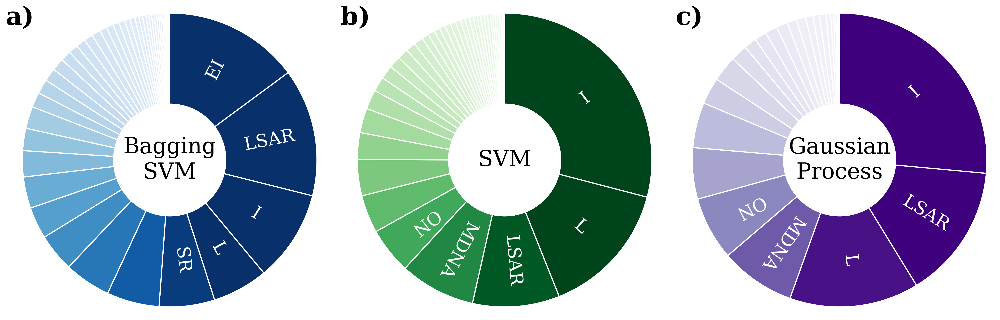

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd


xlsx_path = os.path.join("..", "content", "permutation_importance_top3_models.xlsx")
df_raw = pd.read_excel(xlsx_path)

print("Loaded shape:", df_raw.shape)
print("Columns:", df_raw.columns.tolist())

def get_model_perm_vectors_from_wide(df, model_name, use_rank=True, normalize=True):
    """
    Expects columns:
      Feature,
      {model_name}_Mean, {model_name}_SD, {model_name}_Rank   (Rank optional)
    Returns:
      feat_sorted (list[str]), imp_sorted (np.array[float])
    """
    feat_col = "Feature"
    mean_col = f"{model_name}_Mean"
    rank_col = f"{model_name}_Rank"

    if feat_col not in df.columns:
        raise ValueError(f"'{feat_col}' column not found.")

    if mean_col not in df.columns:
        raise ValueError(
            f"'{mean_col}' column not found for model='{model_name}'. "
            f"Available Mean columns: {[c for c in df.columns if c.endswith('_Mean')]}"
        )

    sub = df[[feat_col, mean_col] + ([rank_col] if rank_col in df.columns else [])].copy()
    sub[mean_col] = pd.to_numeric(sub[mean_col], errors="coerce").fillna(0.0)

    # Sort: by Rank if available & requested; otherwise by Mean desc
    if use_rank and (rank_col in sub.columns):
        sub[rank_col] = pd.to_numeric(sub[rank_col], errors="coerce")
        sub = sub.sort_values(rank_col, ascending=True)
    else:
        sub = sub.sort_values(mean_col, ascending=False)

    feats = sub[feat_col].astype(str).tolist()
    imps  = sub[mean_col].to_numpy(dtype=float)

    # Clip negatives + normalize to sum=1 (common for donut)
    imps = np.clip(imps, 0, None)
    if normalize:
        s = imps.sum()
        imps = imps / s if s > 0 else np.ones_like(imps) / len(imps)

    return feats, imps

# === Create variables expected by your donut code ===
svm_feat_sorted, svm_imp_sorted = get_model_perm_vectors_from_wide(df_raw, "SVM", use_rank=True)
gp_feat_sorted,  gp_imp_sorted  = get_model_perm_vectors_from_wide(df_raw, "GaussianProcess", use_rank=True)
bag_svm_feat_sorted, bag_svm_imp_sorted = get_model_perm_vectors_from_wide(df_raw, "BaggingSVM", use_rank=True)

print("Top SVM features:", svm_feat_sorted[:5])
print("Top GP  features:", gp_feat_sorted[:5])
print("Top BaggingSVM features:", bag_svm_feat_sorted[:5])



def donut_perm_importance_topk_onring(
    ax,
    feat_sorted, imp_sorted,
    model_name="Model",
    panel_label="a)",
    cmap="Blues",
    top_k_labels=5,
    ring_width=0.62,          # ring thickness
    startangle=90,
    label_r=None,             # radius where labels sit (mid-ring by default)
    fontsize=23,
    fontweight="normal",
    text_color="white",
    center_fontsize=28,
    panel_fontsize=32,

    # fading controls (more obvious)
    fade_min=0.08,            # lightest (end)
    fade_max=1.99,            # darkest (start)
    fade_gamma=1.2,           # higher => stronger contrast

    # rotation controls (labels follow slice angle; "vertical" on slice)
    rotation_offset=0,       # add 90° to make it vertical relative to slice direction
    flip_upright=True,        # keep text readable on left half

    # optional rename (e.g., Location -> L)
    rename_map=None,
):
    ax.set_aspect("equal")
    ax.axis("off")

    # --- clip negatives + normalize ---
    vals = np.asarray(imp_sorted, float)
    vals = np.clip(vals, 0, None)
    if vals.sum() == 0:
        vals = np.ones_like(vals)
    vals = vals / vals.sum()

    feat_sorted = list(feat_sorted)

    # --- sort by importance desc (so first k = top k) ---
    order = np.argsort(vals)[::-1]
    vals = vals[order]
    feat_sorted = [feat_sorted[i] for i in order]

    # --- fading by slice mid-angle fraction (0..1): later angle => lighter ---
    cum = np.cumsum(vals)
    prev = np.concatenate(([0.0], cum[:-1]))
    mid_frac = 0.5 * (prev + cum)  # 0..1 around circle (clockwise because counterclock=False)

    fade_strength = (1.0 - mid_frac) ** fade_gamma
    fade_strength = fade_min + (fade_max - fade_min) * fade_strength

    cmap_obj = plt.get_cmap(cmap)
    colors = [cmap_obj(f) for f in fade_strength]

    wedges, _ = ax.pie(
        vals,
        labels=None,
        startangle=startangle,
        counterclock=False,
        colors=colors,
        wedgeprops=dict(width=ring_width, edgecolor="white", linewidth=1.5),
    )

    # panel label
    ax.text(-0.03, 1.0, panel_label, transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight="bold", va="top", ha="left")

    # model name in center (use \n if long)
    ax.text(0, 0, model_name, ha="center", va="center",
            fontsize=center_fontsize, fontweight="normal")

    # label radius in middle of ring by default
    if label_r is None:
        inner_r = 1.0 - ring_width
        label_r = 0.5 * (1.0 + inner_r)

    # label only top-k, ON ring, rotated along slice direction (radial) + 90°
    k = min(top_k_labels, len(wedges))
    rename_map = rename_map or {}

    for i in range(k):
        w = wedges[i]
        ang = 0.5 * (w.theta1 + w.theta2)  # degrees
        ang_rad = np.deg2rad(ang)

        xt = label_r * np.cos(ang_rad)
        yt = label_r * np.sin(ang_rad)

        # label text
        lbl = str(feat_sorted[i])
        lbl = rename_map.get(lbl, lbl)

        # rotation: follow slice angle; +90 makes it "vertical" on the slice
        rot = ang + rotation_offset
        # if flip_upright and (90 < (rot % 360) < 270):
        #     rot += 180

        ax.text(
            xt, yt, lbl,
            ha="center", va="center",
            rotation=rot, rotation_mode="anchor",
            fontsize=fontsize, fontweight=fontweight,
            color=text_color
        )

    ax.set_xlim(-1.05, 1.05)
    ax.set_ylim(-1.05, 1.05)


# -----------------------------
# Example call (single figure a/b/c)
# Requires:
#   svm_feat_sorted, svm_imp_sorted
#   gp_feat_sorted,  gp_imp_sorted
#   mlp_feat_sorted, mlp_imp_sorted
# -----------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 18
})

RENAME = {"Location": "L"}  # your request

fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

donut_perm_importance_topk_onring(
    axes[0], bag_svm_feat_sorted, bag_svm_imp_sorted,
    model_name="Bagging\nSVM", panel_label="a)",
    cmap="Blues",
    # top_k_labels=5,
    # ring_width=0.58,
    # fade_min=0.04, fade_max=0.995, fade_gamma=2.6,
    # rotation_offset=90,
    # fontsize=13,
    rename_map=RENAME
)

donut_perm_importance_topk_onring(
    axes[1], svm_feat_sorted, svm_imp_sorted,
    model_name="SVM", panel_label="b)",
    cmap="Greens",
    # top_k_labels=5,
    # ring_width=0.58,                 # wider ring
    # fade_min=0.04, fade_max=0.995, fade_gamma=2.6,  # stronger fading
    # rotation_offset=90,              # vertical-on-slice
    # fontsize=13,
    rename_map=RENAME
)

donut_perm_importance_topk_onring(
    axes[2], gp_feat_sorted, gp_imp_sorted,
    model_name="Gaussian\nProcess", panel_label="c)",
    cmap="Purples",
    # top_k_labels=5,
    # ring_width=0.58,
    # fade_min=0.04, fade_max=0.995, fade_gamma=2.6,
    # rotation_offset=90,
    # fontsize=13,
    rename_map=RENAME
)


plt.tight_layout()
plt.savefig("perm_importance_donuts.png", dpi=300, bbox_inches="tight")
plt.savefig("perm_importance_donuts.pdf", bbox_inches="tight")
plt.show()

Loaded shape: (55, 10)
Columns: ['Feature', 'SVM_Mean', 'SVM_SD', 'SVM_Rank', 'GaussianProcess_Mean', 'GaussianProcess_SD', 'GaussianProcess_Rank', 'BaggingSVM_Mean', 'BaggingSVM_SD', 'BaggingSVM_Rank']
Top SVM features: ['I', 'Location', 'LSAR', 'MDNA', 'ON']
Top GP features: ['I', 'LSAR', 'Location', 'MDNA', 'ON']
Top BaggingSVM features: ['EI', 'LSAR', 'I', 'Location', 'SR']


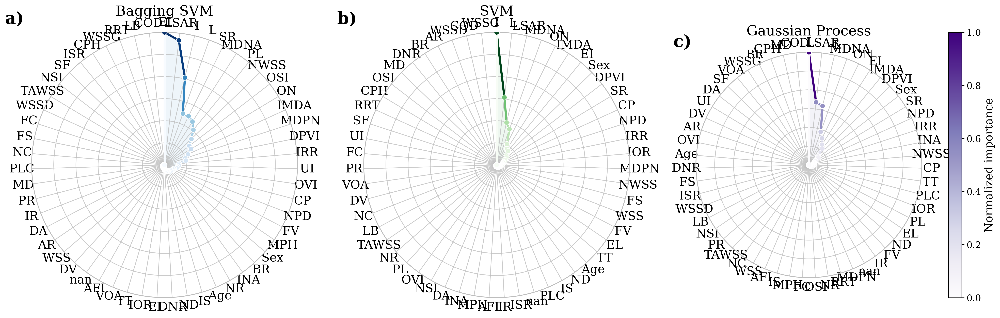

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
import os
import pandas as pd

# =========================================================
# LOAD DATA
# =========================================================
xlsx_path = os.path.join("..", "content", "permutation_importance_top3_models.xlsx")
df_raw = pd.read_excel(xlsx_path)

print("Loaded shape:", df_raw.shape)
print("Columns:", df_raw.columns.tolist())

def get_model_perm_vectors_from_wide(df, model_name, use_rank=True, normalize=False):
    """
    Expects columns:
      Feature,
      {model_name}_Mean, {model_name}_SD, {model_name}_Rank   (Rank optional)

    Returns:
      feat_sorted (list[str]), imp_sorted (np.array[float])
    """
    feat_col = "Feature"
    mean_col = f"{model_name}_Mean"
    rank_col = f"{model_name}_Rank"

    if feat_col not in df.columns:
        raise ValueError(f"'{feat_col}' column not found.")

    if mean_col not in df.columns:
        raise ValueError(
            f"'{mean_col}' column not found for model='{model_name}'. "
            f"Available Mean columns: {[c for c in df.columns if c.endswith('_Mean')]}"
        )

    sub = df[[feat_col, mean_col] + ([rank_col] if rank_col in df.columns else [])].copy()
    sub[mean_col] = pd.to_numeric(sub[mean_col], errors="coerce").fillna(0.0)

    # sort by rank if available, otherwise by mean descending
    if use_rank and (rank_col in sub.columns):
        sub[rank_col] = pd.to_numeric(sub[rank_col], errors="coerce")
        sub = sub.sort_values(rank_col, ascending=True)
    else:
        sub = sub.sort_values(mean_col, ascending=False)

    feats = sub[feat_col].astype(str).tolist()
    imps = sub[mean_col].to_numpy(dtype=float)

    # clip negatives
    imps = np.clip(imps, 0, None)

    # optional sum normalization
    if normalize:
        s = imps.sum()
        imps = imps / s if s > 0 else np.ones_like(imps) / len(imps)

    return feats, imps

# =========================================================
# GET MODEL DATA
# =========================================================
svm_feat_sorted, svm_imp_sorted = get_model_perm_vectors_from_wide(df_raw, "SVM", use_rank=True, normalize=False)
gp_feat_sorted, gp_imp_sorted = get_model_perm_vectors_from_wide(df_raw, "GaussianProcess", use_rank=True, normalize=False)
bag_svm_feat_sorted, bag_svm_imp_sorted = get_model_perm_vectors_from_wide(df_raw, "BaggingSVM", use_rank=True, normalize=False)

print("Top SVM features:", svm_feat_sorted[:5])
print("Top GP features:", gp_feat_sorted[:5])
print("Top BaggingSVM features:", bag_svm_feat_sorted[:5])

# =========================================================
# RADAR PLOT FUNCTION
# =========================================================
def radar_perm_importance_colored(
    ax,
    feat_sorted,
    imp_sorted,
    panel_label="a)",
    model_title=None,
    cmap="viridis",
    rename_map=None,
    fill_alpha=0.10,
    line_width=3.0,
    point_size=55,
    n_rings=6,
    show_colorbar=False,
    cbar_label="Normalized importance"
):
    """
    Radar chart with:
      - min-max normalization to [0, 1]
      - no radial tick labels
      - no center model name
      - values represented by color instead of text labels
    """
    rename_map = rename_map or {}

    feats = [rename_map.get(str(f), str(f)) for f in feat_sorted]
    vals = np.asarray(imp_sorted, dtype=float)
    vals = np.clip(vals, 0, None)

    # ---- min-max normalization to [0, 1]
    vmin = vals.min()
    vmax = vals.max()
    if np.isclose(vmax, vmin):
        vals_norm = np.zeros_like(vals)
    else:
        vals_norm = (vals - vmin) / (vmax - vmin)

    N = len(feats)
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False)

    # close the polygon
    angles_closed = np.r_[angles, angles[0]]
    vals_closed = np.r_[vals_norm, vals_norm[0]]

    # ---- polar formatting
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_ylim(0, 1.0)

    # category labels
    ax.set_xticks(angles)
    ax.set_xticklabels(feats, fontsize=17)

    # remove radial numbers completely
    ax.set_yticks(np.linspace(0, 1.0, n_rings + 1)[1:])
    ax.set_yticklabels([])

    # clean grid / spine
    ax.grid(color="#bdbdbd", linewidth=1.0, alpha=0.8)
    ax.spines["polar"].set_color("#bdbdbd")
    ax.spines["polar"].set_linewidth(1.2)

    # ---- fill polygon lightly
    ax.fill(angles_closed, vals_closed, color=plt.get_cmap(cmap)(0.55), alpha=fill_alpha, zorder=1)

    # ---- colored line segments
    points = np.array([angles_closed, vals_closed]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    norm = mpl.colors.Normalize(vmin=0.0, vmax=1.0)
    lc = LineCollection(segments, cmap=cmap, norm=norm, linewidth=line_width)
    lc.set_array(vals_norm)
    lc.set_capstyle("round")
    ax.add_collection(lc)

    # ---- colored points
    sc = ax.scatter(
        angles, vals_norm,
        c=vals_norm, cmap=cmap, norm=norm,
        s=point_size, zorder=3,
        edgecolors="white", linewidths=0.9
    )

    # ---- panel label
    ax.text(-0.10, 1.08, panel_label, transform=ax.transAxes,
            fontsize=24, fontweight="bold", ha="left", va="top")

    # ---- optional small title above plot (not in center)
    if model_title is not None:
        ax.set_title(model_title, fontsize=20, pad=24)

    # ---- optional colorbar
    if show_colorbar:
        cbar = plt.colorbar(sc, ax=ax, pad=0.10, fraction=0.05)
        cbar.set_label(cbar_label, fontsize=16)
        cbar.ax.tick_params(labelsize=13)

# =========================================================
# STYLE
# =========================================================
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 16
})

RENAME = {"Location": "L"}

# =========================================================
# FIGURE
# =========================================================
fig, axes = plt.subplots(
    1, 3,
    figsize=(20, 7),
    dpi=300,
    subplot_kw=dict(polar=True)
)

radar_perm_importance_colored(
    axes[0],
    bag_svm_feat_sorted, bag_svm_imp_sorted,
    panel_label="a)",
    model_title="Bagging SVM",
    cmap="Blues",
    rename_map=RENAME,
    show_colorbar=False
)

radar_perm_importance_colored(
    axes[1],
    svm_feat_sorted, svm_imp_sorted,
    panel_label="b)",
    model_title="SVM",
    cmap="Greens",
    rename_map=RENAME,
    show_colorbar=False
)

radar_perm_importance_colored(
    axes[2],
    gp_feat_sorted, gp_imp_sorted,
    panel_label="c)",
    model_title="Gaussian Process",
    cmap="Purples",
    rename_map=RENAME,
    show_colorbar=True   # show one colorbar only on the last panel
)

plt.tight_layout()
plt.savefig("perm_importance_radar_colored.png", dpi=300, bbox_inches="tight")
plt.savefig("perm_importance_radar_colored.pdf", bbox_inches="tight")
plt.show()

Loaded shape: (55, 8)
Columns: ['Unnamed: 0', 'MLP', 'Unnamed: 2', 'Unnamed: 3', 'RF', 'Unnamed: 5', 'Unnamed: 6', 'Bagging SVM']
Top Morphology features: ['DNR', 'IMDA', 'IOR', 'LB', 'VOA']
Top Hemodynamics features: ['OSI', 'NPD', 'FS', 'OVI', 'PLC']
Top Combined features: ['EI', 'LSAR', 'I', 'Location', 'SR']


/tmp/ipykernel_17671/586798297.py:106: RuntimeWarning: invalid value encountered in power
  fade_strength = (1.0 - mid_frac) ** fade_gamma


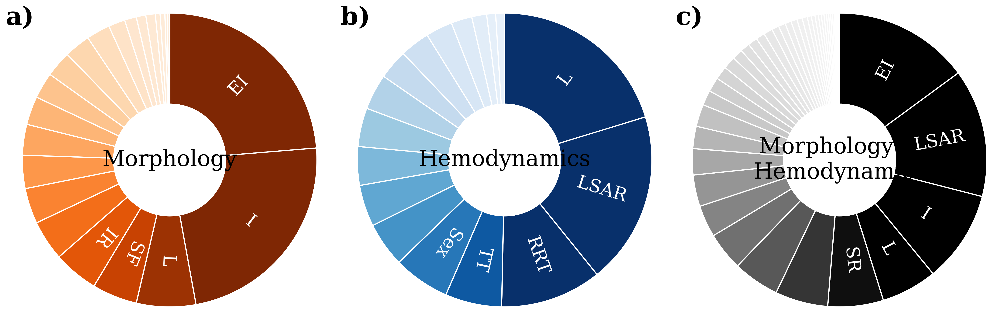

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd


xlsx_path = os.path.join("..", "content","Feature Importance Comparison.xlsx")
df_raw = pd.read_excel(xlsx_path)

print("Loaded shape:", df_raw.shape)
print("Columns:", df_raw.columns.tolist())

def get_feature_vectors_from_two_cols(df, feat_col, val_col, normalize=True):
    """
    Expects two columns:
      feat_col, val_col
    Returns:
      feat_sorted (list[str]), imp_sorted (np.array[float])
    """
    sub = df[[feat_col, val_col]].copy()
    sub.columns = ["Feature", "Importance"]

    sub = sub.dropna(subset=["Feature"])
    sub["Importance"] = pd.to_numeric(sub["Importance"], errors="coerce").fillna(0.0)

    feats = sub["Feature"].astype(str).tolist()
    imps  = sub["Importance"].to_numpy(dtype=float)

    # Clip negatives + normalize to sum=1 (same idea as your original code)
    imps = np.clip(imps, 0, None)
    if normalize:
        s = imps.sum()
        imps = imps / s if s > 0 else np.ones_like(imps) / len(imps)

    return feats, imps

# === Load data from the new file ===
# Adjust these column names only if your file prints different names
morph_feat_sorted, morph_imp_sorted = get_feature_vectors_from_two_cols(
    df_raw, "Unnamed: 0", "MLP", normalize=True
)

hemo_feat_sorted, hemo_imp_sorted = get_feature_vectors_from_two_cols(
    df_raw, "Unnamed: 3", "RF", normalize=True
)

comb_feat_sorted, comb_imp_sorted = get_feature_vectors_from_two_cols(
    df_raw, "Unnamed: 6", "Bagging SVM", normalize=True
)

print("Top Morphology features:", morph_feat_sorted[:5])
print("Top Hemodynamics features:", hemo_feat_sorted[:5])
print("Top Combined features:", comb_feat_sorted[:5])


def donut_perm_importance_topk_onring(
    ax,
    feat_sorted, imp_sorted,
    model_name="Model",
    panel_label="a)",
    cmap="Blues",
    top_k_labels=5,
    ring_width=0.62,          # ring thickness
    startangle=90,
    label_r=None,             # radius where labels sit (mid-ring by default)
    fontsize=23,
    fontweight="normal",
    text_color="white",
    center_fontsize=28,
    panel_fontsize=32,

    # fading controls (more obvious)
    fade_min=0.08,            # lightest (end)
    fade_max=1.99,            # darkest (start)
    fade_gamma=1.2,           # higher => stronger contrast

    # rotation controls (labels follow slice angle; "vertical" on slice)
    rotation_offset=0,       # add 90° to make it vertical relative to slice direction
    flip_upright=True,        # keep text readable on left half

    # optional rename (e.g., Location -> L)
    rename_map=None,
):
    ax.set_aspect("equal")
    ax.axis("off")

    # --- clip negatives + normalize ---
    vals = np.asarray(imp_sorted, float)
    vals = np.clip(vals, 0, None)
    if vals.sum() == 0:
        vals = np.ones_like(vals)
    vals = vals / vals.sum()

    feat_sorted = list(feat_sorted)

    # --- sort by importance desc (so first k = top k) ---
    order = np.argsort(vals)[::-1]
    vals = vals[order]
    feat_sorted = [feat_sorted[i] for i in order]

    # --- fading by slice mid-angle fraction (0..1): later angle => lighter ---
    cum = np.cumsum(vals)
    prev = np.concatenate(([0.0], cum[:-1]))
    mid_frac = 0.5 * (prev + cum)  # 0..1 around circle (clockwise because counterclock=False)

    fade_strength = (1.0 - mid_frac) ** fade_gamma
    fade_strength = fade_min + (fade_max - fade_min) * fade_strength

    cmap_obj = plt.get_cmap(cmap)
    colors = [cmap_obj(f) for f in fade_strength]

    wedges, _ = ax.pie(
        vals,
        labels=None,
        startangle=startangle,
        counterclock=False,
        colors=colors,
        wedgeprops=dict(width=ring_width, edgecolor="white", linewidth=1.5),
    )

    # panel label
    ax.text(-0.03, 1.0, panel_label, transform=ax.transAxes,
            fontsize=panel_fontsize, fontweight="bold", va="top", ha="left")

    # center text
    ax.text(0, 0, model_name, ha="center", va="center",
            fontsize=center_fontsize, fontweight="normal")

    # label radius in middle of ring by default
    if label_r is None:
        inner_r = 1.0 - ring_width
        label_r = 0.5 * (1.0 + inner_r)

    # label only top-k, ON ring, rotated along slice direction (radial) + 90°
    k = min(top_k_labels, len(wedges))
    rename_map = rename_map or {}

    for i in range(k):
        w = wedges[i]
        ang = 0.5 * (w.theta1 + w.theta2)  # degrees
        ang_rad = np.deg2rad(ang)

        xt = label_r * np.cos(ang_rad)
        yt = label_r * np.sin(ang_rad)

        # label text
        lbl = str(feat_sorted[i])
        lbl = rename_map.get(lbl, lbl)

        rot = ang + rotation_offset

        ax.text(
            xt, yt, lbl,
            ha="center", va="center",
            rotation=rot, rotation_mode="anchor",
            fontsize=fontsize, fontweight=fontweight,
            color=text_color
        )

    ax.set_xlim(-1.05, 1.05)
    ax.set_ylim(-1.05, 1.05)


# -----------------------------
# Plot
# -----------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 18
})

RENAME = {"Location": "L"}

fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

donut_perm_importance_topk_onring(
    axes[0], morph_feat_sorted, morph_imp_sorted,
    model_name="Morphology", panel_label="a)",
    cmap="Oranges",
    rename_map=RENAME
)

donut_perm_importance_topk_onring(
    axes[1], hemo_feat_sorted, hemo_imp_sorted,
    model_name="Hemodynamics", panel_label="b)",
    cmap="Blues",
    rename_map=RENAME
)

donut_perm_importance_topk_onring(
    axes[2], comb_feat_sorted, comb_imp_sorted,
    model_name="Morphology &\nHemodynamics", panel_label="c)",
    cmap="Greys",
    rename_map=RENAME
)

plt.tight_layout()
plt.savefig("feature_importance_comparison_donuts.png", dpi=300, bbox_inches="tight")
plt.savefig("feature_importance_comparison_donuts.pdf", bbox_inches="tight")
plt.show()

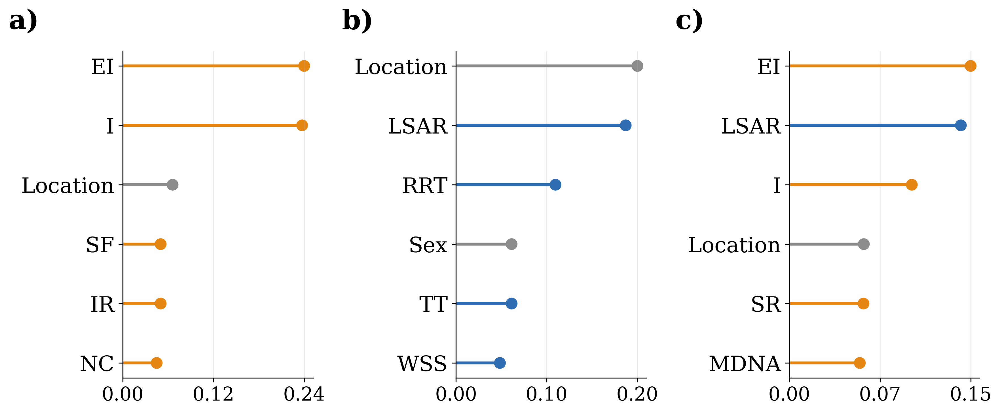

In [ ]:
#Use results from different papers

fig, axes = plt.subplots(1, 3, figsize=(13, 5), dpi=300, sharex=False)

panel_labels = ["a)", "b)", "c)"]

for ax, data, panel in zip(
    axes,
    [morph_top, hemo_top, comb_top],
    panel_labels
):
    y = np.arange(len(data))
    ax.hlines(y, 0, data["Importance"], color=data["Color"], linewidth=2.5)
    ax.scatter(data["Importance"], y, color=data["Color"], s=80)

    ax.set_yticks(y)
    ax.set_yticks(y)
    ax.set_yticklabels(data["Feature"])
    ax.tick_params(axis="y", labelsize=18) # bigger y labels

    # === X axis settings ===
    max_val = data["Importance"].max()
    ax.set_xlim(0, max_val * 1.05)  # ensure 0 aligns with vertical axis

    # only 3 ticks including zero
    xticks = np.linspace(0, max_val, 3)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{x:.2f}" for x in xticks], fontsize=16)

    ax.grid(axis="x", alpha=0.25)

    # remove top and right spines
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # make left spine exactly the zero line
    ax.spines["left"].set_position(("data", 0))

    # panel label
    ax.text(
        -0.6, 1.05, panel,
        transform=ax.transAxes,
        ha="left", va="bottom",
        fontsize=23, fontweight="bold"
    )

plt.subplots_adjust(wspace=0.75)
plt.savefig("feature_importance_comparison.png", dpi=300, bbox_inches="tight")
plt.savefig("feature_importance_comparison.pdf", bbox_inches="tight")
plt.show()

/tmp/ipykernel_30347/1895216943.py:65: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace({


Clinical columns: ['Location', 'Sex', 'Age']
Number of morphology columns: 35
Number of hemodynamic columns: 17
Label column: Status

Scenario: Morphology-only
Number of features: 38
Train90 shape: (637, 38) Test10 shape: (71, 38)
Train class counts: [409 228]
Test class counts: [46 25]

Scenario: Hemodynamic-only
Number of features: 20
Train90 shape: (637, 20) Test10 shape: (71, 20)
Train class counts: [409 228]
Test class counts: [46 25]

Scenario: Combined
Number of features: 55
Train90 shape: (637, 55) Test10 shape: (71, 55)
Train class counts: [409 228]
Test class counts: [46 25]

=== 5-fold CV on TRAIN90: Bagging SVM only ===


,Scenario,Features,AUC,ACC,Precision,Recall,F1,Specificity
0,Morphology-only,38,0.798 ± 0.048,0.746 ± 0.038,0.701 ± 0.068,0.509 ± 0.083,0.587 ± 0.070,0.878 ± 0.036
1,Hemodynamic-only,20,0.742 ± 0.038,0.706 ± 0.014,0.699 ± 0.070,0.329 ± 0.044,0.443 ± 0.036,0.917 ± 0.031
2,Combined,55,0.808 ± 0.036,0.754 ± 0.026,0.742 ± 0.037,0.479 ± 0.086,0.578 ± 0.063,0.907 ± 0.020



=== Held-out TEST10: Bagging SVM only ===


,Scenario,Features,AUC,ACC,Precision,Recall,F1,Specificity
0,Combined,55,0.775,0.704,0.600,0.48,0.533,0.826
1,Morphology-only,38,0.760,0.718,0.632,0.48,0.545,0.848
2,Hemodynamic-only,20,0.711,0.648,0.500,0.32,0.390,0.826



Saved: bagging_svm_scenario_performance.xlsx
Saved: bagging_svm_scenario_permutation_importance.xlsx


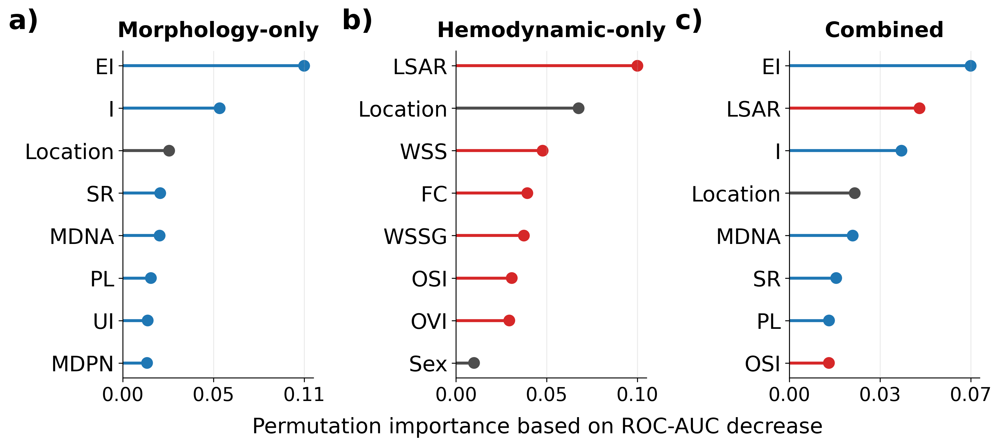

Saved: bagging_svm_feature_importance_scenario_comparison.png
Saved: bagging_svm_feature_importance_scenario_comparison.pdf


In [ ]:
# ============================================================
# BAGGING SVM SCENARIO COMPARISON
# Morphology-only vs Hemodynamic-only vs Combined
#
# Scenario definitions after dropping "Vessel ID":
#   Clinical columns: first 3 columns
#   Morphology columns: next 35 columns
#   Hemodynamic columns: next 17 columns
#   Label column: last column, "Status"
#
# Outputs:
#   1) 5-fold CV performance on TRAIN90
#   2) Held-out TEST10 performance
#   3) Permutation importance table for all scenarios
#   4) Three-panel feature-importance figure
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import (
    roc_auc_score, accuracy_score, precision_score,
    recall_score, f1_score, confusion_matrix
)
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier
from sklearn.base import clone
from sklearn.inspection import permutation_importance
from sklearn.utils.class_weight import compute_class_weight

# ----------------------------
# CONFIG
# ----------------------------
xlsx_path = os.path.join("..", "content", "ClassificationV2.xlsx")
# If you are running locally and the file is in the same folder, use:
# xlsx_path = "ClassificationV2.xlsx"

RANDOM_STATE_SPLIT = 8
CV_FOLDS = 5
THR = 0.5
N_REPEATS_PI = 10
TOP_N = 8   # change this if you want more or fewer features in each panel

# ----------------------------
# 1) LOAD AND PREPROCESS DATA
# ----------------------------
df = pd.read_excel(xlsx_path)

mapping_Sex = {"Male": 0, "Female": 1}
mapping_Irregularity = {"R": 0, "I": 1}
mapping_Kind = {"L": 0, "B": 1}
mapping_Location = {
    "MCA": 0, "ICA": 1, "ACA": 2, "PCA": 3,
    "VA": 4, "BA": 4, "SCA": 5
}
mapping_Stability = {"stable": 0, "unstable": 1}
mapping_Complexity = {"simple": 0, "complex": 1}
mapping_Status = {"unruptured": 0, "ruptured": 1}

df = df.replace({
    "Sex": mapping_Sex,
    "I": mapping_Irregularity,
    "LB": mapping_Kind,
    "Location": mapping_Location,
    "FS": mapping_Stability,
    "FC": mapping_Complexity,
    "Status": mapping_Status
})

if "Vessel ID" in df.columns:
    df = df.drop(labels="Vessel ID", axis=1)

if "Status" not in df.columns:
    raise ValueError("Column 'Status' was not found. Please check the Excel file.")

# Make sure all remaining values are numeric
df = df.apply(pd.to_numeric)

# ----------------------------
# 2) DEFINE FEATURE GROUPS
# ----------------------------
all_columns = list(df.columns)

clinical_cols = all_columns[0:3]
morphology_cols = all_columns[3:38]      # next 35 columns
hemodynamic_cols = all_columns[38:55]    # next 17 columns
label_col = all_columns[-1]

print("Clinical columns:", clinical_cols)
print("Number of morphology columns:", len(morphology_cols))
print("Number of hemodynamic columns:", len(hemodynamic_cols))
print("Label column:", label_col)

if label_col != "Status":
    raise ValueError(
        f"The last column is expected to be 'Status', but found '{label_col}'. "
        "Please check the dataset column order."
    )

scenarios = {
    "Morphology-only": clinical_cols + morphology_cols,
    "Hemodynamic-only": clinical_cols + hemodynamic_cols,
    "Combined": clinical_cols + morphology_cols + hemodynamic_cols
}

y = df["Status"].to_numpy(dtype=int)

# ----------------------------
# 3) HELPER FUNCTIONS
# ----------------------------
def specificity(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    return tn / (tn + fp) if (tn + fp) else 0.0

def metrics_from_prob(y_true, prob, thr=0.5):
    pred = (prob >= thr).astype(int)
    return {
        "AUC": roc_auc_score(y_true, prob),
        "ACC": accuracy_score(y_true, pred),
        "Precision": precision_score(y_true, pred, zero_division=0),
        "Recall": recall_score(y_true, pred, zero_division=0),
        "F1": f1_score(y_true, pred, zero_division=0),
        "Specificity": specificity(y_true, pred),
    }

def get_probabilities(estimator, X_eval):
    if hasattr(estimator, "predict_proba"):
        return estimator.predict_proba(X_eval)[:, 1]
    if hasattr(estimator, "decision_function"):
        s = estimator.decision_function(X_eval)
        return (s - s.min()) / (s.max() - s.min() + 1e-12)
    return estimator.predict(X_eval).astype(float)

def make_sample_weight_balanced(y_local):
    y_local = np.asarray(y_local).astype(int).ravel()
    n = len(y_local)
    n0 = np.sum(y_local == 0)
    n1 = np.sum(y_local == 1)
    w0 = n / (2 * n0) if n0 else 1.0
    w1 = n / (2 * n1) if n1 else 1.0
    return np.where(y_local == 0, w0, w1).astype(float)

def make_bagging_svm(n_features):
    """
    Same Bagging SVM setup as your original code.
    max_features is adjusted only when the scenario has fewer than 54 features.
    """
    return Pipeline([
        ("scaler", StandardScaler()),
        ("clf", BaggingClassifier(
            estimator=SVC(
                C=80,
                gamma=0.002,
                probability=True,
                kernel="rbf"
            ),
            n_estimators=100,
            bootstrap=True,
            max_samples=0.9,
            max_features=min(54, n_features),
            random_state=42
        ))
    ])

# ----------------------------
# 4) TRAIN/EVALUATE BAGGING SVM FOR EACH SCENARIO
# ----------------------------
cv_rows = []
test_rows = []
fitted_models = {}
split_data = {}

for scenario_name, feature_cols in scenarios.items():

    print("\n" + "=" * 70)
    print(f"Scenario: {scenario_name}")
    print(f"Number of features: {len(feature_cols)}")
    print("=" * 70)

    X = df[feature_cols].to_numpy(dtype=np.float64)

    X_train90, X_test10, y_train90, y_test10 = train_test_split(
        X,
        y,
        test_size=0.10,
        random_state=RANDOM_STATE_SPLIT,
        stratify=y
    )

    print("Train90 shape:", X_train90.shape, "Test10 shape:", X_test10.shape)
    print("Train class counts:", np.bincount(y_train90))
    print("Test class counts:", np.bincount(y_test10))

    split_data[scenario_name] = {
        "feature_cols": feature_cols,
        "X_train90": X_train90,
        "X_test10": X_test10,
        "y_train90": y_train90,
        "y_test10": y_test10
    }

    # ----------------------------
    # 5-fold CV on TRAIN90 only
    # ----------------------------
    skf = StratifiedKFold(
        n_splits=CV_FOLDS,
        shuffle=True,
        random_state=42
    )

    fold_metrics = []

    for fold, (tr_idx, va_idx) in enumerate(skf.split(X_train90, y_train90), start=1):

        Xtr, Xva = X_train90[tr_idx], X_train90[va_idx]
        ytr, yva = y_train90[tr_idx], y_train90[va_idx]

        est = make_bagging_svm(n_features=Xtr.shape[1])
        sw_tr = make_sample_weight_balanced(ytr)

        est.fit(Xtr, ytr, clf__sample_weight=sw_tr)

        prob = get_probabilities(est, Xva)
        m = metrics_from_prob(yva, prob, thr=THR)
        fold_metrics.append(m)

    df_cv = pd.DataFrame(fold_metrics)

    cv_rows.append({
        "Scenario": scenario_name,
        "Features": len(feature_cols),
        "AUC": f"{df_cv['AUC'].mean():.3f} ± {df_cv['AUC'].std(ddof=0):.3f}",
        "ACC": f"{df_cv['ACC'].mean():.3f} ± {df_cv['ACC'].std(ddof=0):.3f}",
        "Precision": f"{df_cv['Precision'].mean():.3f} ± {df_cv['Precision'].std(ddof=0):.3f}",
        "Recall": f"{df_cv['Recall'].mean():.3f} ± {df_cv['Recall'].std(ddof=0):.3f}",
        "F1": f"{df_cv['F1'].mean():.3f} ± {df_cv['F1'].std(ddof=0):.3f}",
        "Specificity": f"{df_cv['Specificity'].mean():.3f} ± {df_cv['Specificity'].std(ddof=0):.3f}",
    })

    # ----------------------------
    # Final fit on TRAIN90, evaluate once on TEST10
    # ----------------------------
    final_est = make_bagging_svm(n_features=X_train90.shape[1])
    sw_train90 = make_sample_weight_balanced(y_train90)

    final_est.fit(X_train90, y_train90, clf__sample_weight=sw_train90)

    prob_test = get_probabilities(final_est, X_test10)
    test_metrics = metrics_from_prob(y_test10, prob_test, thr=THR)

    test_metrics["Scenario"] = scenario_name
    test_metrics["Features"] = len(feature_cols)
    test_rows.append(test_metrics)

    fitted_models[scenario_name] = final_est

# ----------------------------
# 5) PERFORMANCE TABLES
# ----------------------------
cv_table = pd.DataFrame(cv_rows)
test_table = pd.DataFrame(test_rows)

test_table = test_table[
    ["Scenario", "Features", "AUC", "ACC", "Precision", "Recall", "F1", "Specificity"]
].sort_values("AUC", ascending=False).reset_index(drop=True)

print("\n=== 5-fold CV on TRAIN90: Bagging SVM only ===")
display(cv_table)

print("\n=== Held-out TEST10: Bagging SVM only ===")
display(test_table.round(3))

# Save performance tables
with pd.ExcelWriter("bagging_svm_scenario_performance.xlsx", engine="openpyxl") as writer:
    cv_table.to_excel(writer, sheet_name="CV_TRAIN90", index=False)
    test_table.round(4).to_excel(writer, sheet_name="TEST10", index=False)

print("\nSaved: bagging_svm_scenario_performance.xlsx")

# ----------------------------
# 6) CV PERMUTATION IMPORTANCE FOR EACH SCENARIO
# ----------------------------
def cv_perm_importance_auc_bagging_svm(X, y, feature_cols, n_repeats=10, seed=42):
    """
    Computes fold-level permutation importance on held-out CV folds.
    Aggregates mean and SD across folds.
    Uses Bagging SVM with balanced sample weights.
    """
    skf = StratifiedKFold(
        n_splits=CV_FOLDS,
        shuffle=True,
        random_state=42
    )

    fold_means = []

    rng = np.random.RandomState(seed)

    for fold, (tr_idx, te_idx) in enumerate(skf.split(X, y), start=1):

        Xtr, Xte = X[tr_idx], X[te_idx]
        ytr, yte = y[tr_idx], y[te_idx]

        est = make_bagging_svm(n_features=Xtr.shape[1])
        sw_tr = make_sample_weight_balanced(ytr)

        est.fit(Xtr, ytr, clf__sample_weight=sw_tr)

        pi = permutation_importance(
            est,
            Xte,
            yte,
            scoring="roc_auc",
            n_repeats=n_repeats,
            random_state=rng.randint(0, 10**9),
            n_jobs=-1
        )

        fold_means.append(pi.importances_mean)

    fold_means = np.vstack(fold_means)

    mean_imp = fold_means.mean(axis=0)
    std_imp = fold_means.std(axis=0)

    out = pd.DataFrame({
        "Feature": feature_cols,
        "Importance_Mean": mean_imp,
        "Importance_SD": std_imp
    })

    out["Rank"] = out["Importance_Mean"].rank(
        method="min",
        ascending=False
    ).astype(int)

    out = out.sort_values("Importance_Mean", ascending=False).reset_index(drop=True)

    return out

perm_tables = {}

for scenario_name, feature_cols in scenarios.items():
    X = df[feature_cols].to_numpy(dtype=np.float64)

    perm_tables[scenario_name] = cv_perm_importance_auc_bagging_svm(
        X=X,
        y=y,
        feature_cols=feature_cols,
        n_repeats=N_REPEATS_PI,
        seed=42
    )

# Save permutation importance tables
with pd.ExcelWriter("bagging_svm_scenario_permutation_importance.xlsx", engine="openpyxl") as writer:
    for scenario_name, tab in perm_tables.items():
        sheet_name = scenario_name.replace("-", "_")[:31]
        tab.to_excel(writer, sheet_name=sheet_name, index=False)

print("Saved: bagging_svm_scenario_permutation_importance.xlsx")

# ----------------------------
# 7) PREPARE TOP FEATURES FOR FIGURE
# ----------------------------
def feature_group_color(feature):
    if feature in clinical_cols:
        return "#4D4D4D"   # clinical
    elif feature in morphology_cols:
        return "#1F77B4"   # morphology
    elif feature in hemodynamic_cols:
        return "#D62728"   # hemodynamic
    else:
        return "#7F7F7F"

plot_data = {}

for scenario_name, tab in perm_tables.items():
    top = tab.head(TOP_N).copy()

    # Sort ascending so the largest value appears at the top of the horizontal plot
    top = top.sort_values("Importance_Mean", ascending=True).reset_index(drop=True)

    top["Color"] = top["Feature"].apply(feature_group_color)
    plot_data[scenario_name] = top

# ----------------------------
# 8) THREE-PANEL FEATURE IMPORTANCE FIGURE
# ----------------------------
fig, axes = plt.subplots(
    1, 3,
    figsize=(13, 5),
    dpi=300,
    sharex=False
)

panel_labels = ["a)", "b)", "c)"]
scenario_order = ["Morphology-only", "Hemodynamic-only", "Combined"]

for ax, scenario_name, panel in zip(axes, scenario_order, panel_labels):

    data = plot_data[scenario_name]
    y_pos = np.arange(len(data))

    ax.hlines(
        y_pos,
        0,
        data["Importance_Mean"],
        color=data["Color"],
        linewidth=2.5
    )

    ax.scatter(
        data["Importance_Mean"],
        y_pos,
        color=data["Color"],
        s=80
    )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(data["Feature"])
    ax.tick_params(axis="y", labelsize=18)

    max_val = data["Importance_Mean"].max()

    # Protect against zero or negative max importance values
    if max_val <= 0:
        max_val = 0.01

    ax.set_xlim(0, max_val * 1.05)

    xticks = np.linspace(0, max_val, 3)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{x:.2f}" for x in xticks], fontsize=16)

    ax.grid(axis="x", alpha=0.25)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Make left spine exactly the zero line
    ax.spines["left"].set_position(("data", 0))

    # Panel label
    ax.text(
        -0.6,
        1.05,
        panel,
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=23,
        fontweight="bold"
    )

    # Optional scenario title
    ax.set_title(
        scenario_name,
        fontsize=18,
        fontweight="bold",
        pad=12
    )

# Optional shared x-axis label
fig.text(
    0.5,
    -0.02,
    "Permutation importance based on ROC-AUC decrease",
    ha="center",
    fontsize=18
)

plt.subplots_adjust(wspace=0.75)

plt.savefig(
    "bagging_svm_feature_importance_scenario_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    "bagging_svm_feature_importance_scenario_comparison.pdf",
    bbox_inches="tight"
)

plt.show()

print("Saved: bagging_svm_feature_importance_scenario_comparison.png")
print("Saved: bagging_svm_feature_importance_scenario_comparison.pdf")

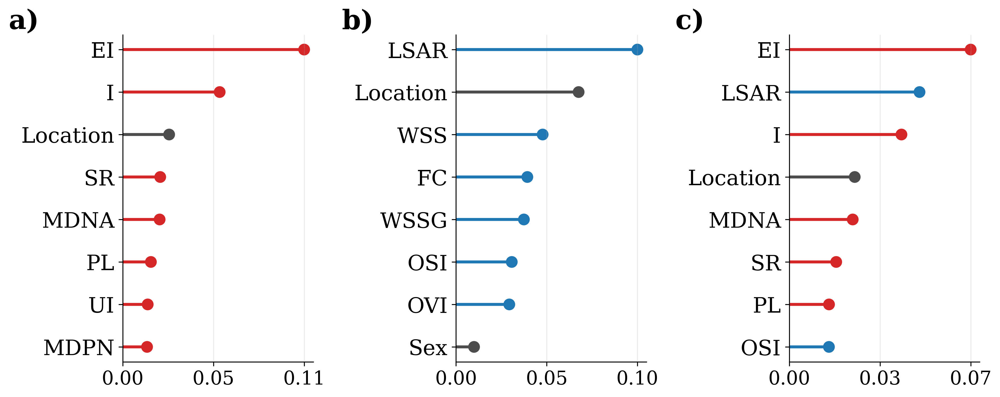

Saved: bagging_svm_feature_importance_scenario_comparison.png
Saved: bagging_svm_feature_importance_scenario_comparison.pdf


In [ ]:
# ----------------------------
# 7) PREPARE TOP FEATURES FOR FIGURE
# ----------------------------
def feature_group_color(feature):
    if feature in clinical_cols:
        return "#4D4D4D"   # clinical
    elif feature in morphology_cols:
        return "#D62728"   # morphology
    elif feature in hemodynamic_cols:
        return "#1F77B4"   # hemodynamic
    else:
        return "#7F7F7F"

plot_data = {}

for scenario_name, tab in perm_tables.items():
    top = tab.head(TOP_N).copy()

    # Sort ascending so the largest value appears at the top of the horizontal plot
    top = top.sort_values("Importance_Mean", ascending=True).reset_index(drop=True)

    top["Color"] = top["Feature"].apply(feature_group_color)
    plot_data[scenario_name] = top

fig, axes = plt.subplots(
    1, 3,
    figsize=(13, 5),
    dpi=300,
    sharex=False
)

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
})

panel_labels = ["a)", "b)", "c)"]
scenario_order = ["Morphology-only", "Hemodynamic-only", "Combined"]

for ax, scenario_name, panel in zip(axes, scenario_order, panel_labels):

    data = plot_data[scenario_name]
    y_pos = np.arange(len(data))

    ax.hlines(
        y_pos,
        0,
        data["Importance_Mean"],
        color=data["Color"],
        linewidth=2.5
    )

    ax.scatter(
        data["Importance_Mean"],
        y_pos,
        color=data["Color"],
        s=80
    )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(data["Feature"])
    ax.tick_params(axis="y", labelsize=18)

    max_val = data["Importance_Mean"].max()

    # Protect against zero or negative max importance values
    if max_val <= 0:
        max_val = 0.01

    ax.set_xlim(0, max_val * 1.05)

    xticks = np.linspace(0, max_val, 3)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{x:.2f}" for x in xticks], fontsize=16)

    ax.grid(axis="x", alpha=0.25)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Make left spine exactly the zero line
    ax.spines["left"].set_position(("data", 0))

    # Panel label
    ax.text(
        -0.6,
        1.0,
        panel,
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=23,
        fontweight="bold"
    )

    # Optional scenario title
    # ax.set_title(
    #     scenario_name,
    #     fontsize=18,
    #     fontweight="bold",
    #     pad=12
    # )

# Optional shared x-axis label
# fig.text(
#     0.5,
#     -0.02,
#     "Permutation importance based on ROC-AUC decrease",
#     ha="center",
#     fontsize=18
# )

plt.subplots_adjust(wspace=0.75)

plt.savefig(
    "bagging_svm_feature_importance_scenario_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    "bagging_svm_feature_importance_scenario_comparison.pdf",
    bbox_inches="tight"
)

plt.show()

print("Saved: bagging_svm_feature_importance_scenario_comparison.png")
print("Saved: bagging_svm_feature_importance_scenario_comparison.pdf")

#Figure

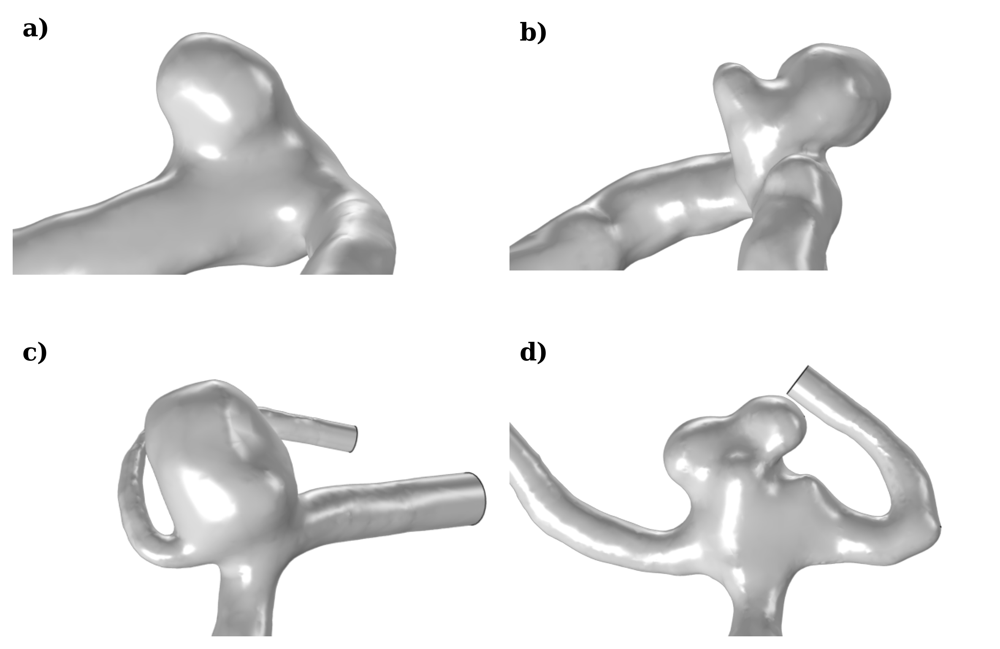

In [ ]:
# ============================================================
# 2x2 aneurysm panel with manual cropping control
# You control crop from LEFT / RIGHT / TOP / BOTTOM per image
# ============================================================

import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------
# IMAGE FILES (order = a, b, c, d)
# ------------------------------------------------
image_paths = [
    "Lateral Regular.png",       # a)
    "Lateral Irregular.png",     # b)
    "Bifurcation Regular.png",   # c)
    "Bifurcation Irregular.png", # d)
]

# ------------------------------------------------
# CROPPING CONTROLS
# You can crop in pixels OR as fraction (0–1)
# Set either px OR frac (leave the other 0)
# ------------------------------------------------
CROP = {
    # format:
    # index: dict(left=..., right=..., top=..., bottom=..., mode="px" or "frac")

    0: dict(left=100, right=100, top=20, bottom=30, mode="px"),     # a)
    1: dict(left=0, right=180, top=20, bottom=30, mode="px"),     # b)
    2: dict(left=100, right=180, top=20, bottom=30, mode="px"),     # c)
    3: dict(left=100, right=100, top=0, bottom=0, mode="px"),     # d)
}

# Example:
# CROP[0] = dict(left=80, right=0, top=0, bottom=0, mode="px")
# CROP[1] = dict(left=0.05, right=0.10, top=0, bottom=0, mode="frac")

# ------------------------------------------------
# Plot settings
# ------------------------------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
})

fig, axes = plt.subplots(2, 2, figsize=(8, 6), dpi=300)
axes = axes.ravel()

panel_labels = ["a)", "b)", "c)", "d)"]

# ------------------------------------------------
# Function to crop image
# ------------------------------------------------
def manual_crop(img, crop_dict):
    w, h = img.size

    left = crop_dict["left"]
    right = crop_dict["right"]
    top = crop_dict["top"]
    bottom = crop_dict["bottom"]
    mode = crop_dict["mode"]

    if mode == "frac":
        left   = int(left   * w)
        right  = int(right  * w)
        top    = int(top    * h)
        bottom = int(bottom * h)

    x0 = left
    x1 = w - right
    y0 = top
    y1 = h - bottom

    return img.crop((x0, y0, x1, y1))

# ------------------------------------------------
# Build figure
# ------------------------------------------------
for i, (ax, img_path, label) in enumerate(zip(axes, image_paths, panel_labels)):

    if not os.path.exists(img_path):
        raise FileNotFoundError(f"{img_path} not found")

    img = Image.open(img_path)

    # Apply manual crop
    img_cropped = manual_crop(img, CROP[i])

    # Show centered
    ax.imshow(img_cropped)
    ax.axis("off")

    # panel label
    ax.text(
        0.02, 0.98,
        label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight="bold",
        ha="left",
        va="top",
        color="black"
    )

plt.tight_layout()
plt.savefig("aneurysm_examples.png", dpi=300, bbox_inches="tight")
plt.savefig("aneurysm_examples.pdf", bbox_inches="tight")
plt.show()